# SETUP

### Import libs

In [1]:
import numpy as np, pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Markdown, display
import warnings
warnings.filterwarnings("ignore")

### Common class and methods for coloring and display

In [2]:
# Setup default environment for display data and charts
def setup_env(seaborn_style = 'ticks', context='paper', max_columns = 200, max_rows=200):
    sns.set_style(seaborn_style)
    sns.set_context(context)
    #sns.set_palette(Cplan.get_palete("blues"))
    pd.set_option("display.max_columns", max_columns, "display.max_rows", max_rows,"display.max_colwidth", 200)
    return

In [3]:
# Color class
class Cplan:
    palettes={
                "default_palette":["#a9a9a9","#1B5886" ,"#F37413","#4c8e06"], #Grey, Blue, Orange
                "oranges" : ['#F7D53D', '#ECBD22', '#F7A400', '#F38701', '#F37413'],
                "oranges_r" : ['#F37413','#F38701','#F7A400',"#ECBD22","#F7D53D"],
                "greys" : ['#ffffff','#eeeeee','#dddddd','#cccccc','#bebebe','#a9a9a9','#949494','#636363'],
                "greys_r" : ['#636363','#949494','#a9a9a9','#bebebe','#cccccc','#dddddd',"#eeeeee","#ffffff"],
                "blues" : ['#deecfb', '#9FE7F5', '#6EB1D6', '#5293BB', '#3776A1', '#1B5886', '#003A6B'],
                "blues_r" : ['#003A6B','#1B5886','#3776A1','#5293BB','#6EB1D6','#9FE7F5','#deecfb'],
                "greens" : ['#d1face', '#73d802', '#4c8e06', '#163805'],
                "greens_r" : ['#163805','#4c8e06','#73d802','#d1face'],
            }
    highlight_color="#1B5886"
    base_color = "#a9a9a9"
    
    @staticmethod
    def print_palettes(palette = "default_palette"):
        colors={} 

        if (palette == "a") | (palette == "A"):
            colors = Cplan.palettes
        else:
            if palette in Cplan.palettes.keys():
                colors[palette] = Cplan.palettes[palette]

        if len(colors)>0:       
            for item in colors:
                display(Markdown(f'<span style="font-family: monospace">{item}</span>'))
                display(Markdown('<br>'.join(
                    f'<span style="font-family: monospace">{color} <span style="color: {color}">████████</span></span>'
                    for color in colors[item]
                )))
        else:
            display(Markdown('<br>'.join(
            f'<span style="font-family: monospace">{color_name}</span>'
            for color_name in Cplan.palettes.keys()
            )))
    @classmethod
    def get_palette(cls,palette= "default_palette"):
        return cls.palettes[palette]
       
    @classmethod
    def reset_color(cls):
        cls.highlight_color="#F37413"
        cls.base_color = "#a9a9a9"

In [4]:
# Set hightlight color on chart
def set_highlight(val,data = None, gtype='color', g=None):
    if gtype=='color':
        palete=[Cplan.highlight_color if x==val else Cplan.base_color for x in data]
        return palete
    if gtype=='xtick':
        for tick_label in g.axes.get_xticklabels():
            if tick_label.get_text()==val:
                tick_label.set_color(Cplan.highlight_color)
                tick_label.set_fontsize("10")
                tick_label.set_fontweight("800")
        return
    if gtype=='ytick':
        for tick_label in g.axes.get_yticklabels():
            if tick_label.get_text()==val:
                tick_label.set_color(Cplan.highlight_color)
                tick_label.set_fontsize("10")
                tick_label.set_fontweight("800")
        return

In [5]:
# Plot custom text on chart
def set_text(g,x,y,text):
    g.text(x, y, text, 
       fontsize = 10,          # Size
       #fontstyle = "oblique",  # Style
       color = Cplan.highlight_color,          # Color
       ha = "center", # Horizontal alignment
       va = "bottom",
        rotation = 0,
    )
    return

In [6]:
# Remove borders of chart
def remove_border(g,left=False, right = True, top=True, bottom  = False):
    g.spines['top'].set_visible(top)
    g.spines['right'].set_visible(right)
    g.spines['left'].set_visible(left)
    g.spines['bottom'].set_visible(bottom)
    
    return

### Common methods for data preparation

In [7]:
def view_description(des,dataset='application_data',cols=[]):
    if len(cols)==0:
        return des[des.Table==dataset][['Row','Description']]
    else:
        return des[(des.Table==dataset)&(des.Row.isin(cols))][['Row','Description']]

In [8]:
#Examining dataset missing values
def examine_data(data, visualize_missing = False, thres=0, figsize=(8,4), annotation=False, savefig=False, filename=''):
    null_data = data.isnull().sum()
    types = data.dtypes
    dtypes=[types[x] for x in null_data.index]
    examine_df =pd.DataFrame({"COLUMN_NAME": null_data.index,
                "NULL_COUNT": null_data.values,
                "DTYPE": dtypes})
    examine_df["NULL_PERCENT"]=examine_df["NULL_COUNT"]/len(data)*100
    examine_df["VARIABLE_TYPE"]=examine_df.DTYPE.apply(lambda x: "categorical" if x==object else "numerical")
    examine_df["HANDLING_METHOD"]="NA"
    
    # plotting missing data
    if visualize_missing== True:
        #colors=[Cplan.highlight_color]
        plot = examine_df[examine_df['NULL_PERCENT']>thres].plot(kind='bar',x='COLUMN_NAME',y='NULL_PERCENT',
                                                            legend=None,
                                                            #title='% of null values',fontsize = 12,
                                                            figsize=figsize)#, color=colors)
        #plt.legend(['% of Null values'],loc = 'best', bbox_to_anchor=(1., 1.), fontsize = 8)
        plt.title('Percentage of null values in each column',fontdict={'size':12, 'weight':800, 'color':Cplan.highlight_color})
        plt.xlabel(xlabel='COLUMN_NAME',fontdict={'size':10, 'weight':800, 'color':Cplan.highlight_color})
        plt.ylabel(ylabel='NULL_PERCENT (%)',fontdict={'size':10, 'weight':800, 'color':Cplan.highlight_color})
        if annotation==True:
            for bar in plot.patches:
                plot.annotate(format(bar.get_height(), '.2f'),
                               (bar.get_x() + bar.get_width() / 2,
                                bar.get_height()), ha='center', va='center',
                               size=8, xytext=(0, 5),
                               textcoords='offset points')
        if savefig==True:
            #filename = 'Images\\missing_values_thres'+ str(thres) + '.png'
            plt.savefig(filename, dpi=100, bbox_inches="tight")
        plt.show()
    return examine_df

In [9]:
# Missing values imputation
def impute(data, cols,val=np.nan, func='value',remove=False,inplace=True):
    if remove == False:
        if func=='value':
            data[cols].fillna(val,inplace=inplace)
            return
        elif func=='mean':
            fill_val = data[cols].mean()
            data[cols].fillna(fill_val,inplace=inplace)
            return
        elif func=='median':
            fill_val = data[cols].median()
            data[cols].fillna(fill_val,inplace=inplace)
            return
        elif func=='mode':
            fill_val = data[cols].mode()[0]
            data[cols].fillna(fill_val,inplace=inplace)
            return
        else:
            return 'Invalid func. Valid: mean, median, mode, value'
    else:
        data.drop(cols, axis=1, inplace=inplace)
        return

### Common methods for data analysis and visualization

In [10]:
# Plot custom chart to univariate analyze
def uni_plot(data, col, var_type = "numerical", n_sub = (1,2), 
                 bins=50, rotation=0, figsize=(8,4), face_highlight=False, text_highlight=False,
                savefig=False, filename='univariate_n.png'):
    fig, axes = plt.subplots(nrows=n_sub[0], ncols=n_sub[1], figsize=figsize)
    titles=[col,col]
    xlabels=[" ", " "]
    ylabels=[" ", " "]
    
    if (var_type== "numerical") | (var_type== "n"):
        #titles=[col + "-Histogram",col+ "-Boxplot"]
        h = sns.histplot(data, x=col,color=Cplan.highlight_color,bins=bins,ax=axes[0])
        b = sns.boxplot(data, x=col,color=Cplan.highlight_color,width=0.6, 
                        linewidth = 1.2,medianprops={"color": "#F37413"},ax=axes[1])
        
        for i,text in enumerate(titles):
            axes[i].set_title(text)
            axes[i].set_xlabel(xlabels[i])
            axes[i].set_ylabel(ylabels[i])
    
    if (var_type== "category") | (var_type== "c"):
        #titles=[col + "-Bar",col+ "-Pie"]
        ylabels=["Percentage", " "]
        s = data[col].value_counts(normalize = True)*100
        explode=[0.1 if x==s.max() else 0 for x in s]
        if face_highlight==True:
            colors=sns.color_palette(set_highlight(val=s.max(),data=s))
        else:
            colors=sns.color_palette()
        b = sns.barplot(x=s.index,y=s.values, ax=axes[0], palette=colors)
        p,texts,autotexts = axes[1].pie(s,autopct='%.1f%%',explode=explode, 
                                        textprops={'fontsize': 8}, pctdistance=1.1)#, colors=colors)
        
        p_legend = axes[1].legend(s.index, loc = 'best', bbox_to_anchor=(1., 0.9), fontsize = 8)
        if text_highlight==True:
            set_highlight(val=s.index[0],gtype='xtick',g=b)
        for i,text in enumerate(titles):
            axes[i].set_title(text)
            axes[i].set_xlabel(xlabels[i])
            axes[i].set_ylabel(ylabels[i])
            axes[i].tick_params(axis='x',rotation=rotation)
    
    if savefig == True:
        plt.savefig(filename, dpi=100, bbox_inches="tight")
    
    fig.tight_layout()
    plt.show()
    return

In [70]:
# Plot charts to bivariate analyze
def bi_plot(data, col,target='TARGET',var_type = "numerical", aggfunc='count',
                n_sub = (1,2), transform=True,
                bins=50, rotation=0, figsize=(8,4), face_highlight=False, text_highlight=False,
               savefig=False, filename=''):
    
    titles=[col,col]
    xlabels=[" ", " "]
    ylabels=[" ", " "]
    
    if (var_type== "numerical") | (var_type== "n"):
        titles=[' ',' ']
        xlabels=['', target]
        ylabels=[col, " "]
        fig, axes = plt.subplots(nrows=n_sub[0], ncols=n_sub[1], figsize=figsize)
        h = sns.histplot(data, y=col,hue=target ,hue_order =[0,1],
                         palette=[Cplan.base_color,Cplan.highlight_color],bins=bins,ax=axes[0])
        #b = sns.boxplot(data, x=target,y=col,palette=[Cplan.base_color,Cplan.highlight_color],width=0.6, 
        #                linewidth = 1.2,medianprops={"color": "#F37413"},ax=axes[1])
        sns.violinplot(data,y=col,x=target,palette=[Cplan.base_color,Cplan.highlight_color])
        
        for i,text in enumerate(titles):
            axes[i].set_title(text)
            axes[i].set_xlabel(xlabels[i])
            axes[i].set_ylabel(ylabels[i])
    
    if (var_type== "category") | (var_type== "c"):
        titles=['Distribution of values','% in target segments']
        fig, axes = plt.subplots(nrows=n_sub[0], ncols=n_sub[1], figsize=figsize, sharey=True)
        #Prepare data
        if transform==False:
            d=pd.crosstab(index=data[target], columns=data[col])
            d1=pd.crosstab(index=data[target], columns=data[col], normalize='index')
            xlabels=["Count", "Percent(%)"]
            ylabels=[target, " "]
            legend_title=col
        else:
            xlabels=["Count", "Percent(%)"]
            ylabels=[col, " "]
            legend_title=target
            d=pd.crosstab(index=data[col], columns=data[target])
            d1=pd.crosstab(index=data[col], columns=data[target], normalize='index')
        
        if face_highlight==True:
            colors=sns.color_palette(set_highlight(val=1, data=d.columns))
        else:
            colors=sns.color_palette()
        
        d.plot(kind='barh', stacked=True, ax=axes[0], color=colors)
        axes[0].legend([],[],frameon=False)
        d1.plot(kind='barh', stacked=True,ax=axes[1], color=colors)
        p_legend = axes[1].legend(d.columns,title=legend_title ,loc = 'best', bbox_to_anchor=(1., 1.), fontsize = 8)
        #if text_highlight==True:
        #    set_highlight(val=s.index[0],gtype='xtick',g=b)
        for i,text in enumerate(titles):
            axes[i].set_title(text)
            axes[i].set_xlabel(xlabels[i])
            axes[i].set_ylabel(ylabels[i])
            axes[i].tick_params(axis='x',rotation=rotation)
    
    if savefig == True:
        if len(filename)==0:
            filename = 'Images\\bivariate_' + col + '.png'
        plt.savefig(filename, dpi=100, bbox_inches="tight")
    fig.tight_layout()
    plt.show()
    return

In [11]:
#Visuallize all univariate variables by type
def plot_all(data,cols=[] ,var_type='categorical', ncols=3,chart='histogram', figsize=(10,10),nbins=50,
            savefig = False, filename='plot_all_hist.png'):
    if len(cols)==0:
        a=data.dtypes
        if var_type in ['categorical','c'] :
            cols = a[(a==object)].index
        else:
            cols = a[(a==float)|(a==int)|(a=="int64")].index
    nrows=(len(cols)-1)//ncols + 1
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    for i,col in enumerate(cols):
        x=i//ncols
        y=i%ncols
        ax = (axes[y] if nrows==1 else axes[x,y])
        if var_type in ['categorical','c']: #Category
            s=round(data[col].value_counts(normalize=True)*100,1)
            colors=sns.color_palette(set_highlight(val=s.max(),data=s))
            sns.barplot(y=s.index,x=s.values, ax= ax, palette=colors,orient='h',order=s.index)
            ax.tick_params(axis='y',rotation=0, labelsize=8)
            ax.set_xlabel("Percentage (%)",fontsize =10)
            ax.set_ylabel(" ")
        elif var_type in ['numerical','n']:
            if chart=='histogram':
                sns.histplot(data,x=col,bins=nbins ,ax=ax)
            elif chart=='boxplot':
                sns.boxplot(data, x=col,width=0.6,linewidth = 1.2,ax=ax,medianprops={"color": "#F37413"})
            ax.tick_params(axis='both',rotation=0, labelsize=8)
            ax.set_xlabel(" ")
            ax.set_ylabel(" ")
            
        ax.set_title(col,fontdict={'fontsize': 12, 'fontweight' : 500, 'color' : Cplan.highlight_color})
        
    if savefig == True:
        plt.savefig(filename, dpi=100, bbox_inches="tight")
            
    plt.tight_layout()
    plt.show()
    return

In [13]:
#Mutivariate visualisation
def multi_plot(data, var1, var2, target='TARGET',var_type = 'c', chart='sbar',figsize=(8,4), 
               estimator='median', savefig=False, filename=''):
    match var_type:
        case 'c':
            if chart=='sbar':
                n_cols = 3
                n_rows=(len(data[var1].unique())-1)//n_cols +1
                fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(10,3*n_rows))
                i=0
                for category in data[var1].unique():
                    x= i//n_cols
                    y= i%n_cols
                    if n_rows==1:
                        ax=axes[i]
                    else:
                        ax = axes[x,y]
                    sub_df = data[data[var1] == category]
                    stacked_bar = pd.crosstab(index=sub_df[var2], columns=sub_df[target]).plot(kind='bar', 
                                                                                               stacked=True, ax=ax)
                    ax.set_title(var1 + ' = ' + str(category))
                    #axes[i].set_xlabel(xlabels[i])
                    ax.set_ylabel('count')
                    ax.tick_params(axis='x',rotation=90)
                    i+=1
            elif chart=='heatmap':
                plt.figure(figsize=figsize)
                heatmap = pd.crosstab(index=data[var1], columns= data[var2],values = data[target], aggfunc='mean')
                sns.heatmap(heatmap, annot=True, fmt='.2f', cmap='Blues')
            #plt.show()
        case 'n':
            plt.figure(figsize=figsize)
            ax = sns.relplot(
                        data=data, x=var1, y=var2,
                        col=target, 
                        #hue="day", style="day",
                        kind="scatter"
                        )
            
            #plt.show()
        case 'b':
            plt.figure(figsize=figsize)
            sns.barplot(x=var1, y=var2,hue=target ,data=data, estimator=estimator, ci=None, 
                        palette=Cplan.get_palette())
            plt.xlabel(var1)
            plt.ylabel(var2 + ' ' + estimator.upper())
            plt.title(var1 + ' by ' + var2)
            plt.xticks(rotation=90)
            #plt.show()
        case other:
            return
    
    if savefig == True:
        if len(filename)==0:
            filename = 'Images\\' + var1 + '_' + var2+'_'+ target + '.png'
        plt.savefig(filename, dpi=100, bbox_inches="tight")
    
    plt.tight_layout()
    plt.show()
    return

In [12]:
def find_correlation_list(data, top=10):
    corr = data.corr()
    corr.fillna(0, inplace=True)
    corr_dict ={'Var1':[],
                'Var2': [],
                'Correlation':[]
                }
    for i, x in enumerate(corr.index):
        for j,y in enumerate(corr.index):
            if j<=i:
                corr_dict['Correlation'].append(0)
            else:
                corr_dict['Correlation'].append(corr.iloc[i,j])
            corr_dict['Var1'].append(x)
            corr_dict['Var2'].append(y)

    corr_df=pd.DataFrame(corr_dict)
    corr_df['Correlation_abs'] = abs(corr_df.Correlation)
    corr_df['Correlation'] = round(corr_df.Correlation,2)
    corr_df.sort_values(by='Correlation_abs', ascending=False, inplace=True)
    
    return corr_df[['Var1','Var2','Correlation']].head(top)

In [14]:
def group_analysis(data, data_structure ,cols, target='TARGET', c_chart='sbar',analysis_type='bivariate', figsize = (10,3)):
    if analysis_type == 'bivariate': # bivariate analysis
        
        for x in cols:
            var_type_x = data_structure.VARIABLE_TYPE[data_structure.COLUMN_NAME==x].values[0]
            if var_type_x=='categorical':
                bi_plot(data=data, col=x,target='TARGET', var_type='c', face_highlight=True)
            else:
                bi_plot(data=data, col=x,target='TARGET' ,var_type='n', face_highlight=True)
    else: # multivariate analysis
        for i,x in enumerate(cols):
            for j,y in enumerate(cols):
                if j>i:
                    var_type_x = data_structure.VARIABLE_TYPE[data_structure.COLUMN_NAME==x].values[0]
                    var_type_y = data_structure.VARIABLE_TYPE[data_structure.COLUMN_NAME==y].values[0]
                    if var_type_x=='categorical':
                        if var_type_y == 'categorical':
                            multi_plot(data=data, var1=x, var2=y, target='TARGET', var_type='c', figsize=figsize, 
                                       chart=c_chart)
                        else:
                            multi_plot(data=data, var1=x, var2=y, target='TARGET', var_type='b',figsize=figsize,
                                       estimator='median')
                    else:
                        if var_type_y == 'categorical':
                            multi_plot(data=data, var1=y, var2=x, target='TARGET', var_type='b',figsize=figsize,
                                       estimator='median')
                        else:
                            multi_plot(data=data, var1=x, var2=y, target='TARGET', var_type='n',figsize=figsize)
                     

### Setup environment

In [20]:
setup_env()

### Reading data from datafiles

In [15]:
app_data = pd.read_csv('application_data.csv')
app_pre = pd.read_csv('previous_application.csv')

In [21]:
#check application_data
app_data.head(3)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [22]:
#check application_previous
app_pre.head(3)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0


In [23]:
#Reading column description
column_des = pd.read_csv('columns_description.csv',encoding='cp1252')
column_des.drop("Unnamed: 0", axis=1, inplace=True)
column_des.head(3)

,Table,Row,Description,Special
0,application_data,SK_ID_CURR,ID of loan in our sample,NaN
1,application_data,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,application_data,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN


# A- DATA UNDERSTANDING AND PREPARATION

### 1-Data Understanding

In [24]:
#Check size of data
print('Application_data: ' + str(app_data.shape))
print('Application_previous: ' + str(app_pre.shape))

Application_data: (307511, 122)
Application_previous: (1670214, 37)


#### application_data

In [25]:
#View some data
app_data.head(3)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [26]:
#Description of variables
view_description(column_des, dataset='application_data')

,Row,Description
0,SK_ID_CURR,ID of loan in our sample
1,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)"
2,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving
3,CODE_GENDER,Gender of the client
4,FLAG_OWN_CAR,Flag if the client owns a car
5,FLAG_OWN_REALTY,Flag if client owns a house or flat
6,CNT_CHILDREN,Number of children the client has
7,AMT_INCOME_TOTAL,Income of the client
8,AMT_CREDIT,Credit amount of the loan
9,AMT_ANNUITY,Loan annuity


#### previous_application

In [27]:
#View some data
app_pre.head(3)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0


In [28]:
#Description of variables
view_description(column_des, dataset='previous_application.csv')

,Row,Description
122,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loan applications in Home Credit, previous application could, but not ne..."
123,SK_ID_CURR,ID of loan in our sample
124,NAME_CONTRACT_TYPE,"Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application"
125,AMT_ANNUITY,Annuity of previous application
126,AMT_APPLICATION,For how much credit did client ask on the previous application
127,AMT_CREDIT,"Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approv..."
128,AMT_DOWN_PAYMENT,Down payment on the previous application
129,AMT_GOODS_PRICE,Goods price of good that client asked for (if applicable) on the previous application
130,WEEKDAY_APPR_PROCESS_START,On which day of the week did the client apply for previous application
131,HOUR_APPR_PROCESS_START,Approximately at what day hour did the client apply for the previous application


### 2- Data preparation

#### 2.1- Missing values handling

##### Application_Data

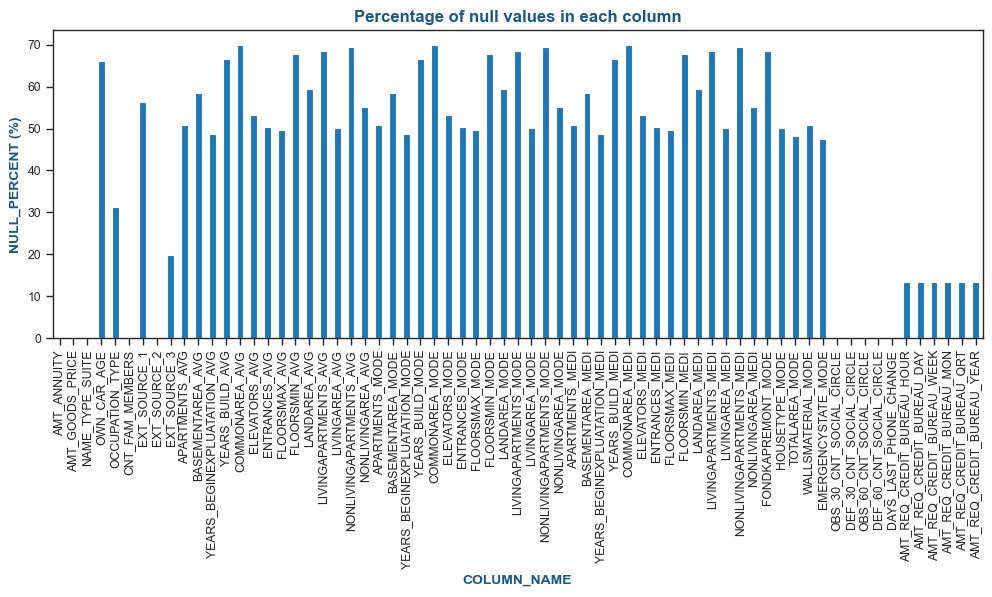

In [29]:
#Inspecting data
app_data_structure = examine_data(app_data, visualize_missing=True, figsize=(12,4))

In [70]:
#Columns having >40% null values
app_data_structure[app_data_structure.NULL_PERCENT>40]

,COLUMN_NAME,NULL_COUNT,DTYPE,NULL_PERCENT,VARIABLE_TYPE,HANDLING_METHOD
21,OWN_CAR_AGE,202929,float64,65.990810,numerical,NA
41,EXT_SOURCE_1,173378,float64,56.381073,numerical,NA
44,APARTMENTS_AVG,156061,float64,50.749729,numerical,NA
45,BASEMENTAREA_AVG,179943,float64,58.515956,numerical,NA
46,YEARS_BEGINEXPLUATATION_AVG,150007,float64,48.781019,numerical,NA
47,YEARS_BUILD_AVG,204488,float64,66.497784,numerical,NA
48,COMMONAREA_AVG,214865,float64,69.872297,numerical,NA
49,ELEVATORS_AVG,163891,float64,53.295980,numerical,NA
50,ENTRANCES_AVG,154828,float64,50.348768,numerical,NA
51,FLOORSMAX_AVG,153020,float64,49.760822,numerical,NA


* Those columns don't hold important information, we can drop

In [30]:
#Drop comlumns having >40% null values
impute(app_data, remove=True, cols=app_data_structure[app_data_structure.NULL_PERCENT>40]["COLUMN_NAME"])

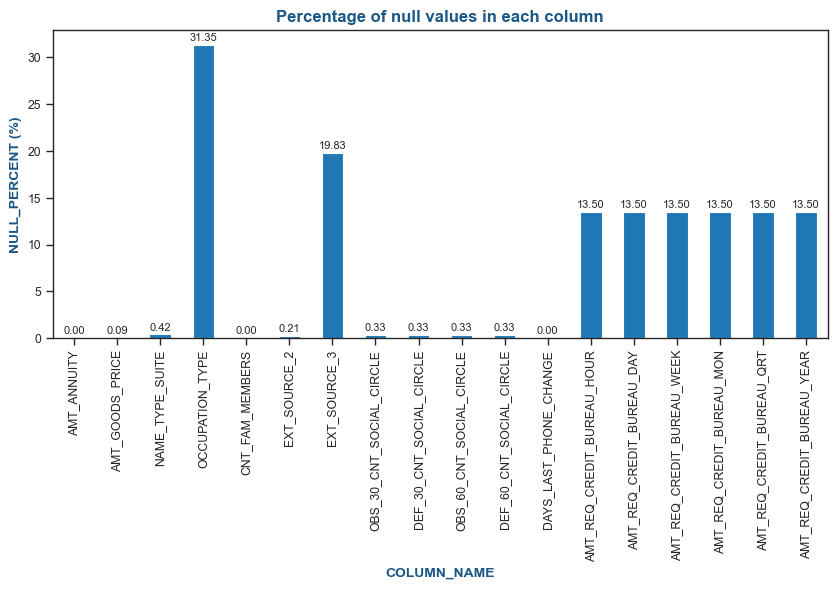

In [31]:
#View other columns which have missing values
app_data_structure = examine_data(app_data, visualize_missing=True, thres=0, annotation=True, figsize=(10,4))

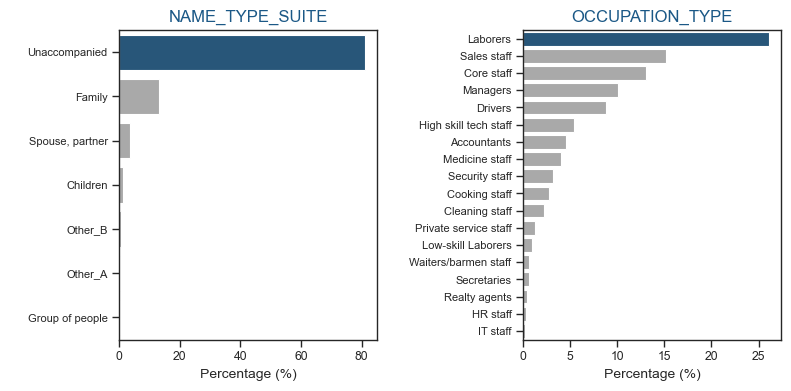

In [32]:
#view value distribution of categorical column
c_cols = app_data_structure.COLUMN_NAME[(app_data_structure.NULL_PERCENT>0) & 
                                        (app_data_structure.VARIABLE_TYPE=='categorical')]
plot_all(app_data, cols=c_cols, var_type='c', ncols=2, figsize=(8,4))


* Impute missing in NAME_TYPE_SUITE, OCCUPATION_TYPE with **mode** value

In [33]:
# Note handling method of columns
app_data_structure.HANDLING_METHOD[app_data_structure.COLUMN_NAME.isin(c_cols)]="mode"

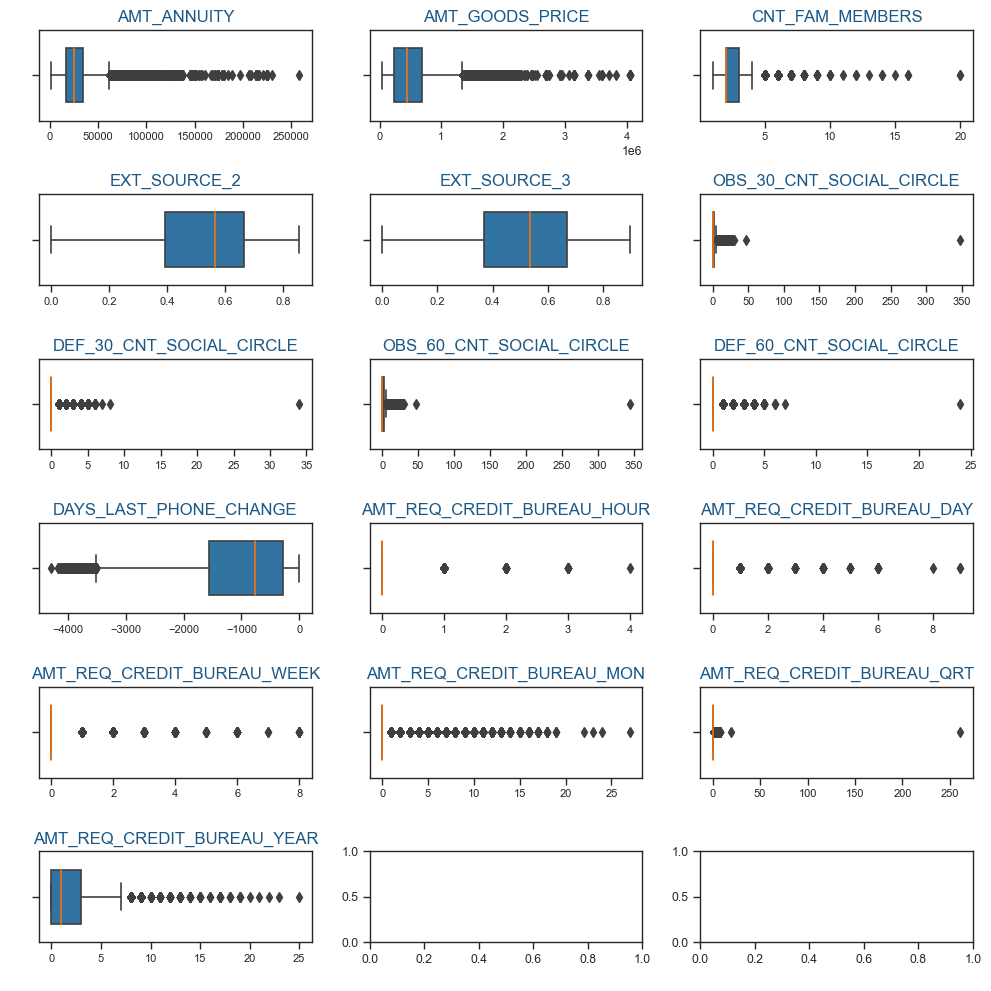

In [34]:
#Numerical coumns
n_cols = app_data_structure.COLUMN_NAME[(app_data_structure.NULL_PERCENT>0) & 
                                        (app_data_structure.VARIABLE_TYPE=='numerical')]
plot_all(app_data, cols=n_cols, var_type='n', chart='boxplot')

* EXT_SOURCE_2, EXT_SOURCE_3 imputed with mean value
* Other Columns: we can see those columns may have outliers => impute with median value

In [35]:
# Note handling method of columns
app_data_structure.HANDLING_METHOD[app_data_structure.COLUMN_NAME.isin(n_cols)]='median'
app_data_structure.HANDLING_METHOD[app_data_structure.COLUMN_NAME.isin(['EXT_SOURCE_2', 'EXT_SOURCE_3'])]='mean'

In [36]:
#Imputing missing values
cols = app_data_structure.COLUMN_NAME[app_data_structure.NULL_PERCENT>0]
handling_method = app_data_structure.HANDLING_METHOD[app_data_structure.NULL_PERCENT>0]
for x,y in zip(cols, handling_method):
    impute(app_data, cols=x, func=y)

In [37]:
#check missing values in app_data again
app_data.isnull().sum()

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RAT

##### Previous_application

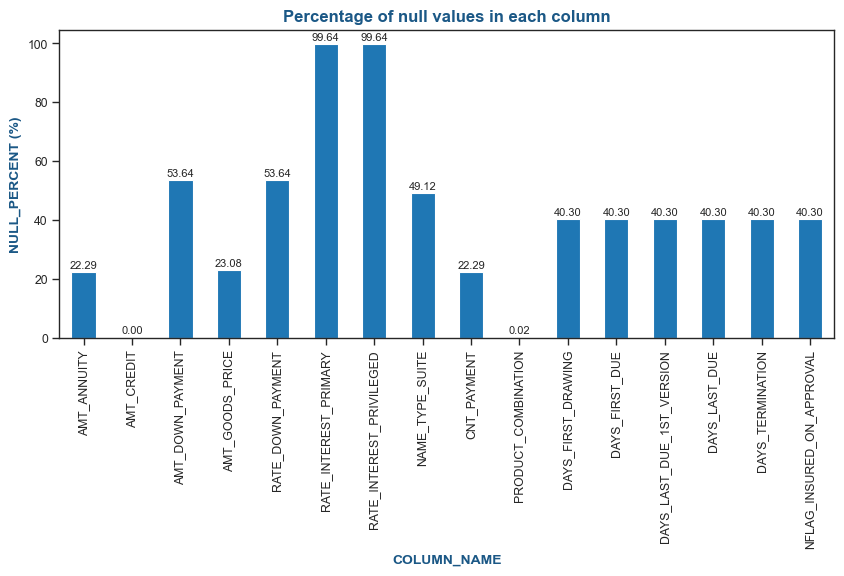

In [38]:
#examining data for missing values, datatype,..
#filename='Images\\app_pre_missing_values.png'
app_pre_structure = examine_data(app_pre, visualize_missing=True, figsize=(10,4), annotation=True)

In [39]:
#Drop columns having >50% null values
impute(data=app_pre, cols=app_pre_structure.COLUMN_NAME[app_pre_structure.NULL_PERCENT>50],remove=True,inplace=True)

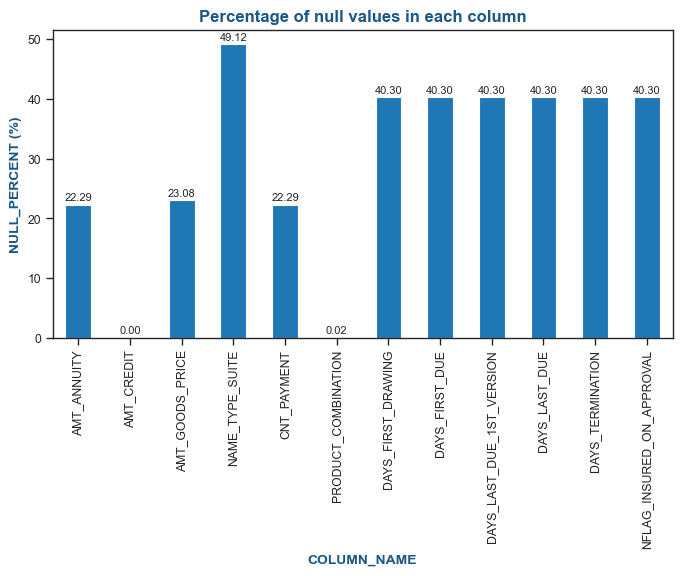

In [40]:
#Re_examining after dropping
app_pre_structure = examine_data(app_pre, visualize_missing=True, annotation=True, figsize=(8,4))

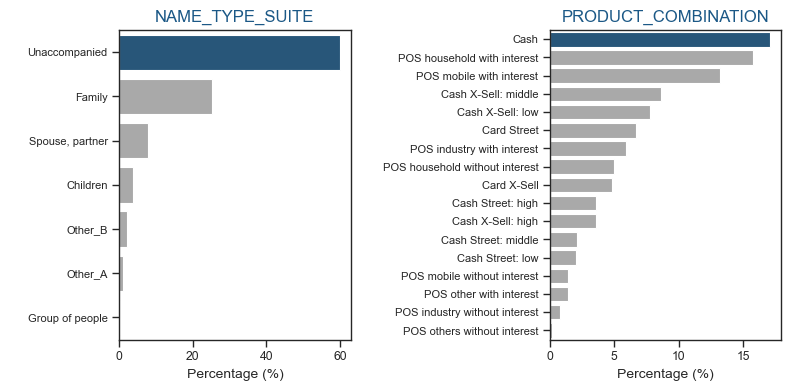

In [41]:
#view value distribution of categorical column
c_cols = app_pre_structure.COLUMN_NAME[(app_pre_structure.NULL_PERCENT>0) & 
                                       (app_pre_structure.VARIABLE_TYPE=='categorical')]
plot_all(app_pre, cols=c_cols, var_type='c', ncols=2, figsize=(8,4))


In [42]:
# Note handling method of columns
app_pre_structure.HANDLING_METHOD[app_pre_structure.COLUMN_NAME.isin(c_cols)]="mode"

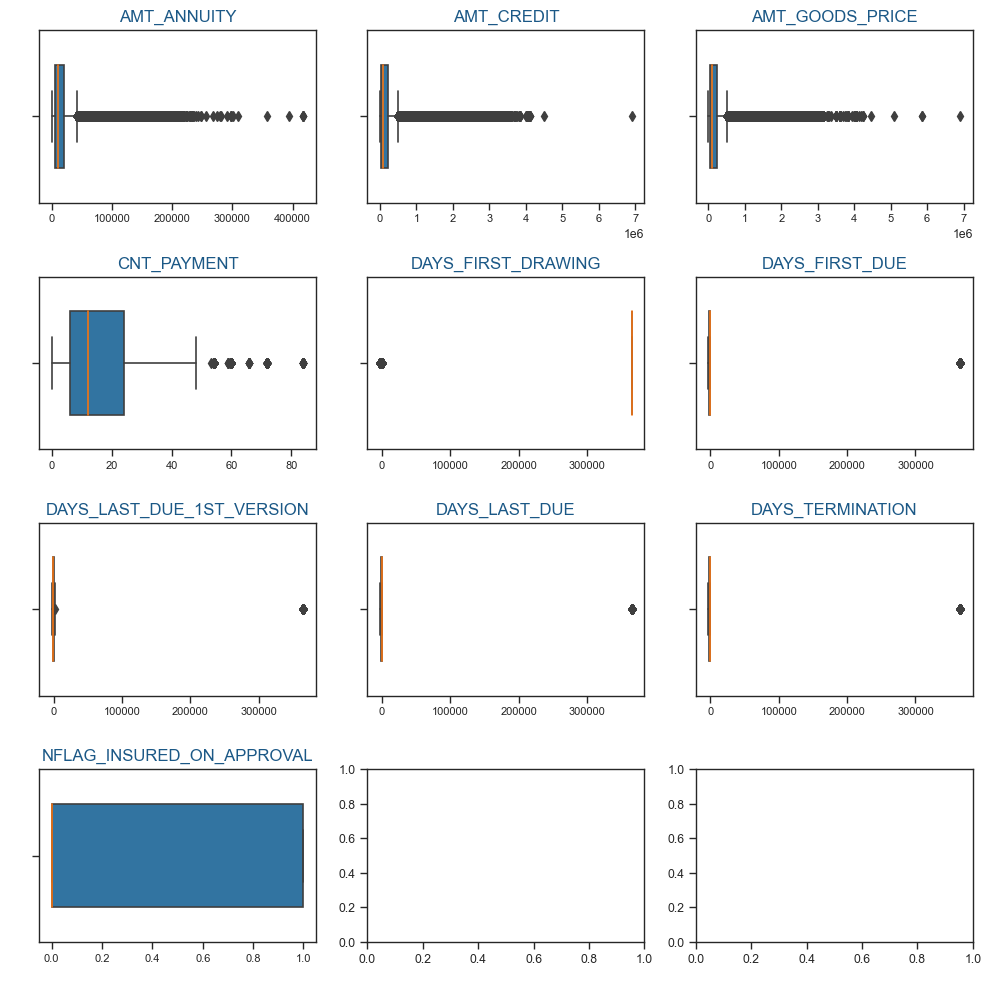

In [43]:
#Numerical coumns
n_cols = app_pre_structure.COLUMN_NAME[(app_pre_structure.NULL_PERCENT>0) & (app_pre_structure.VARIABLE_TYPE=='numerical')]
plot_all(app_pre, cols=n_cols, var_type='n', chart='boxplot')

In [44]:
app_pre.NFLAG_INSURED_ON_APPROVAL.value_counts()

0.0    665527
1.0    331622
Name: NFLAG_INSURED_ON_APPROVAL, dtype: int64

In [30]:
n_cols

3                   AMT_ANNUITY
5                    AMT_CREDIT
6               AMT_GOODS_PRICE
24                  CNT_PAYMENT
27           DAYS_FIRST_DRAWING
28               DAYS_FIRST_DUE
29    DAYS_LAST_DUE_1ST_VERSION
30                DAYS_LAST_DUE
31             DAYS_TERMINATION
32    NFLAG_INSURED_ON_APPROVAL
Name: COLUMN_NAME, dtype: object

* NFLAG_INSURED_ON_APPROVAL imputed with mode value
* Other Columns: we can see those columns may have outliers => impute with median value

In [45]:
# Note handling method of columns
app_pre_structure.HANDLING_METHOD[app_pre_structure.COLUMN_NAME.isin(n_cols)]='median'
app_pre_structure.HANDLING_METHOD[app_pre_structure.COLUMN_NAME.isin(['NFLAG_INSURED_ON_APPROVAL'])]='mode'


In [46]:
#Imputing missing values
cols = app_pre_structure.COLUMN_NAME[app_pre_structure.NULL_PERCENT>0]
handling_method = app_pre_structure.HANDLING_METHOD[app_pre_structure.NULL_PERCENT>0]
for x,y in zip(cols, handling_method):
    impute(app_pre, cols=x, func=y)

In [47]:
#check missing values in app_pre again
app_pre.isnull().sum()

SK_ID_PREV                     0
SK_ID_CURR                     0
NAME_CONTRACT_TYPE             0
AMT_ANNUITY                    0
AMT_APPLICATION                0
AMT_CREDIT                     0
AMT_GOODS_PRICE                0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
FLAG_LAST_APPL_PER_CONTRACT    0
NFLAG_LAST_APPL_IN_DAY         0
NAME_CASH_LOAN_PURPOSE         0
NAME_CONTRACT_STATUS           0
DAYS_DECISION                  0
NAME_PAYMENT_TYPE              0
CODE_REJECT_REASON             0
NAME_TYPE_SUITE                0
NAME_CLIENT_TYPE               0
NAME_GOODS_CATEGORY            0
NAME_PORTFOLIO                 0
NAME_PRODUCT_TYPE              0
CHANNEL_TYPE                   0
SELLERPLACE_AREA               0
NAME_SELLER_INDUSTRY           0
CNT_PAYMENT                    0
NAME_YIELD_GROUP               0
PRODUCT_COMBINATION            0
DAYS_FIRST_DRAWING             0
DAYS_FIRST_DUE                 0
DAYS_LAST_DUE_1ST_VERSION      0
DAYS_LAST_

#### 2.2- Standardise data

In [48]:
app_data.head(3)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.510853,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


* Some columns contain negative values: DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, DAYS_LAST_PHONE_CHANGE, we should change to positive values

In [49]:
app_data['DAYS_BIRTH'] = abs(app_data['DAYS_BIRTH'])
app_data['DAYS_EMPLOYED'] = abs(app_data['DAYS_EMPLOYED'])
app_data['DAYS_REGISTRATION'] = abs(app_data['DAYS_REGISTRATION'])
app_data['DAYS_ID_PUBLISH'] = abs(app_data['DAYS_ID_PUBLISH'])
app_data['DAYS_LAST_PHONE_CHANGE'] = abs(app_data['DAYS_LAST_PHONE_CHANGE'])

In [50]:
app_pre.head(3)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0


* Some columns in previpus_application contain negative values: DAYS_DECISION, DAYS_FIRST_DUE, DAYS_LAST_DUE, DAYS_TERMINATION, we should change to positive values

In [51]:
app_pre['DAYS_DECISION'] = abs(app_pre['DAYS_DECISION'])
app_pre['DAYS_FIRST_DUE'] = abs(app_pre['DAYS_FIRST_DUE'])
app_pre['DAYS_LAST_DUE'] = abs(app_pre['DAYS_LAST_DUE'])
app_pre['DAYS_TERMINATION'] = abs(app_pre['DAYS_TERMINATION'])

<br>



# B- EXPLORATORY DATA ANALYSIS

### 1 - Outliers

In [52]:
#Check numerical variable
app_data_structure.VARIABLE_TYPE[app_data_structure.COLUMN_NAME.isin(['SK_ID_CURR','TARGET'])]='NA'
n_cols=app_data_structure[app_data_structure.VARIABLE_TYPE =='numerical']['COLUMN_NAME']
n_cols

6                    CNT_CHILDREN
7                AMT_INCOME_TOTAL
8                      AMT_CREDIT
9                     AMT_ANNUITY
10                AMT_GOODS_PRICE
16     REGION_POPULATION_RELATIVE
17                     DAYS_BIRTH
18                  DAYS_EMPLOYED
19              DAYS_REGISTRATION
20                DAYS_ID_PUBLISH
21                     FLAG_MOBIL
22                 FLAG_EMP_PHONE
23                FLAG_WORK_PHONE
24               FLAG_CONT_MOBILE
25                     FLAG_PHONE
26                     FLAG_EMAIL
28                CNT_FAM_MEMBERS
29           REGION_RATING_CLIENT
30    REGION_RATING_CLIENT_W_CITY
32        HOUR_APPR_PROCESS_START
33     REG_REGION_NOT_LIVE_REGION
34     REG_REGION_NOT_WORK_REGION
35    LIVE_REGION_NOT_WORK_REGION
36         REG_CITY_NOT_LIVE_CITY
37         REG_CITY_NOT_WORK_CITY
38        LIVE_CITY_NOT_WORK_CITY
40                   EXT_SOURCE_2
41                   EXT_SOURCE_3
42       OBS_30_CNT_SOCIAL_CIRCLE
43       DEF_3

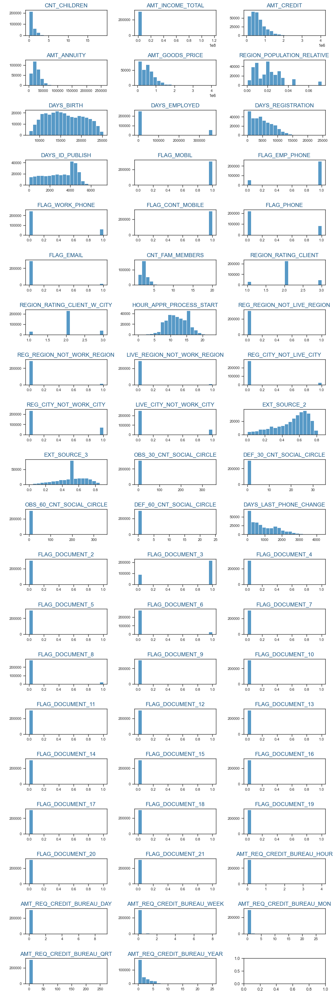

In [53]:
plot_all(data=app_data, cols=n_cols, var_type='n',nbins=20 ,chart='histogram', figsize=(10,30))

We can see:
* Flag columns (with prefix 'FLAG_' or contain '_NOT_' ): Categorical Variables
* Rating Columns (REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY): Categorical Variables

In [54]:
#Change variable type
app_data_structure.VARIABLE_TYPE[(app_data_structure.COLUMN_NAME.str.find('_NOT_') >=0) | 
                                 (app_data_structure.COLUMN_NAME.str.find('FLAG') >=0) |
                                 (app_data_structure.COLUMN_NAME.str.find('RATING') >=0)] = 'categorical'

In [55]:
#Grouping variable for analysis
app_data_structure['GROUP'] = 'NA'
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.str.find('FLAG')>=0] = 'FLAG'
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.str.find('_NOT_')>=0] = 'FLAG'
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.str.find('RATING')>=0] = 'RATING'
app_data_structure.GROUP[(app_data_structure.GROUP=='NA') & (app_data_structure.VARIABLE_TYPE=='categorical')] = 'OTHER'

**Numerical variables analysis**

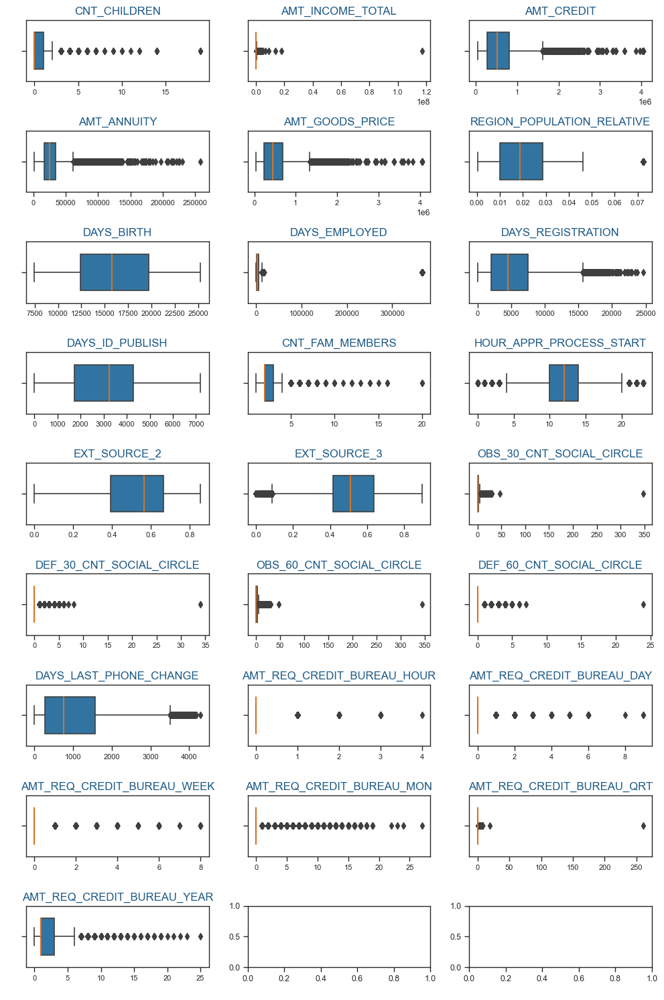

In [56]:
n_cols=app_data_structure[app_data_structure.VARIABLE_TYPE =='numerical']['COLUMN_NAME']
plot_all(data=app_data, cols=n_cols, var_type='n',chart='boxplot', figsize=(10,15))

In [57]:
# Check 95th quantile and max values
q=app_data[n_cols].quantile(0.95, axis=0)
m = app_data[n_cols].max(axis=0)
cols = (m/q).sort_values(ascending=False)
cols

AMT_REQ_CREDIT_BUREAU_WEEK           inf
AMT_REQ_CREDIT_BUREAU_DAY            inf
AMT_REQ_CREDIT_BUREAU_HOUR           inf
AMT_INCOME_TOTAL              346.666667
AMT_REQ_CREDIT_BUREAU_QRT     130.500000
OBS_30_CNT_SOCIAL_CIRCLE       58.000000
OBS_60_CNT_SOCIAL_CIRCLE       57.333333
DEF_30_CNT_SOCIAL_CIRCLE       34.000000
AMT_REQ_CREDIT_BUREAU_MON      27.000000
DEF_60_CNT_SOCIAL_CIRCLE       24.000000
CNT_CHILDREN                    9.500000
AMT_REQ_CREDIT_BUREAU_YEAR      5.000000
CNT_FAM_MEMBERS                 5.000000
AMT_ANNUITY                     4.838734
AMT_GOODS_PRICE                 3.103448
AMT_CREDIT                      3.000000
DAYS_REGISTRATION               2.161177
DAYS_LAST_PHONE_CHANGE          1.701824
REGION_POPULATION_RELATIVE      1.568758
DAYS_ID_PUBLISH                 1.455704
HOUR_APPR_PROCESS_START         1.352941
EXT_SOURCE_3                    1.152188
EXT_SOURCE_2                    1.143536
DAYS_BIRTH                      1.087269
DAYS_EMPLOYED   

Check some columns:

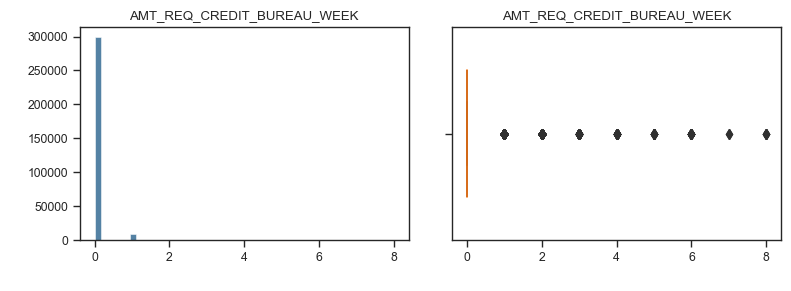

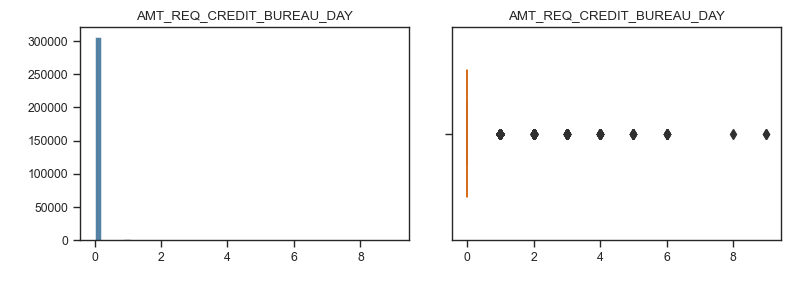

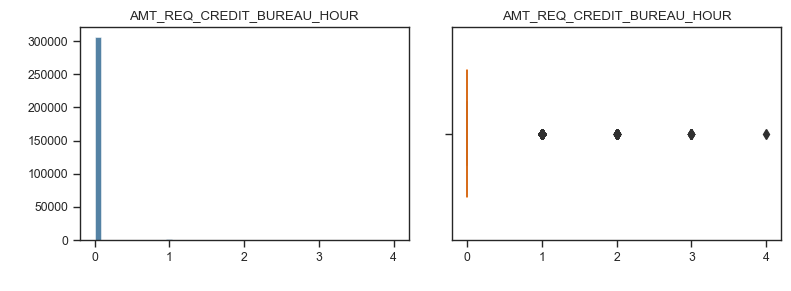

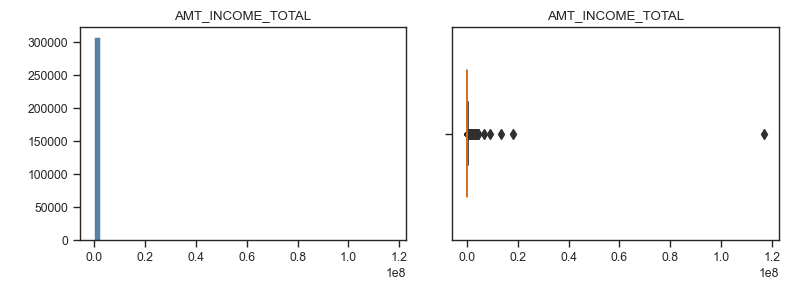

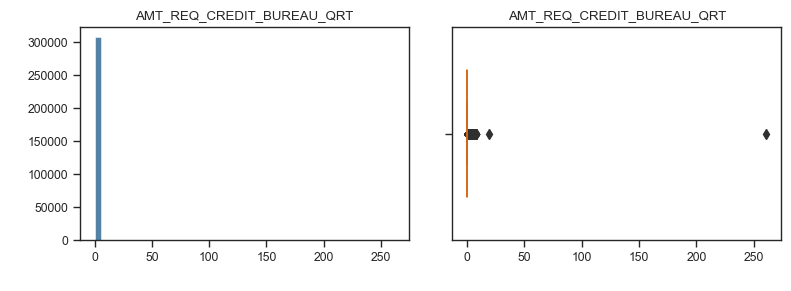

...

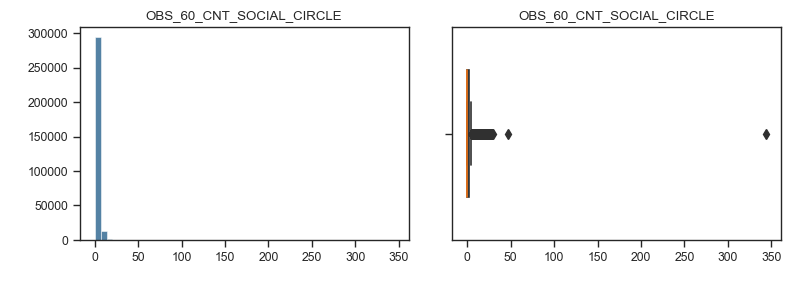

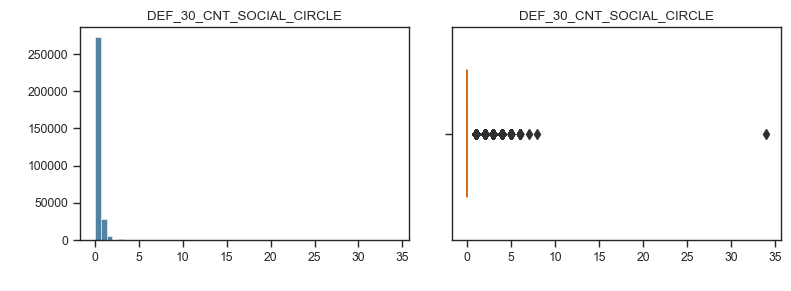

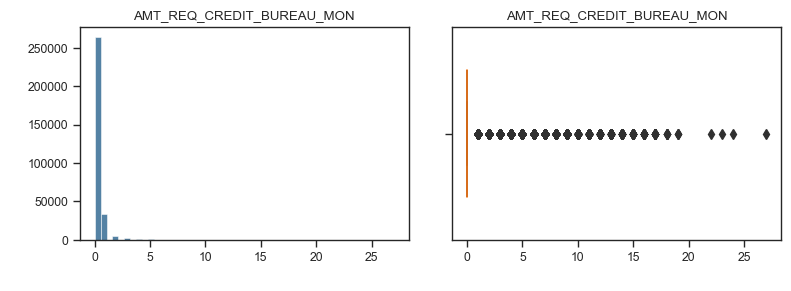

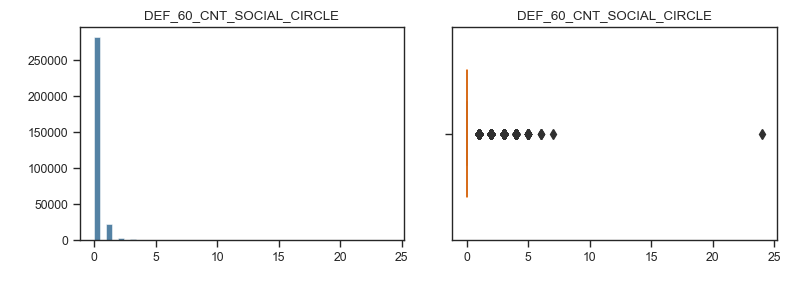

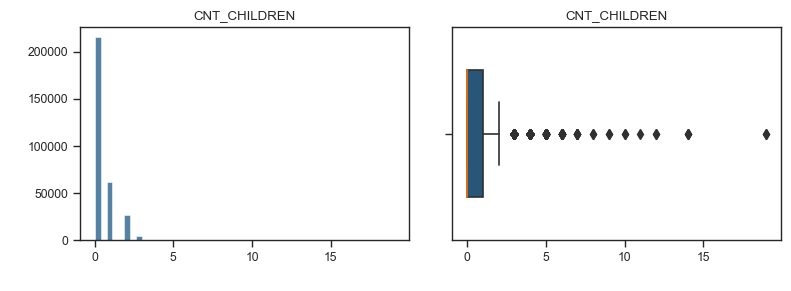

In [58]:
for col in cols[cols>5].index:
    uni_plot(data=app_data, col=col, var_type='n', figsize=(8,3))

In [61]:
app_data.AMT_INCOME_TOTAL.describe()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

**previous_application**

In [62]:
#Check numerical variable
app_pre_structure.VARIABLE_TYPE[app_pre_structure.COLUMN_NAME.isin(['SK_ID_PREV','SK_ID_CURR'])] = 'NA'
n_cols=app_pre_structure[app_pre_structure.VARIABLE_TYPE =='numerical']['COLUMN_NAME']
n_cols

3                   AMT_ANNUITY
4               AMT_APPLICATION
5                    AMT_CREDIT
6               AMT_GOODS_PRICE
8       HOUR_APPR_PROCESS_START
10       NFLAG_LAST_APPL_IN_DAY
13                DAYS_DECISION
22             SELLERPLACE_AREA
24                  CNT_PAYMENT
27           DAYS_FIRST_DRAWING
28               DAYS_FIRST_DUE
29    DAYS_LAST_DUE_1ST_VERSION
30                DAYS_LAST_DUE
31             DAYS_TERMINATION
32    NFLAG_INSURED_ON_APPROVAL
Name: COLUMN_NAME, dtype: object

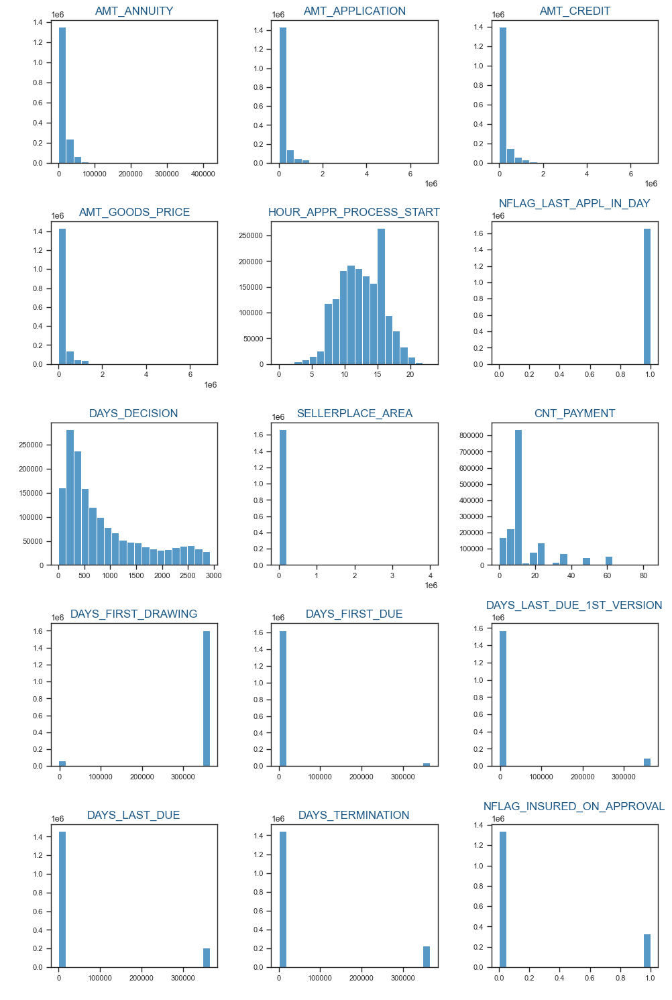

In [63]:
plot_all(data=app_pre, cols=n_cols, var_type='n',nbins=20,chart='histogram', figsize=(10,15))

In [64]:
#Change variable type of flag columns
app_pre_structure.VARIABLE_TYPE[(app_pre_structure.COLUMN_NAME.str.find('NFLAG') >=0)] = 'categorical'

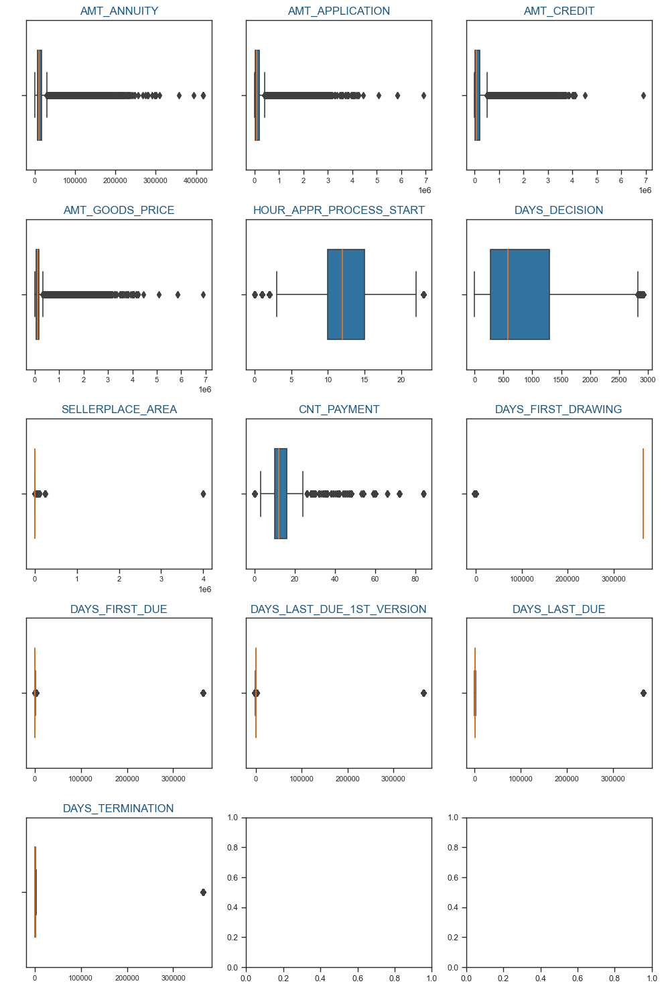

In [65]:
n_cols=app_pre_structure[app_pre_structure.VARIABLE_TYPE =='numerical']['COLUMN_NAME']
plot_all(data=app_pre, cols=n_cols, var_type='n',chart='boxplot', figsize=(10,15))

In [66]:
q=app_pre[n_cols].quantile(0.95, axis=0)
m = app_pre[n_cols].max(axis=0)
cols = (m/q).sort_values(ascending=False)
cols

SELLERPLACE_AREA             2197.802198
DAYS_FIRST_DUE                138.244890
AMT_ANNUITY                     9.962329
AMT_APPLICATION                 8.768457
AMT_GOODS_PRICE                 8.768457
AMT_CREDIT                      7.789239
CNT_PAYMENT                     1.750000
HOUR_APPR_PROCESS_START         1.277778
DAYS_DECISION                   1.141852
DAYS_FIRST_DRAWING              1.000000
DAYS_LAST_DUE_1ST_VERSION       1.000000
DAYS_LAST_DUE                   1.000000
DAYS_TERMINATION                1.000000
dtype: float64

In [67]:
app_pre.SELLERPLACE_AREA.describe()

count    1.670214e+06
mean     3.139511e+02
std      7.127443e+03
min     -1.000000e+00
25%     -1.000000e+00
50%      3.000000e+00
75%      8.200000e+01
max      4.000000e+06
Name: SELLERPLACE_AREA, dtype: float64

**Conclusion:**
* Some columns contain values much bigger than 95th percentile values (i.e. 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_INCOME_TOTAL','AMT_REQ_CREDIT_BUREAU_QRT', 'OBS_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE','AMT_REQ_CREDIT_BUREAU_MON', 'DEF_60_CNT_SOCIAL_CIRCLE','CNT_CHILDREN',..), which are outliers
* Those outliers are normal in most cases, representing unidentified values

### 2- Imbalance checking

#### Checking target variable

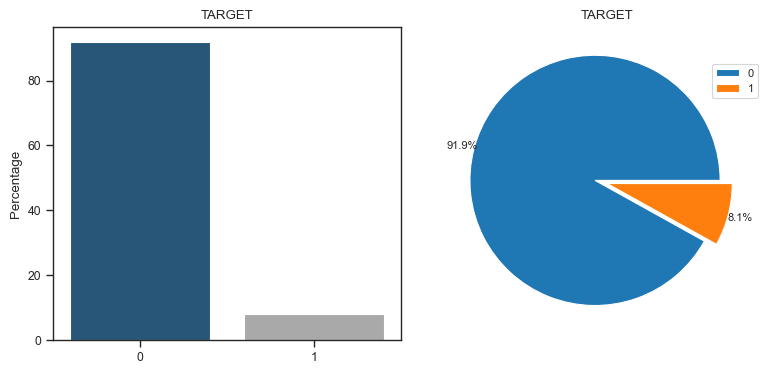

In [68]:
filename = 'Images\\target_imbalance.png'
uni_plot(data=app_data, col='TARGET', var_type='c',figsize=(8,4), face_highlight=True)

From the chart:
* Only 8.1% of observations are defaulter's applications, whereas 91.9% are repayer's => imbalance data
* Imbalance ratio ~11.5

#### Distribution of data by target variable segments

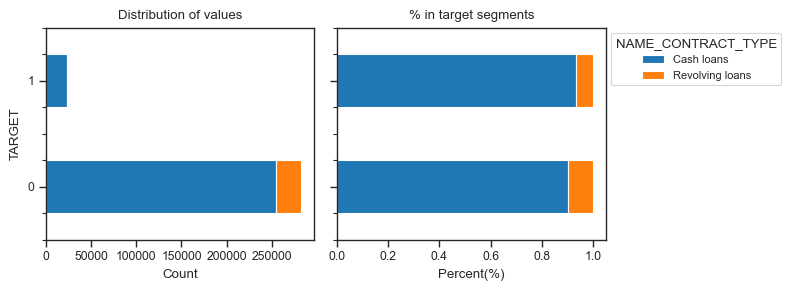

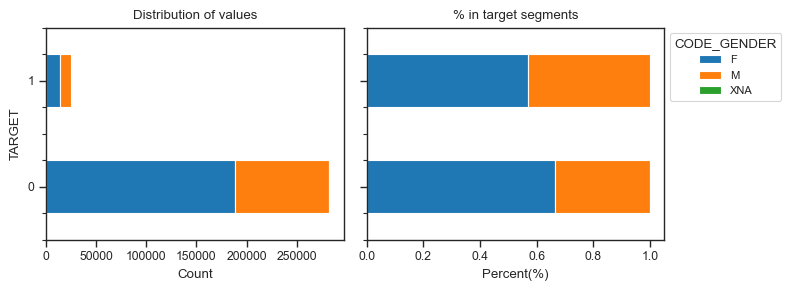

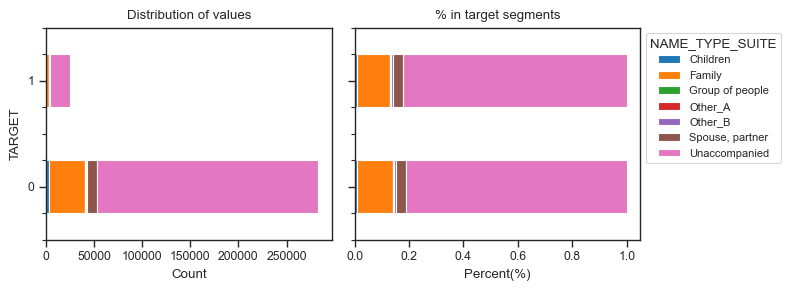

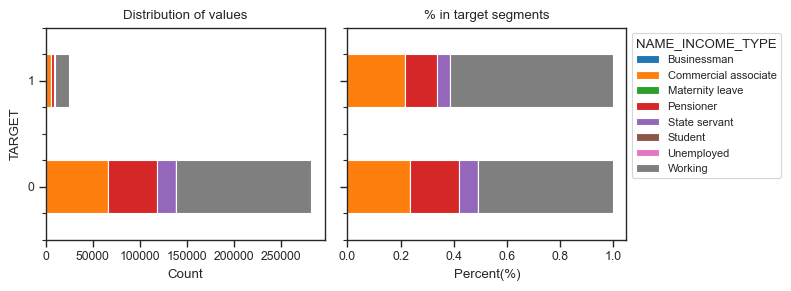

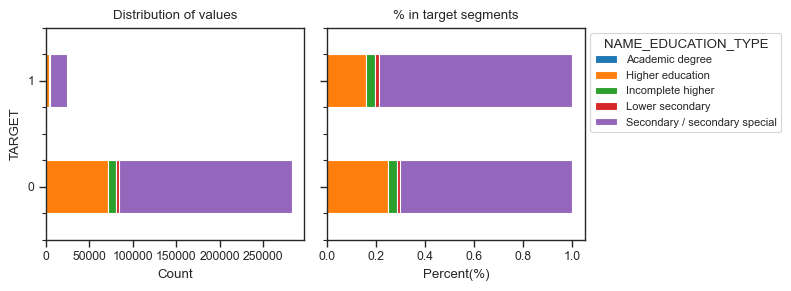

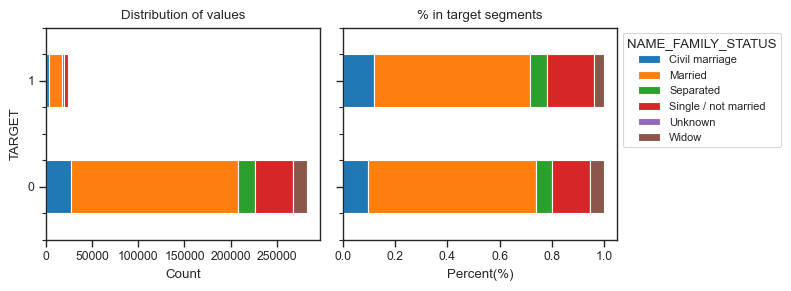

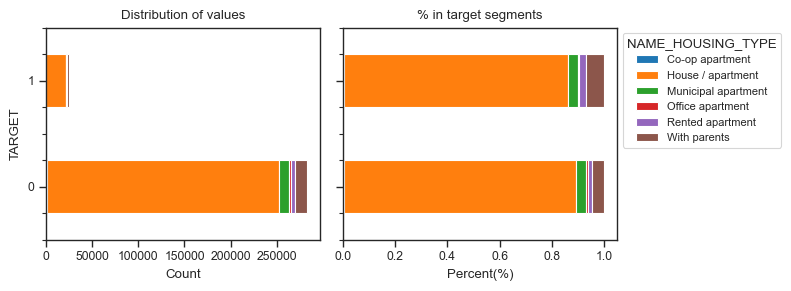

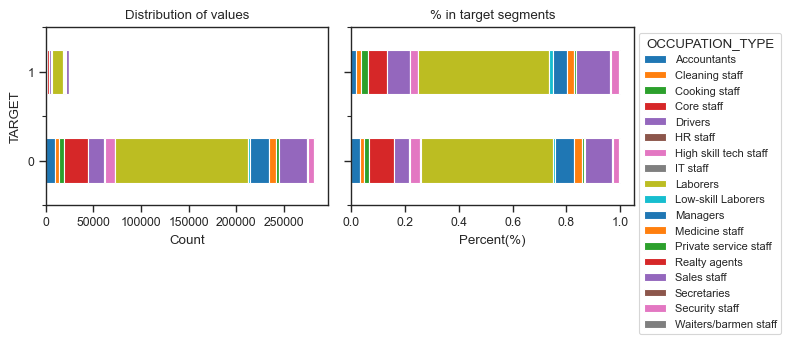

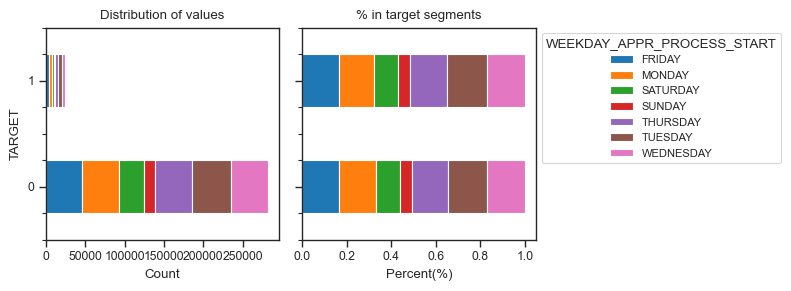

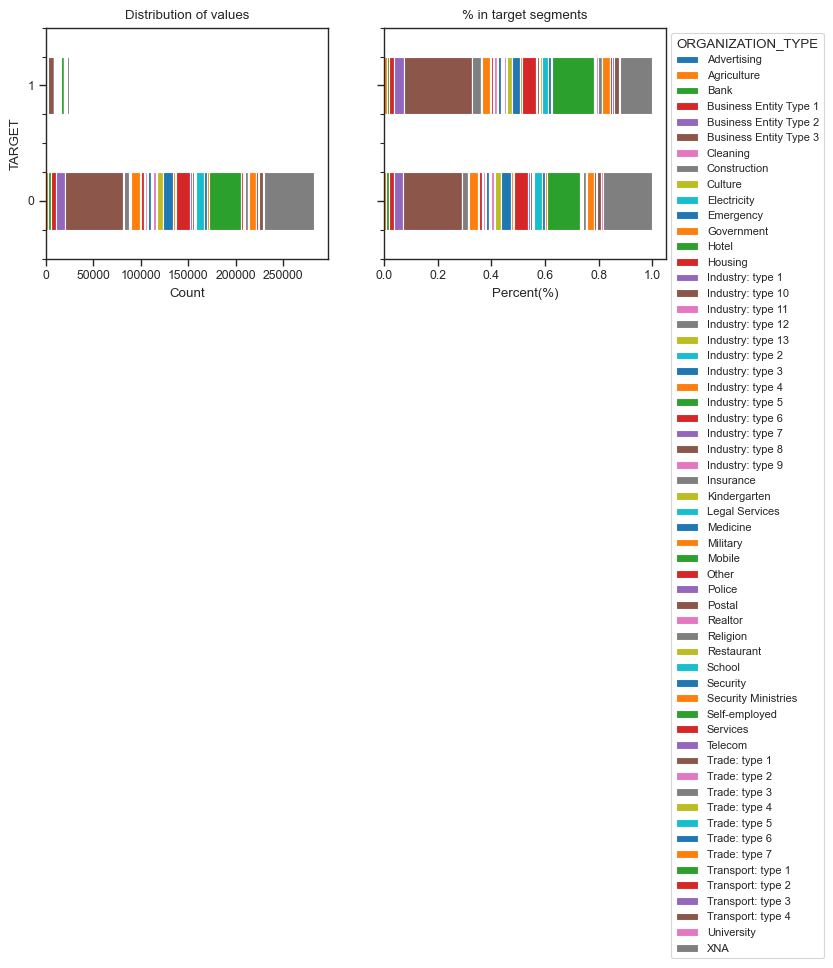

In [71]:
c_cols = app_data_structure[(app_data_structure.VARIABLE_TYPE=='categorical') &
                           (app_data_structure.GROUP=='OTHER')]
for col in c_cols['COLUMN_NAME']:
    bi_plot(data=app_data, col=col, target='TARGET', var_type='c', figsize=(8,3),  transform=False)

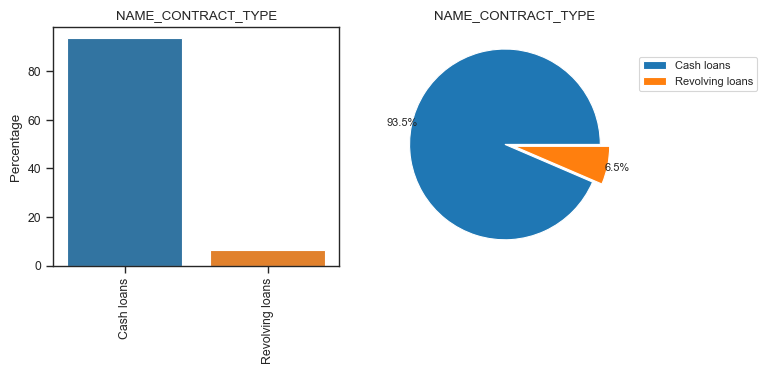

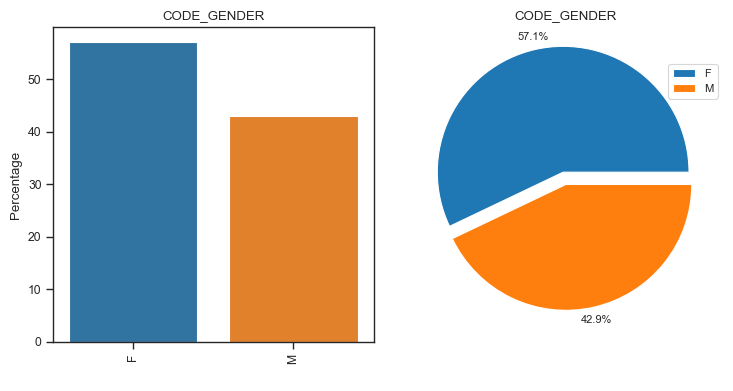

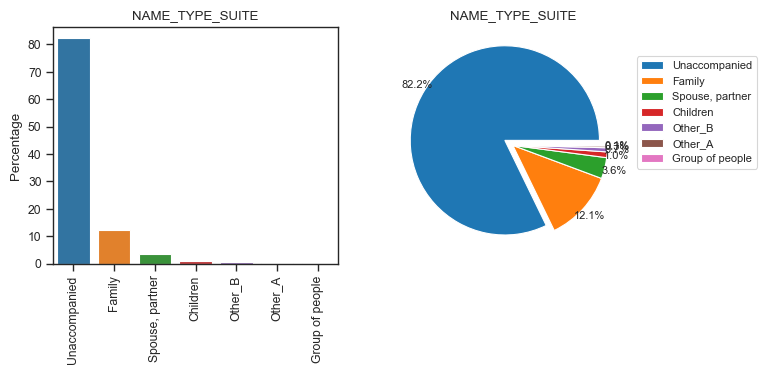

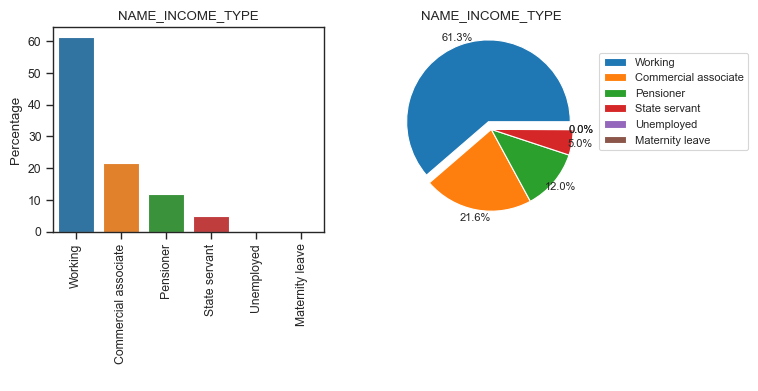

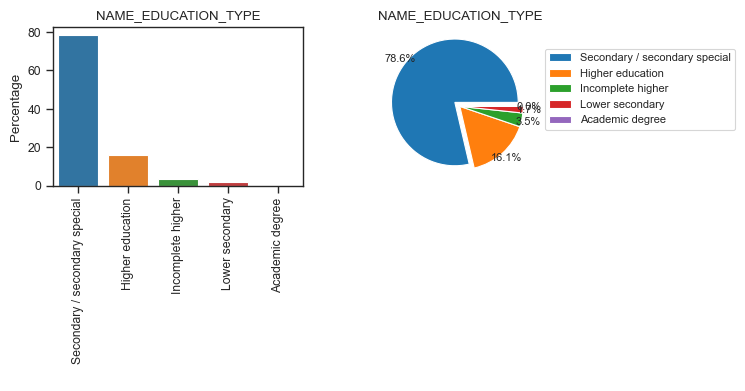

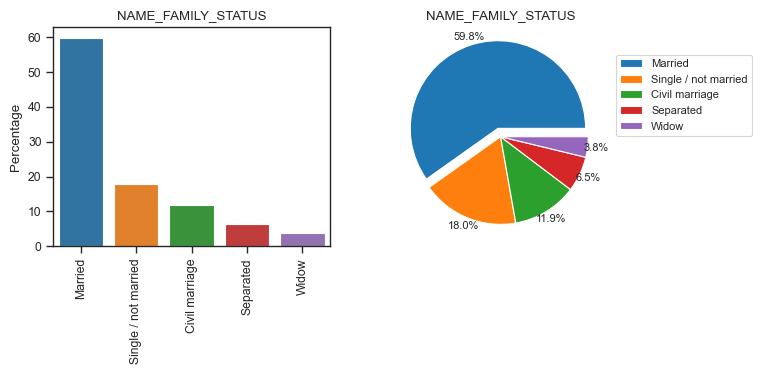

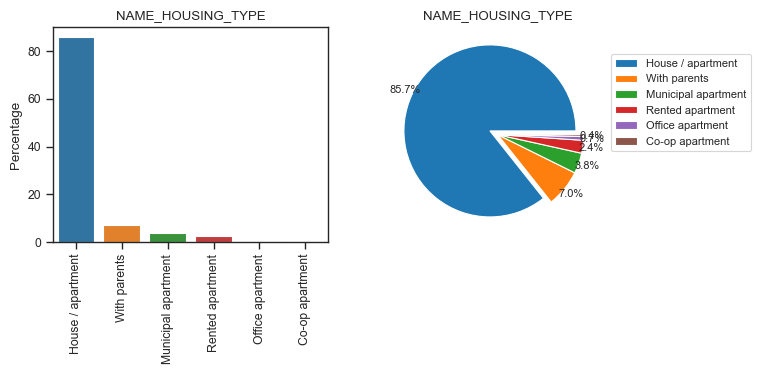

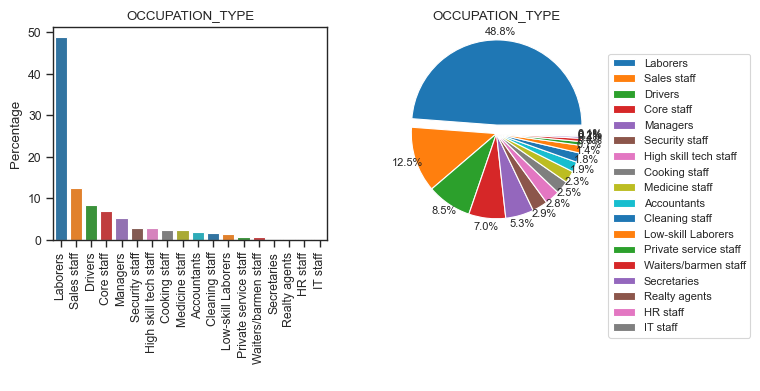

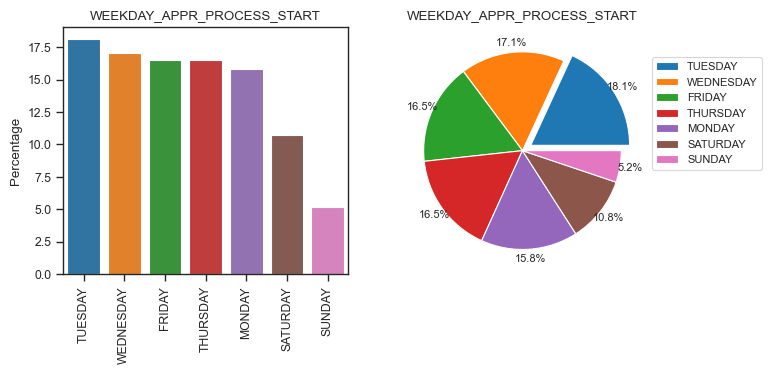

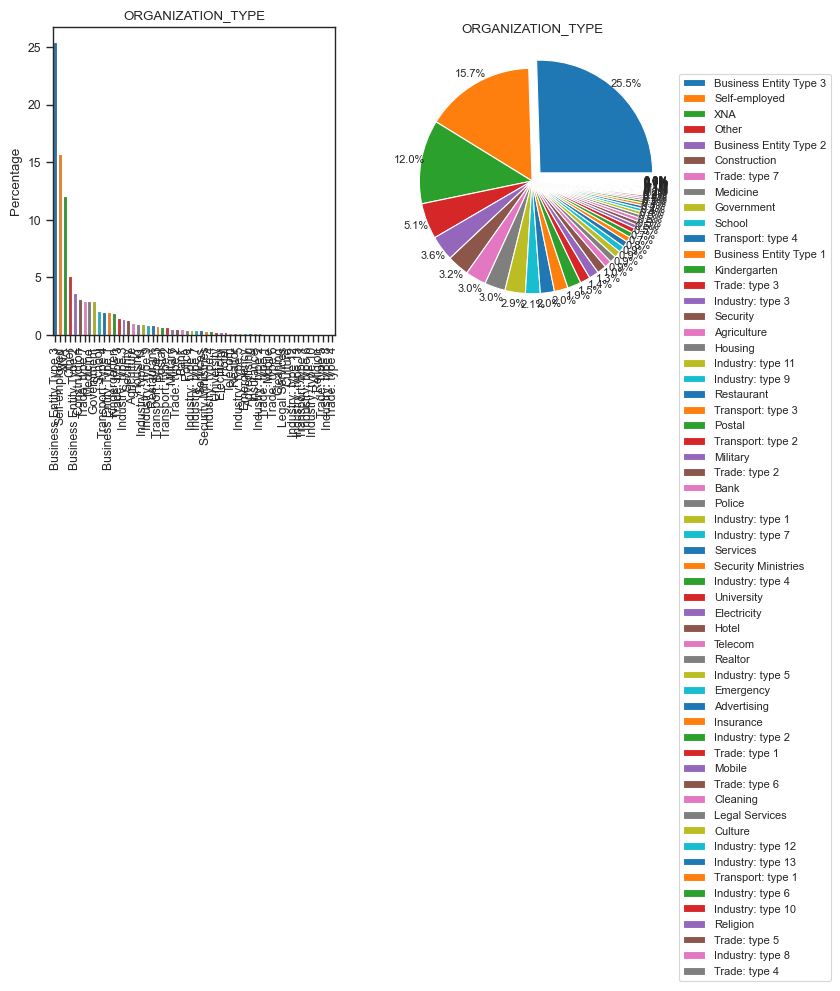

In [50]:
# Distribution in TARGET=1 segment
for col in c_cols['COLUMN_NAME']:
    filename='Images\\' + col + '_imbalance.png'
    uni_plot(data=app_data[app_data.TARGET==1], col=col, var_type='c', figsize=(8,4),rotation=90, 
             savefig=True, filename=filename)

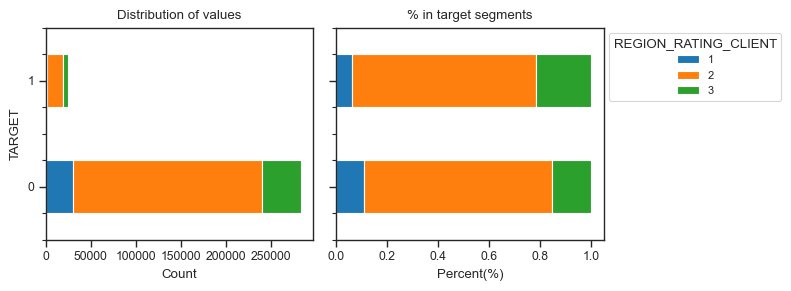

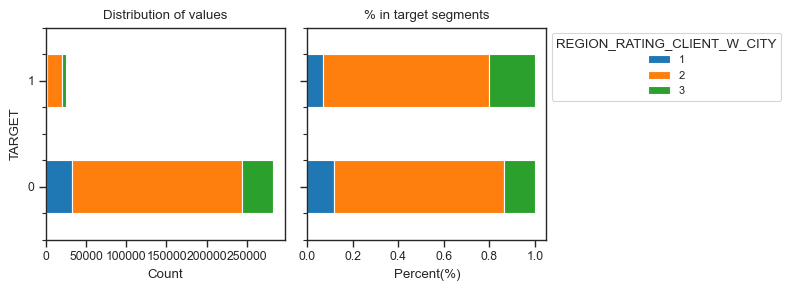

In [72]:
#Rating columns
c_cols = app_data_structure[(app_data_structure.VARIABLE_TYPE=='categorical') &
                           (app_data_structure.GROUP=='RATING')]
for col in c_cols['COLUMN_NAME']:
    bi_plot(data=app_data, col=col, target='TARGET', var_type='c', figsize=(8,3),  transform=False)

* Most of observations have rating 2

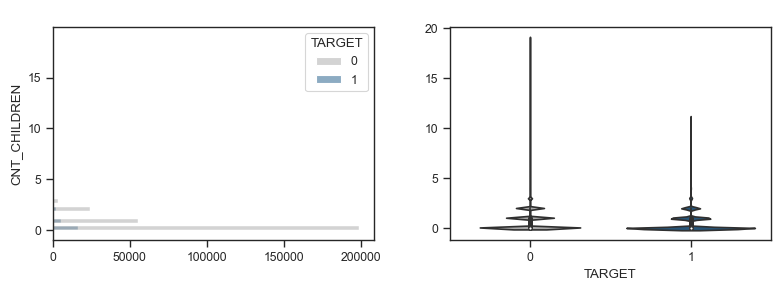

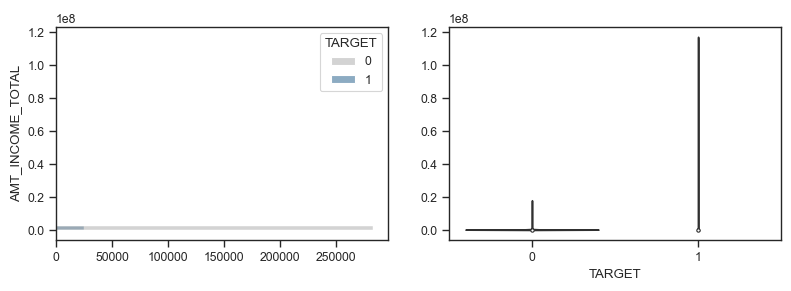

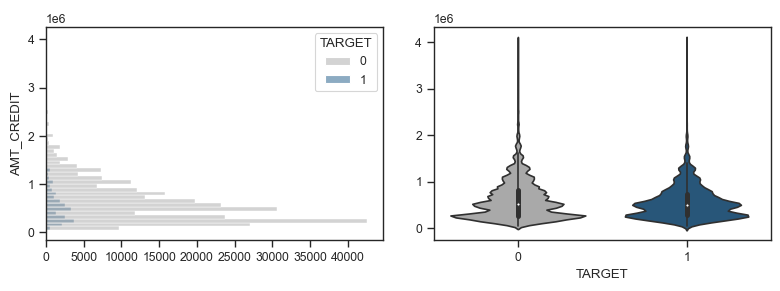

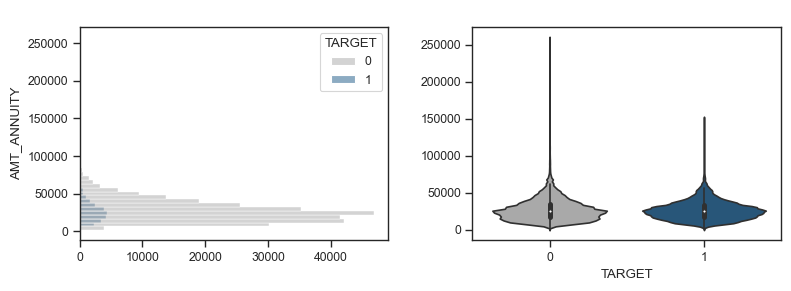

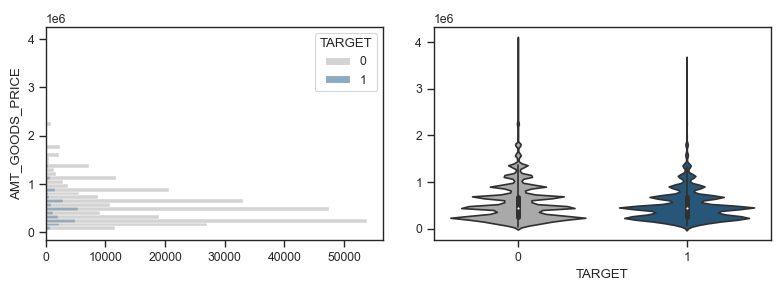

...

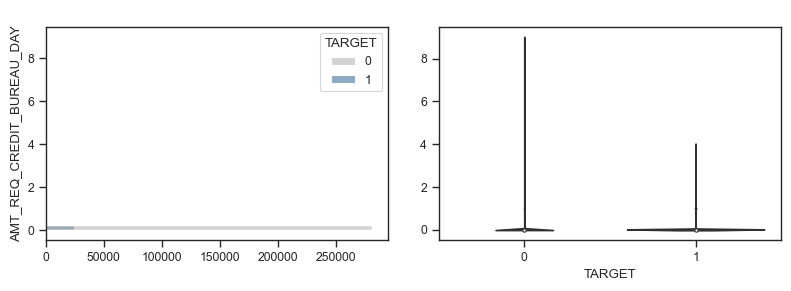

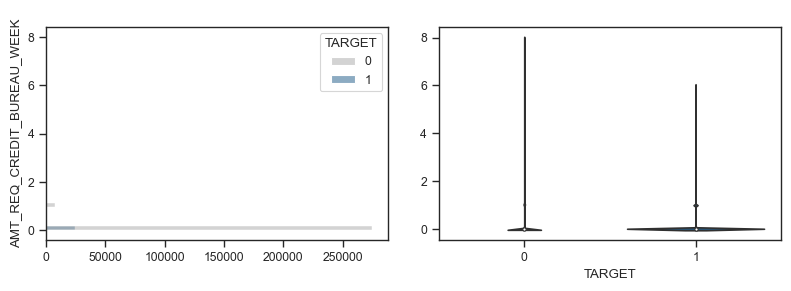

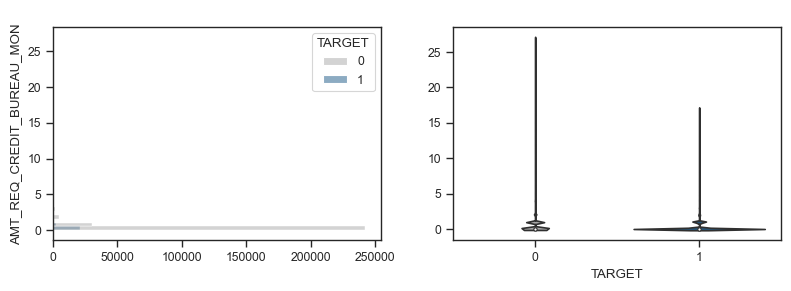

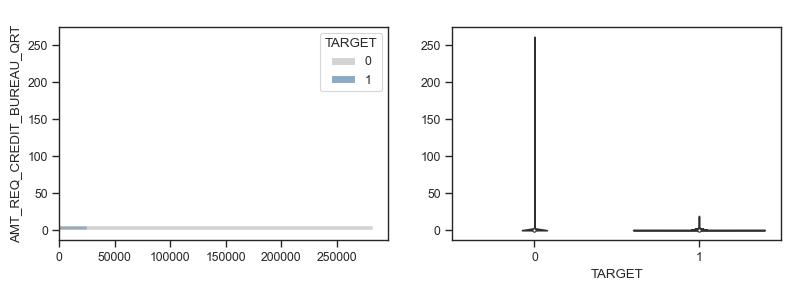

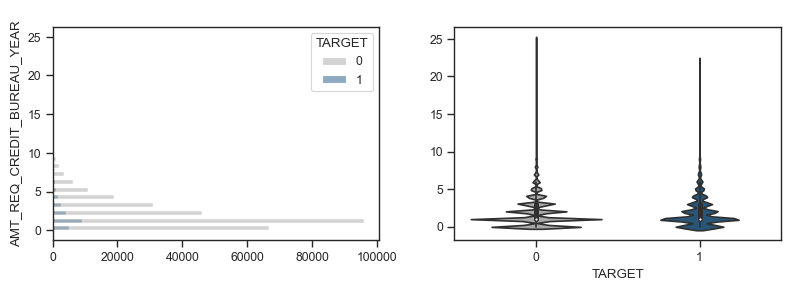

In [73]:
### Numerical columns
n_cols = app_data_structure[(app_data_structure.VARIABLE_TYPE=='numerical')]
for col in n_cols['COLUMN_NAME']:
    bi_plot(data=app_data, col=col, target='TARGET', var_type='n', figsize=(8,3))

**Inference from charts:** Many columns have imbalance data coresponding TARGET=1 (defauter's applications) segment
* NAME_CONTRACT_TYPE: 93.5% of observations are cash loans
* NAME_TYPE_SUITE: 82.2% of observations are Unaccompanied
* NAME_INCOME_TYPE: 61.3% of observations are Unaccompanied Working
* NAME_EDUCATION_TYPE: 78.6% are Secondary / secondary special
* NAME_HOUSING_TYPE: 85.6% are House / apartment
* Most of numerical data are not balance in distribution
..

### 3 - Merging data

In [74]:
merge_df=app_data.merge(app_pre,on='SK_ID_CURR', how='inner', suffixes=['','_PRE'])

In [75]:
merge_df.head(3)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,NAME_CONTRACT_TYPE_PRE,AMT_ANNUITY_PRE,AMT_APPLICATION,AMT_CREDIT_PRE,AMT_GOODS_PRICE_PRE,WEEKDAY_APPR_PROCESS_START_PRE,HOUR_APPR_PROCESS_START_PRE,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_PRE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9,Y,1,XAP,Approved,606,XNA,XAP,Unaccompanied,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,565.0,125.0,25.0,17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.510853,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12,Y,1,XNA,Approved,746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,716.0,-386.0,536.0,527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.510853,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17,Y,1,XAP,Approved,828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,797.0,-647.0,647.0,639.0,0.0


In [76]:
merge_df.shape

(1413701, 105)

In [77]:
merge_df.sort_values(by=['SK_ID_CURR', 'SK_ID_PREV'], inplace=True)

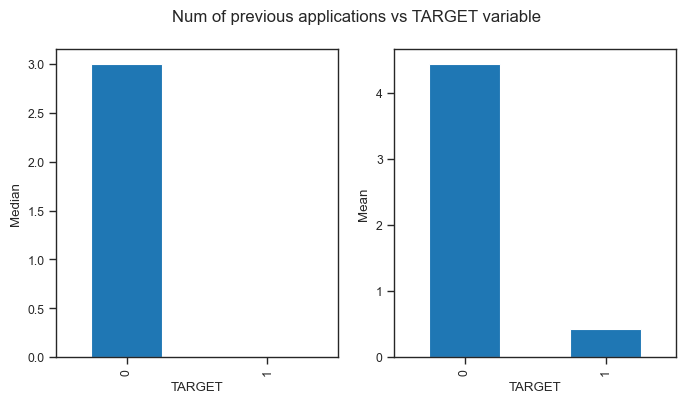

In [79]:
# how many previous applications of each current application
pre_count = pd.crosstab(index=merge_df.SK_ID_CURR, columns=merge_df.TARGET, values=merge_df.SK_ID_PREV, aggfunc='count')
pre_count.fillna(0, inplace=True)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
fig.suptitle('Num of previous applications vs TARGET variable', fontsize=12)
pre_count.median(axis=0).plot(kind='bar', ax=axes[0])
axes[0].set_ylabel('Median')
pre_count.mean(axis=0).plot(kind='bar', ax=axes[1])
axes[1].set_ylabel('Mean')
#plt.savefig('Images\\nums_of_pre_applications.png', dpi=100, bbox_inches="tight")
plt.show()

Infer from chart:
* Most of defaulter haven't applied for loan in history

In [80]:
#Get most recent loan data of previous applications and combine with current application data
combined_df=merge_df.drop_duplicates(subset=app_data.columns, keep='last')

In [81]:
combined_df.shape

(291057, 105)

### 4- Explore correlations

In [82]:
#Top 10 correlation variables of TARGET=1 segment
defaulter = app_data[app_data.TARGET == 1]
corr_top10_defaulter = find_correlation_list(defaulter, top=10)

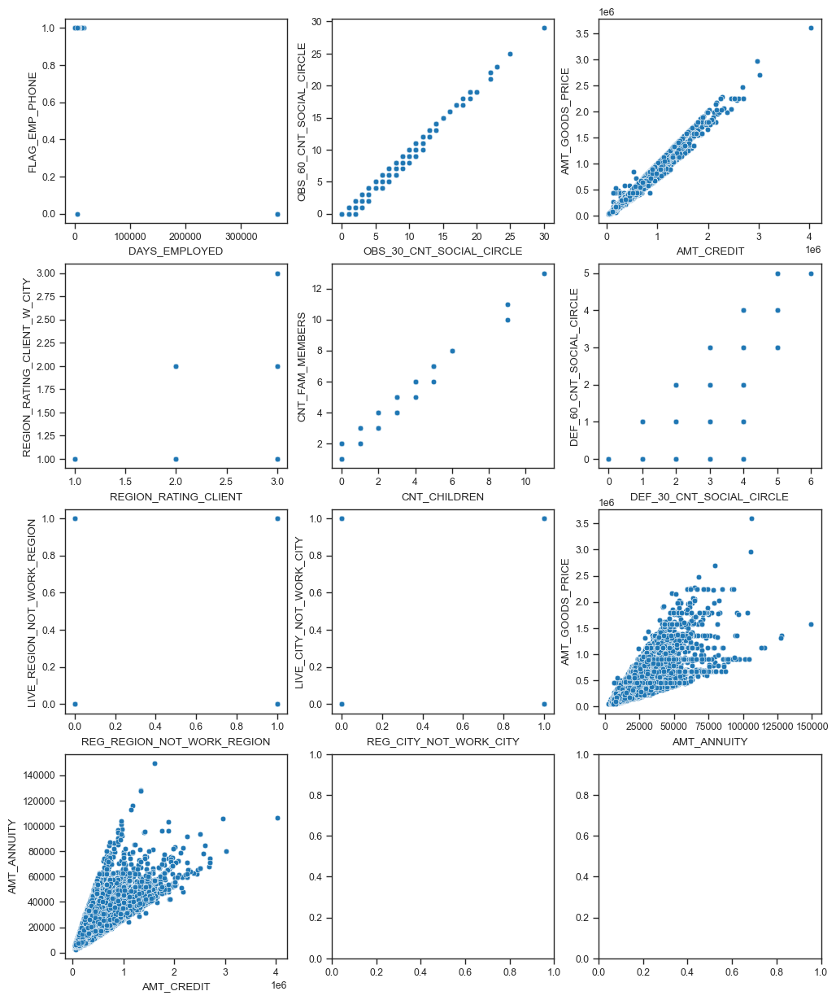

In [83]:
#correlation visualization
i=0
ncols=3
nrows = len(corr_top10_defaulter)//ncols + 1
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(12,15))
for x,y in zip(corr_top10_defaulter.Var1,corr_top10_defaulter.Var2):
    row = i//ncols
    col=i%ncols
    sns.scatterplot(defaulter, x= x, y=y, ax=axes[row,col])
    i+=1
plt.show()

In [84]:
#Top 10 correlation variables of other cases
repayer = app_data[app_data.TARGET == 0]
corr_top10_repayer = find_correlation_list(repayer, top=10)
corr_top10_repayer

,Var1,Var2,Correlation
562,DAYS_EMPLOYED,FLAG_EMP_PHONE,-1.00
1862,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,1.00
250,AMT_CREDIT,AMT_GOODS_PRICE,0.99
1179,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,0.95
140,CNT_CHILDREN,CNT_FAM_MEMBERS,0.88
1427,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,0.86
1924,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,0.86
1613,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,0.83
311,AMT_ANNUITY,AMT_GOODS_PRICE,0.78
249,AMT_CREDIT,AMT_ANNUITY,0.77


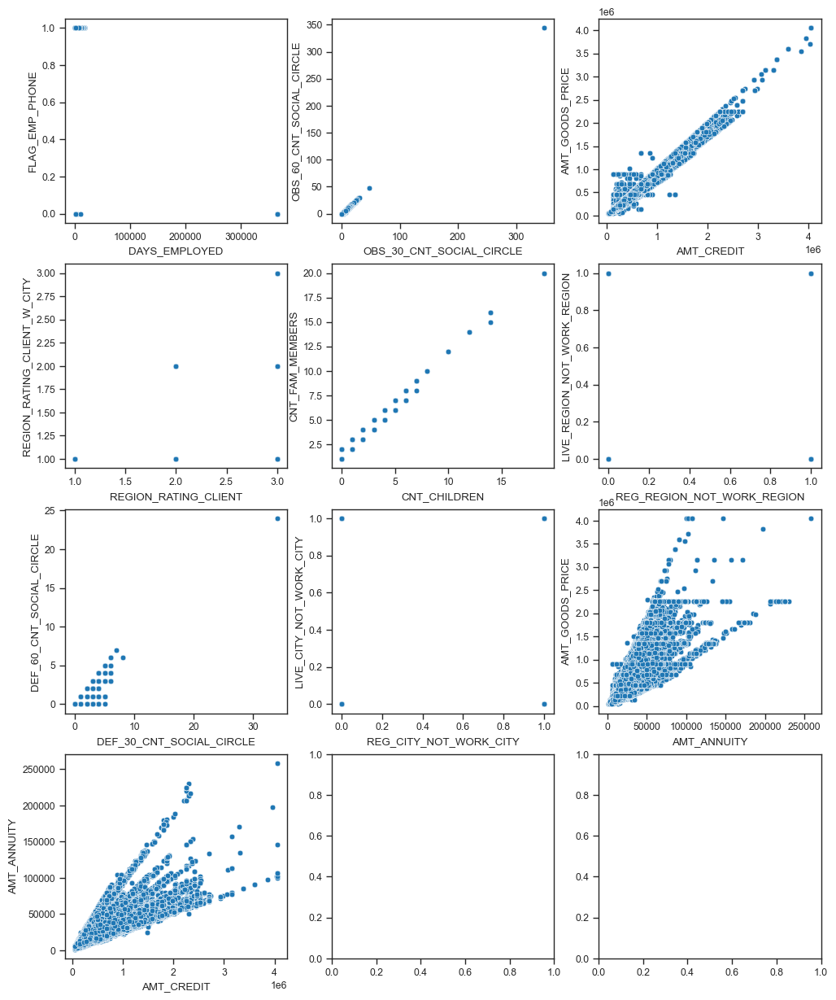

In [85]:
#correlation visualization
i=0
ncols=3
nrows = len(corr_top10_repayer)//ncols + 1
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(12,15))
for x,y in zip(corr_top10_repayer.Var1,corr_top10_repayer.Var2):
    row = i//ncols
    col=i%ncols
    sns.scatterplot(repayer, x= x, y=y, ax=axes[row,col])
    i+=1
plt.show()

### 5- Deeper analysis

To easily analyze, we devide variables of applications data into some group:
* **EMPLOYMENT**: NAME_EDUCATION_TYPE, DAYS_EMPLOYED, OCCUPATION_TYPE, ORGANIZATION_TYPE
* **INCOME**: AMT_INCOME_TOTAL, NAME_INCOME_TYPE
* **DEMOGRAPHIC**: CODE_GENDER, CNT_CHILDREN, NAME_FAMILY_STATUS, DAYS_BIRTH, CNT_FAM_MEMBERS
* **GEOGRAPHIC**: REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, REGION_POPULATION_RELATIVE
* **LOAN_DETAIL**: AMT_GOODS_PRICE, AMT_GOODS_PRICE_PRE, NAME_CONTRACT_TYPE, NAME_CONTRACT_TYPE_PRE, AMT_CREDIT, AMT_ANNUITY, AMT_CREDIT_PRE, AMT_ANNUITY_PRE, AMT_APPLICATION
* **LOAN_PROCESS**: WEEKDAY_APPR_PROCESS_START, HOUR_APPR_PROCESS_START, DAYS_DECISION, NAME_CONTRACT_STATUS

In [86]:
#application data
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.isin(['NAME_EDUCATION_TYPE', 'DAYS_EMPLOYED', 
                                                              'OCCUPATION_TYPE', 'ORGANIZATION_TYPE'])] = 'EMPLOYMENT'
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.isin(['AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE'])] = 'INCOME'
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.isin(['CODE_GENDER', 'CNT_CHILDREN', 
                                                              'NAME_FAMILY_STATUS', 'DAYS_BIRTH',
                                                              'CNT_FAM_MEMBERS'])] = 'DEMOGRAPHIC'
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.isin(['AMT_CREDIT', 'AMT_ANNUITY','AMT_GOODS_PRICE',
                                                             'NAME_CONTRACT_TYPE', 'NAME_TYPE_SUITE'])] = 'LOAN_DETAIL'
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.isin(['WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START'])
                                                                ] = 'LOAN_PROCESS'
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.isin(['DAYS_REGISTRATION', 'DAYS_ID_PUBLISH'
                                                               ,'DAYS_LAST_PHONE_CHANGE' ])] = 'OTHER_INFO'


In [87]:
app_data_structure.GROUP[app_data_structure.COLUMN_NAME.isin(['REGION_RATING_CLIENT', 'REGION_POPULATION_RELATIVE'
                                                               ,'REGION_RATING_CLIENT_W_CITY' ])] = 'GEOGRAPHIC'

In [88]:
app_data_structure

,COLUMN_NAME,NULL_COUNT,DTYPE,NULL_PERCENT,VARIABLE_TYPE,HANDLING_METHOD,GROUP
0,SK_ID_CURR,0,int64,0.000000,NA,NA,NA
1,TARGET,0,int64,0.000000,NA,NA,NA
2,NAME_CONTRACT_TYPE,0,object,0.000000,categorical,NA,LOAN_DETAIL
3,CODE_GENDER,0,object,0.000000,categorical,NA,DEMOGRAPHIC
4,FLAG_OWN_CAR,0,object,0.000000,categorical,NA,FLAG
5,FLAG_OWN_REALTY,0,object,0.000000,categorical,NA,FLAG
6,CNT_CHILDREN,0,int64,0.000000,numerical,NA,DEMOGRAPHIC
7,AMT_INCOME_TOTAL,0,float64,0.000000,numerical,NA,INCOME
8,AMT_CREDIT,0,float64,0.000000,numerical,NA,LOAN_DETAIL
9,AMT_ANNUITY,12,float64,0.003902,numerical,median,LOAN_DETAIL


**Similar with history data**

In [89]:
#Map columns' name in app_pre_structure with columns in combined_df
app_pre_structure.COLUMN_NAME= app_pre_structure.COLUMN_NAME.apply(
    lambda x: str(x) + '_PRE' if x in app_data_structure.COLUMN_NAME.values else x)
app_pre_structure

,COLUMN_NAME,NULL_COUNT,DTYPE,NULL_PERCENT,VARIABLE_TYPE,HANDLING_METHOD
0,SK_ID_PREV,0,int64,0.000000,NA,NA
1,SK_ID_CURR_PRE,0,int64,0.000000,NA,NA
2,NAME_CONTRACT_TYPE_PRE,0,object,0.000000,categorical,NA
3,AMT_ANNUITY_PRE,372235,float64,22.286665,numerical,median
4,AMT_APPLICATION,0,float64,0.000000,numerical,NA
5,AMT_CREDIT_PRE,1,float64,0.000060,numerical,median
6,AMT_GOODS_PRICE_PRE,385515,float64,23.081773,numerical,median
7,WEEKDAY_APPR_PROCESS_START_PRE,0,object,0.000000,categorical,NA
8,HOUR_APPR_PROCESS_START_PRE,0,int64,0.000000,numerical,NA
9,FLAG_LAST_APPL_PER_CONTRACT,0,object,0.000000,categorical,NA


In [90]:
# Grouping
app_pre_structure['GROUP'] = 'NA'

app_pre_structure.GROUP[app_pre_structure.COLUMN_NAME.isin(['NAME_CONTRACT_TYPE_PRE', 'AMT_ANNUITY_PRE','AMT_GOODS_PRICE_PRE',
                                                             'AMT_APPLICATION', 'AMT_CREDIT_PRE','CNT_PAYMENT'
                                                           ,'NAME_CONTRACT_STATUS','NAME_TYPE_SUITE_PRE','NAME_GOODS_CATEGORY'
                                                           ,'PRODUCT_COMBINATION', 'NAME_CASH_LOAN_PURPOSE'])] = 'LOAN_DETAIL_HISTORY'
app_pre_structure.GROUP[app_pre_structure.COLUMN_NAME.isin(['WEEKDAY_APPR_PROCESS_START_PRE', 'HOUR_APPR_PROCESS_START_PRE'
                                                           ,'DAYS_DECISION',''])
                                                                ] = 'LOAN_PROCESS_HISTORY'
app_pre_structure.GROUP[app_pre_structure.COLUMN_NAME.isin(['DAYS_FIRST_DUE', 'DAYS_LAST_DUE'
                                                               ,'DAYS_LAST_PHONE_CHANGE' ])] = 'OTHER_INFO'

In [191]:
app_pre_structure

,COLUMN_NAME,NULL_COUNT,DTYPE,NULL_PERCENT,VARIABLE_TYPE,HANDLING_METHOD,GROUP
0,SK_ID_PREV,0,int64,0.000000,NA,NA,NA
1,SK_ID_CURR_PRE,0,int64,0.000000,NA,NA,NA
2,NAME_CONTRACT_TYPE_PRE,0,object,0.000000,categorical,NA,LOAN_DETAIL_HISTORY
3,AMT_ANNUITY_PRE,372235,float64,22.286665,numerical,median,LOAN_DETAIL_HISTORY
4,AMT_APPLICATION,0,float64,0.000000,numerical,NA,LOAN_DETAIL_HISTORY
5,AMT_CREDIT_PRE,1,float64,0.000060,numerical,median,LOAN_DETAIL_HISTORY
6,AMT_GOODS_PRICE_PRE,385515,float64,23.081773,numerical,median,LOAN_DETAIL_HISTORY
7,WEEKDAY_APPR_PROCESS_START_PRE,0,object,0.000000,categorical,NA,LOAN_PROCESS_HISTORY
8,HOUR_APPR_PROCESS_START_PRE,0,int64,0.000000,numerical,NA,LOAN_PROCESS_HISTORY
9,FLAG_LAST_APPL_PER_CONTRACT,0,object,0.000000,categorical,NA,NA


##### DEMOGRAPHIC group

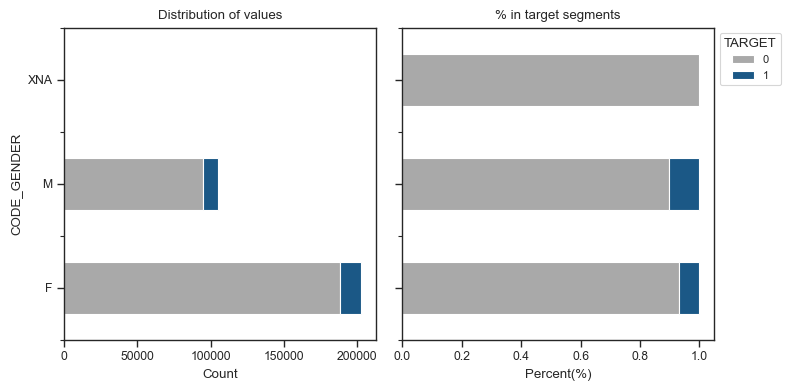

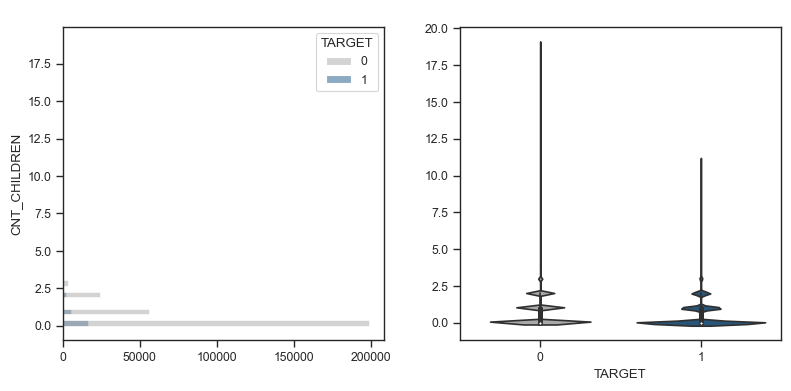

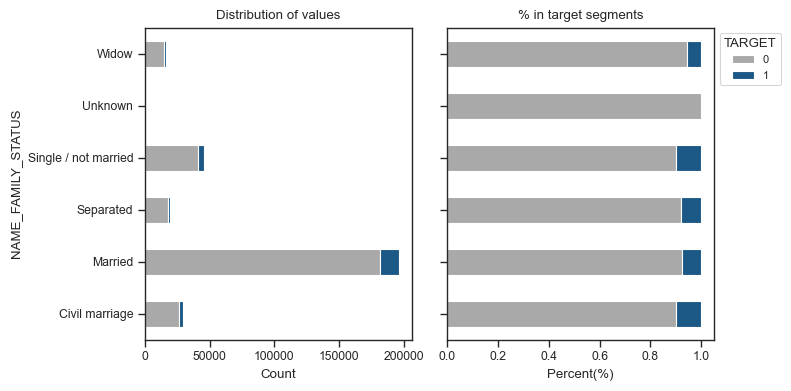

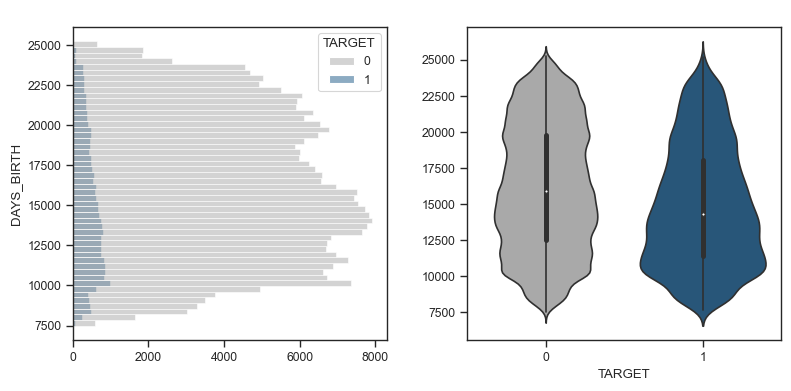

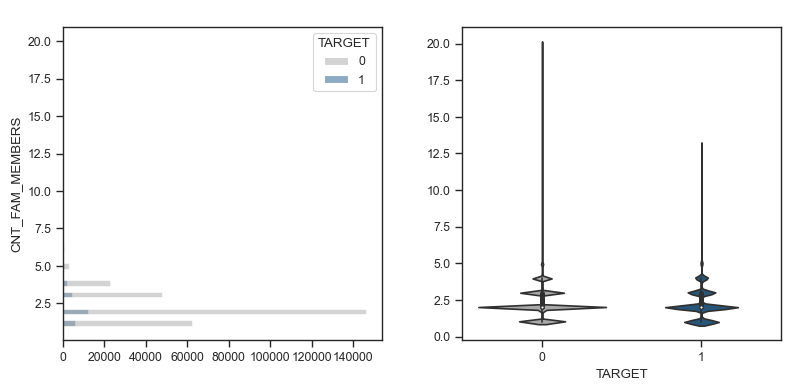

In [91]:
# Bivariate analysis
group = app_data_structure[app_data_structure.GROUP=='DEMOGRAPHIC']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

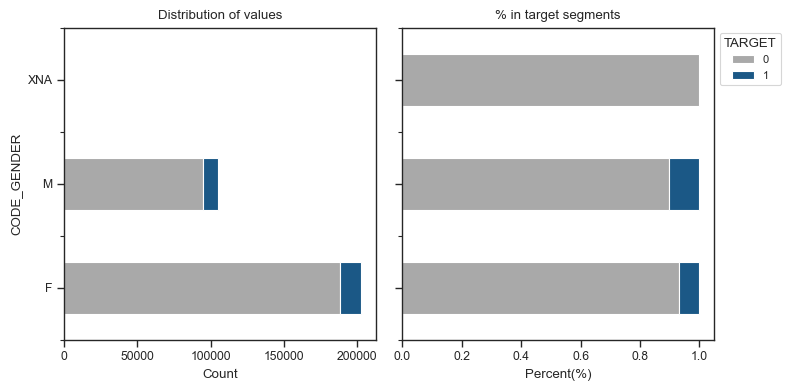

In [92]:
# CODE_GENDER
bi_plot(data=app_data, col='CODE_GENDER', target='TARGET', var_type='c', face_highlight=True)

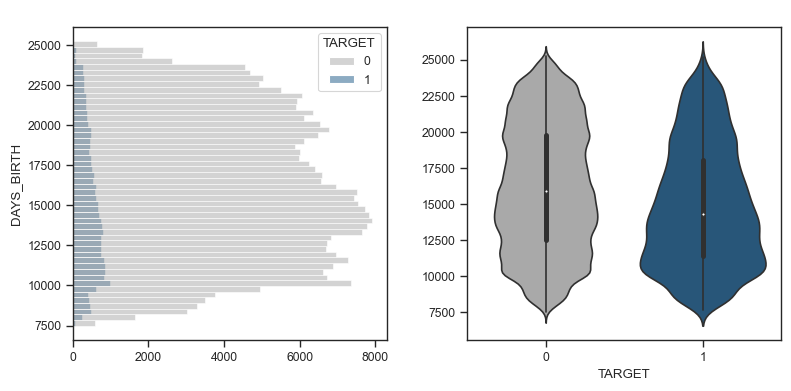

In [93]:
# DAYS_BIRTH
bi_plot(data=app_data, col='DAYS_BIRTH', target='TARGET', var_type='n', face_highlight=True)

**Infer from graph:**
* proportion of defaulters in group male is higher than that in group female
* younger people are more likely to be default

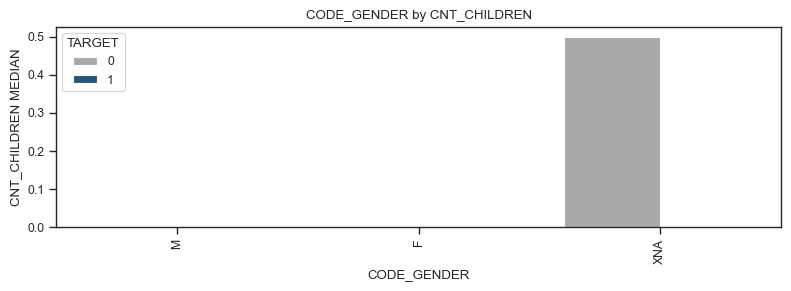

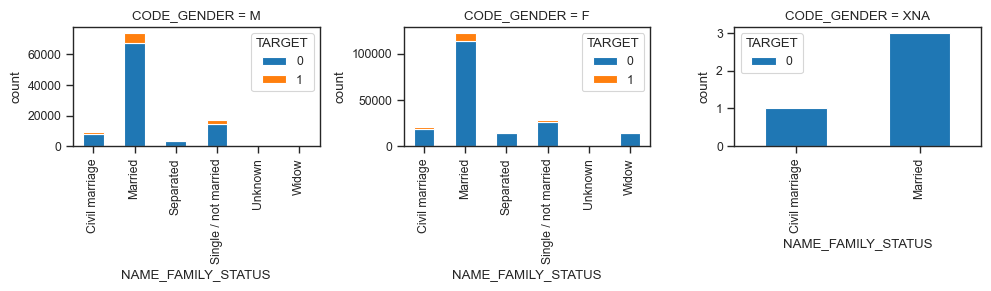

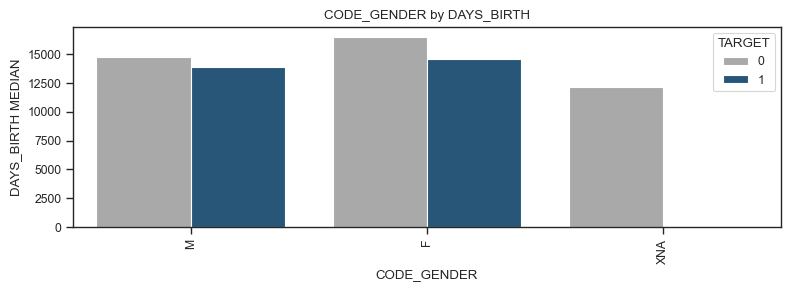

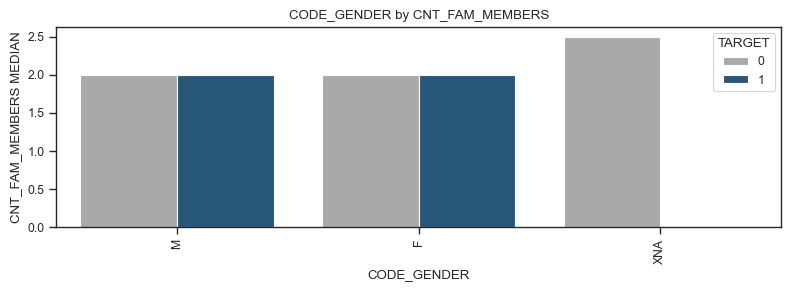

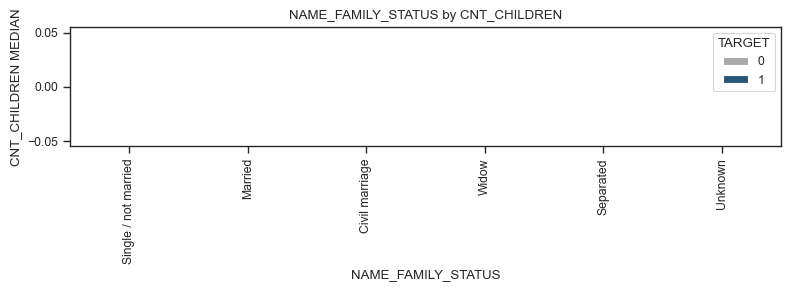

<Figure size 800x300 with 0 Axes>

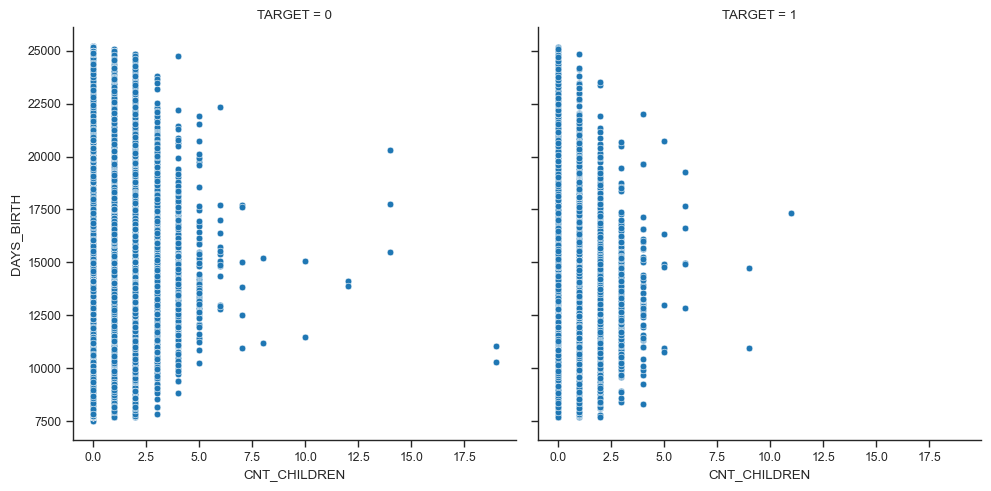

<Figure size 800x300 with 0 Axes>

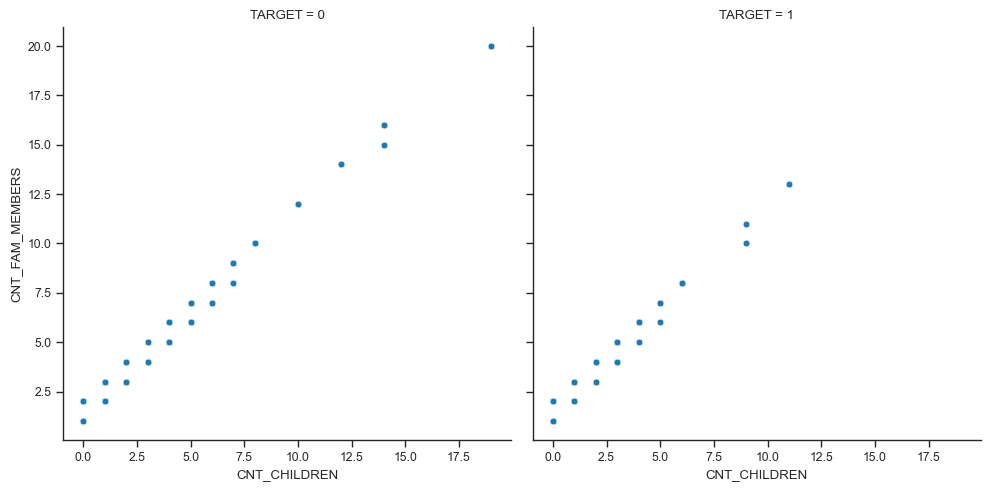

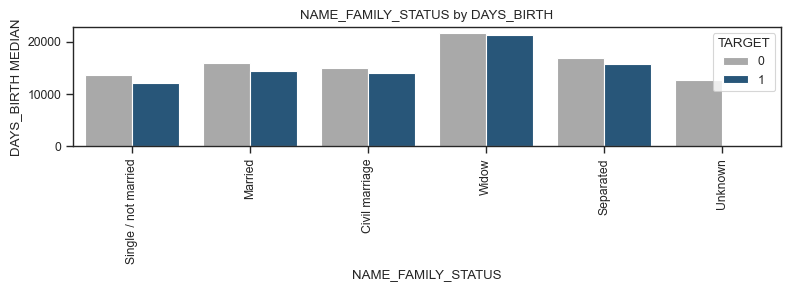

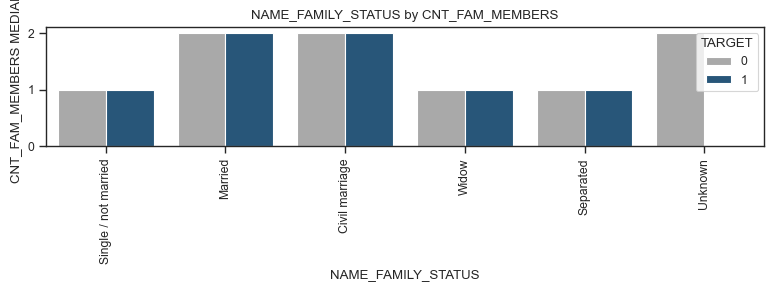

<Figure size 800x300 with 0 Axes>

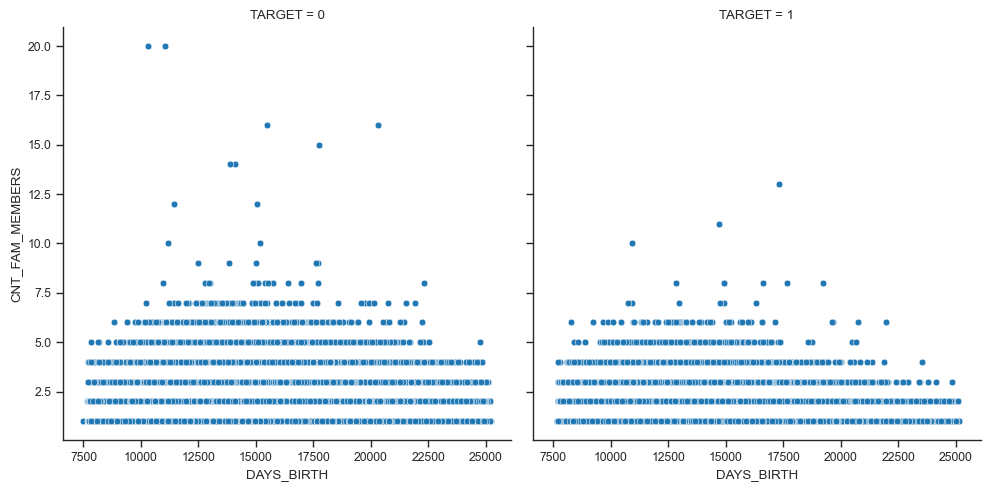

In [94]:
#%run Visual_Lib.ipynb
group = app_data_structure[app_data_structure.GROUP=='DEMOGRAPHIC']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='multivariate', figsize=(8,3))
                                     

**Infer from the graph:**
* In most case, median of DAYS_BIRTH of defaulters (TARGET=1) is lower than that of repayers

##### EMPLOYMENT group

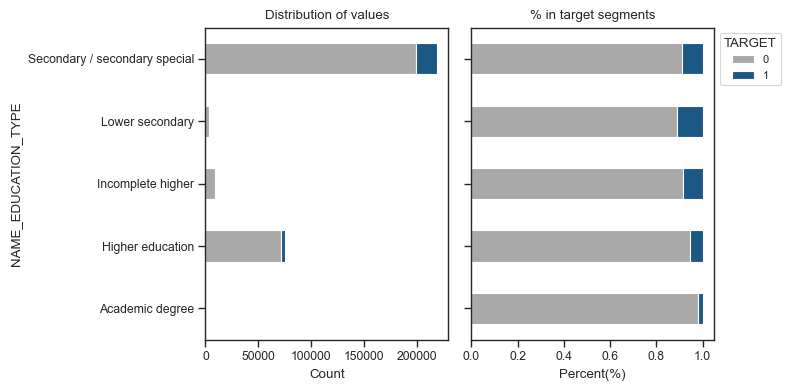

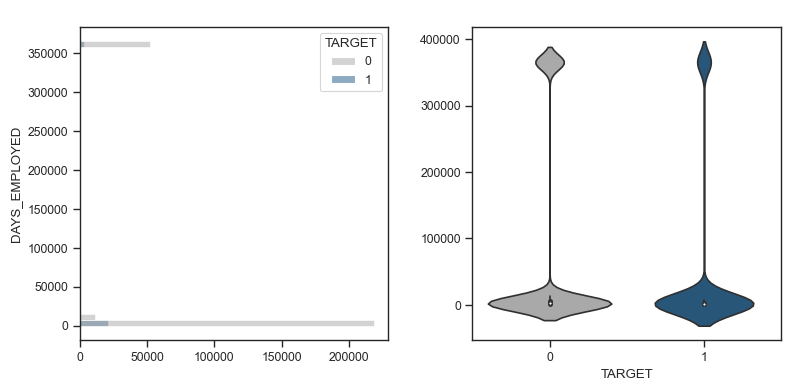

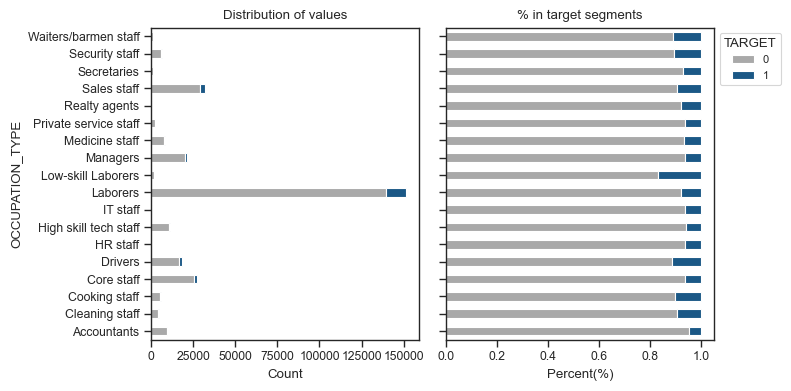

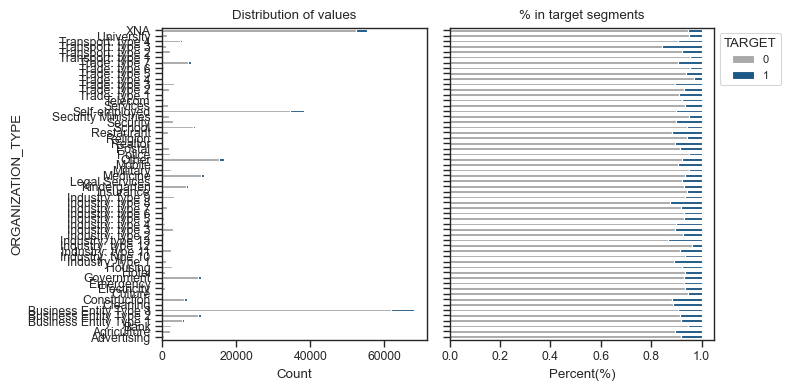

In [95]:
# Bivariate analysis
group = app_data_structure[app_data_structure.GROUP=='EMPLOYMENT']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

In [96]:
# Re_categorize ORGANIZATION_TYPE
a = app_data.ORGANIZATION_TYPE.value_counts(normalize=True)*100
a[a<0.2]
app_data.ORGANIZATION_TYPE.replace(a[a<0.2].index, 'Others', inplace=True)

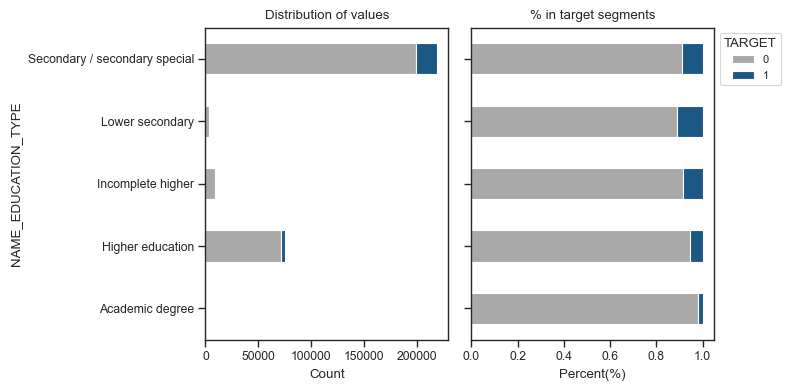

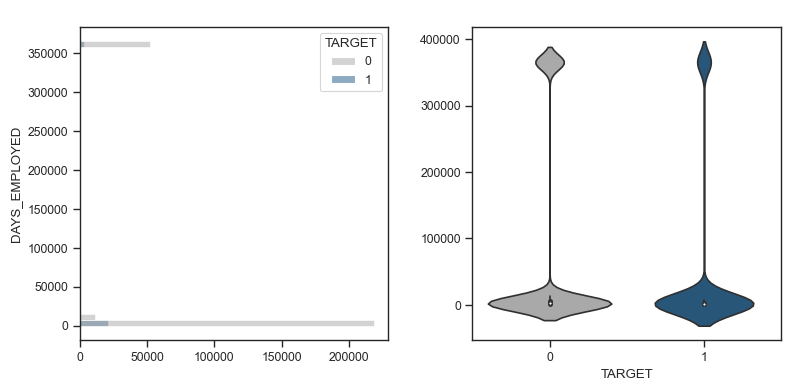

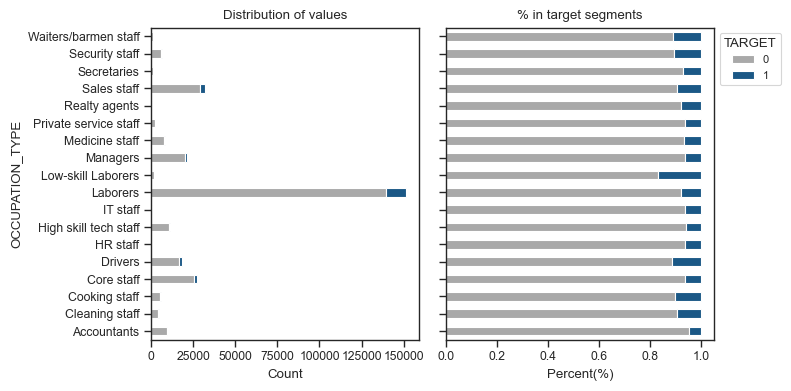

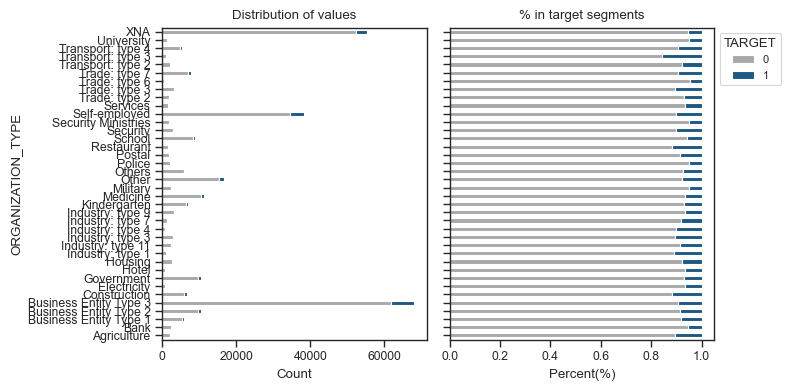

In [97]:
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate', figsize=(10,5))

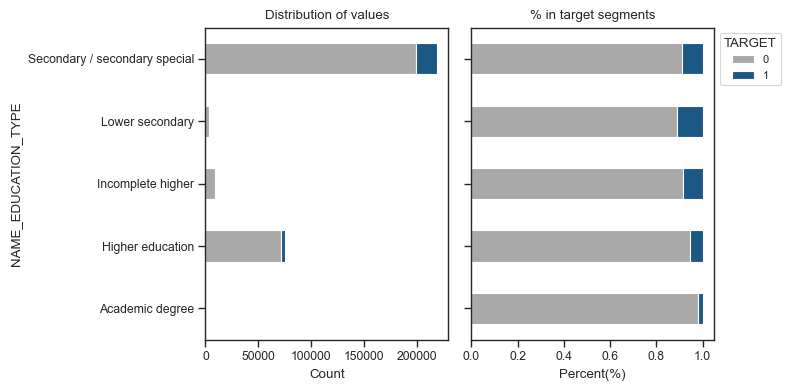

In [98]:
# NAME_EDUCATION_TYPE
bi_plot(data=app_data, col='NAME_EDUCATION_TYPE', var_type='c', face_highlight=True)

**Infer from graph**
* In lower education, % of defaulter is higher than that in higher education

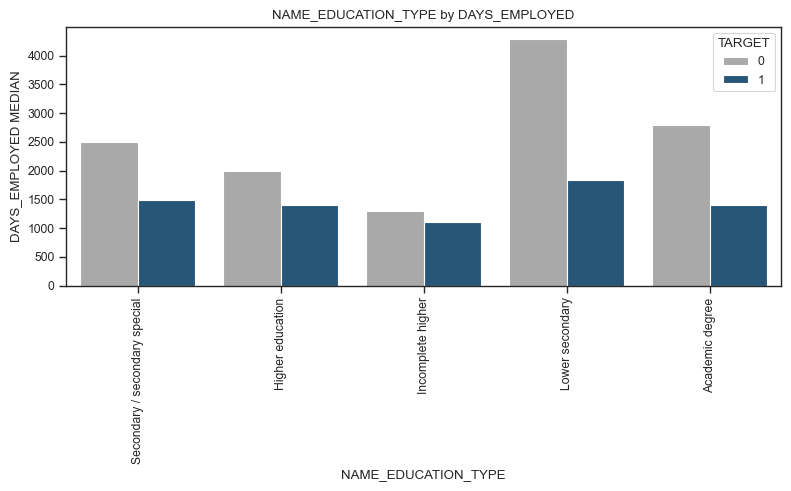

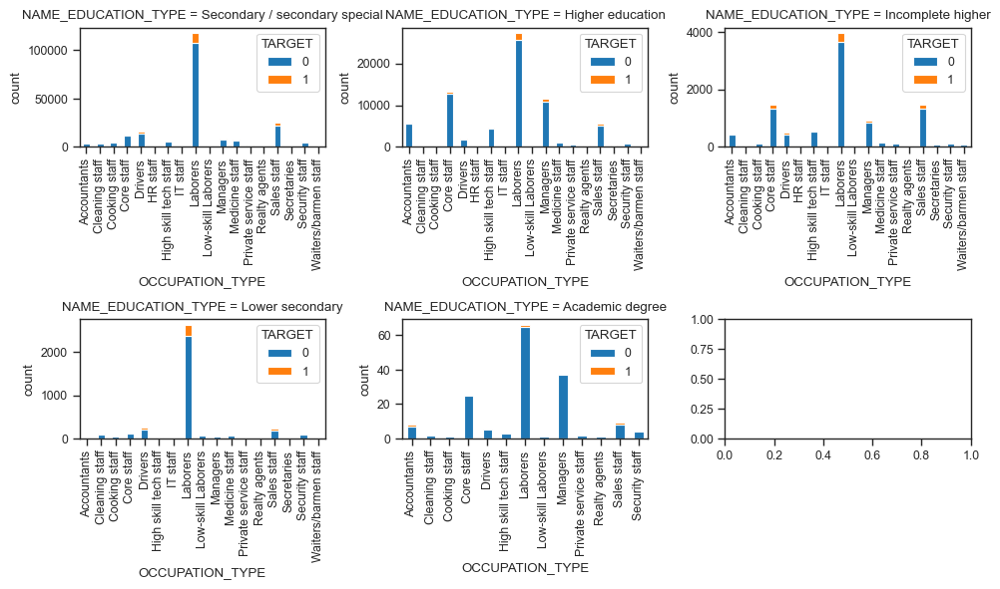

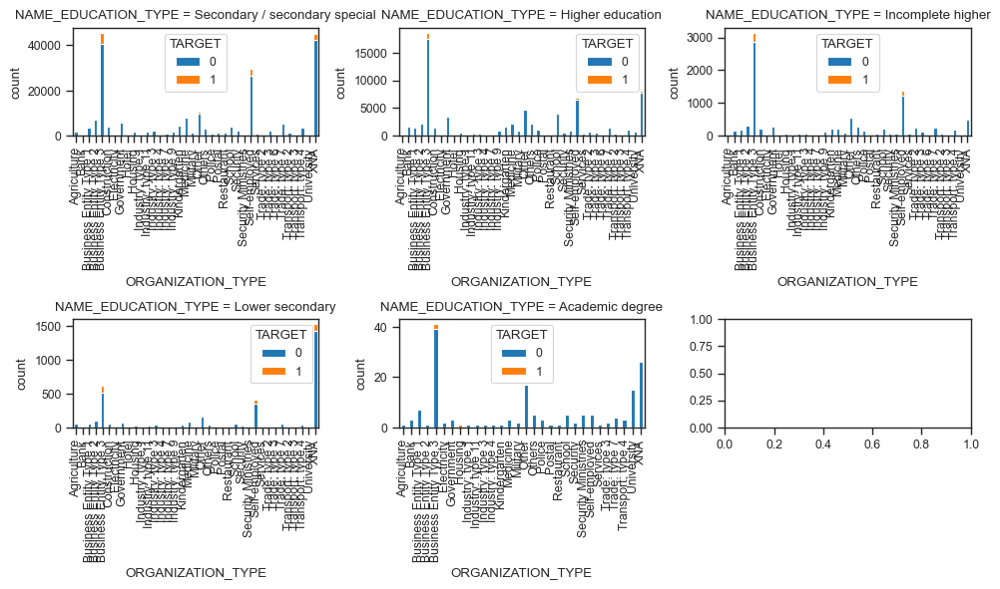

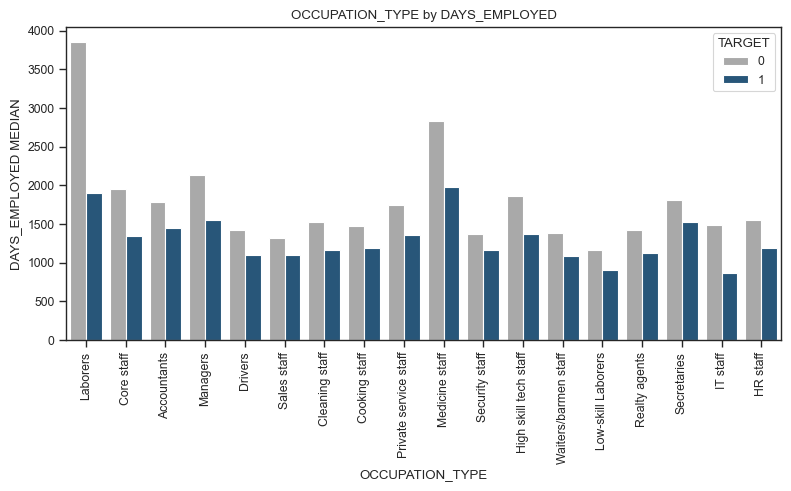

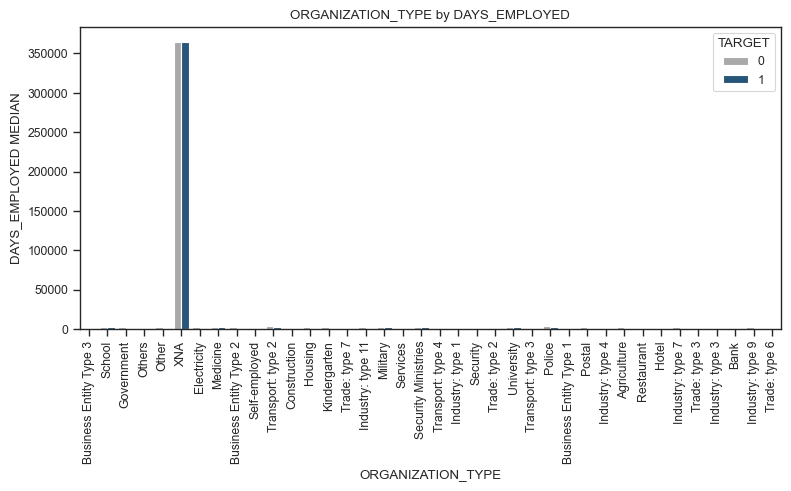

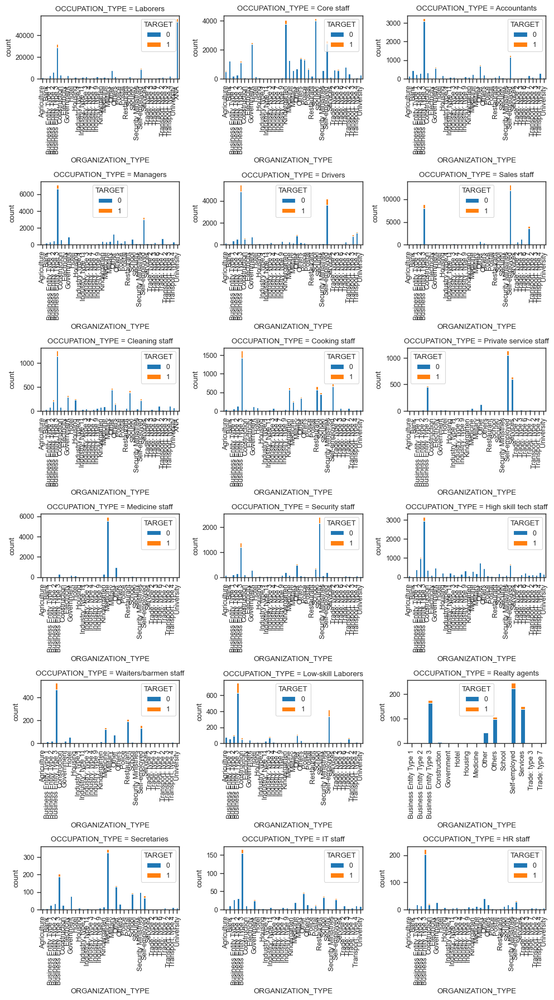

In [100]:
#Multivariate analysis
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='multivariate', figsize=(8,5))

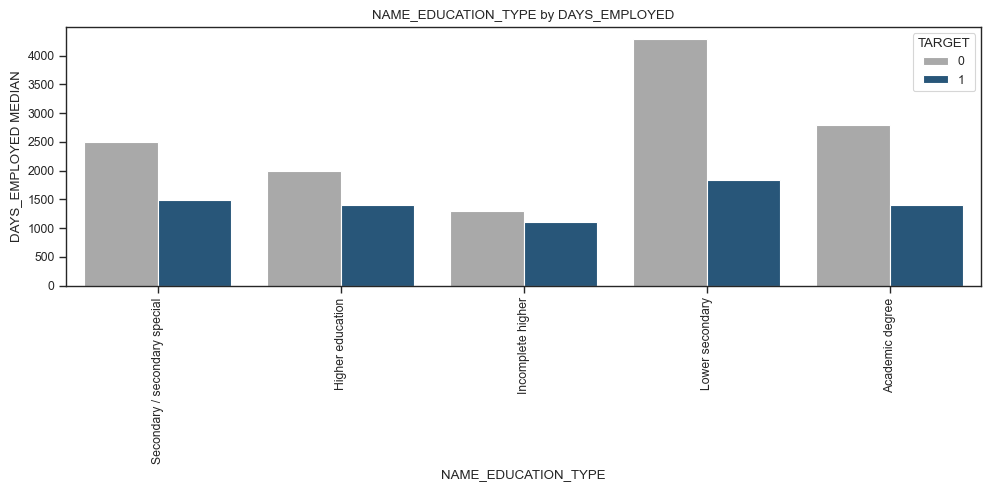

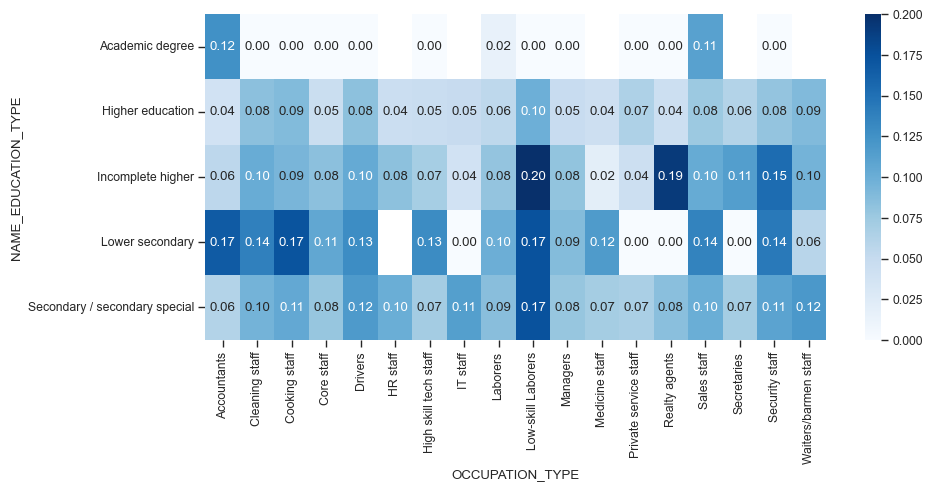

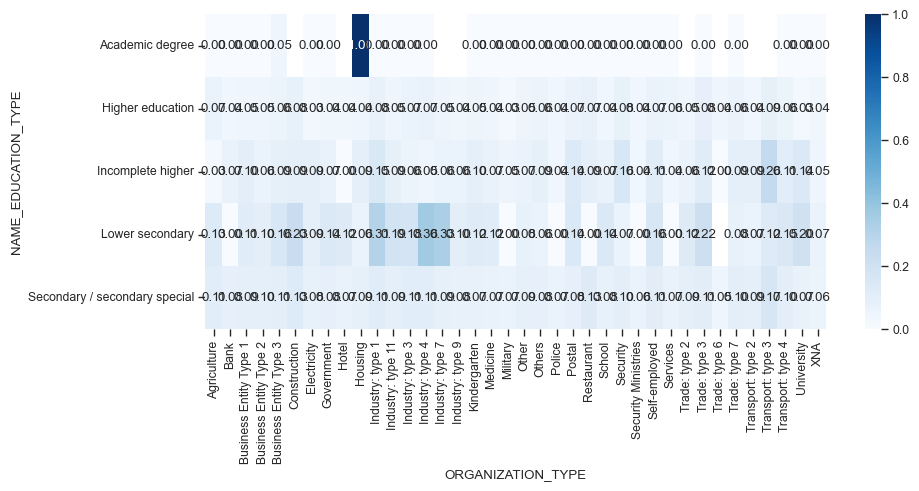

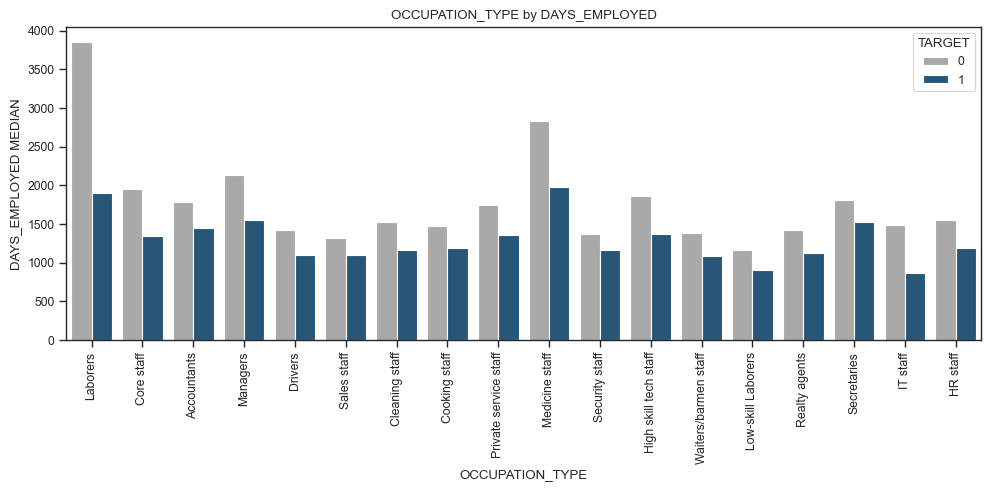

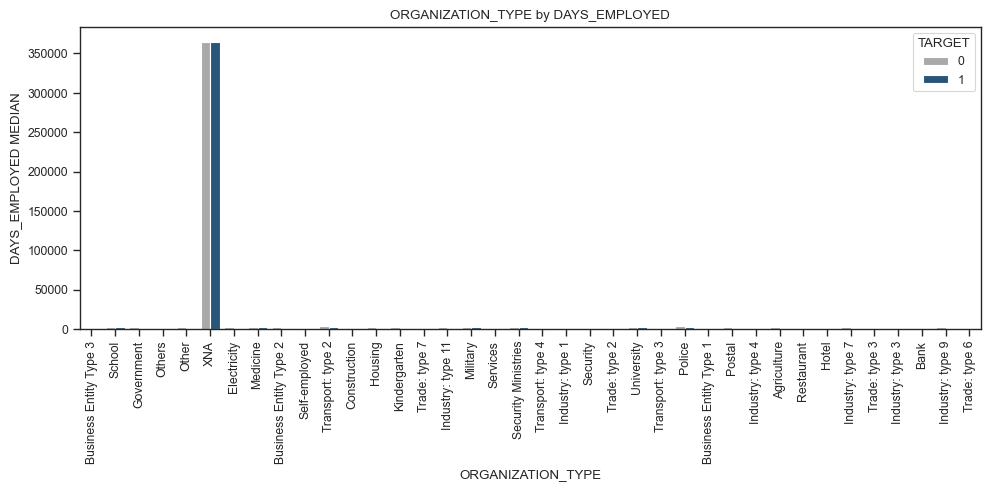

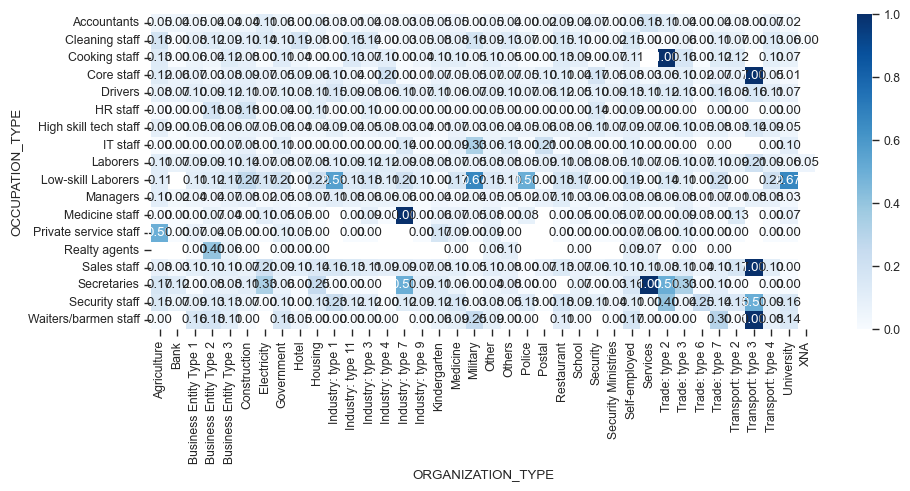

In [102]:
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='multivariate', figsize=(10,5)
              ,c_chart='heatmap')

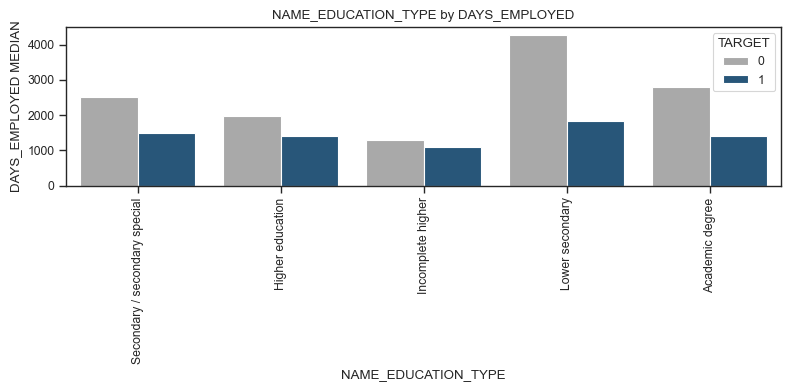

In [103]:
# Focus on DAYS_EMPLOYED
# Median
multi_plot(data=app_data, var1='NAME_EDUCATION_TYPE', var2='DAYS_EMPLOYED', var_type='b')

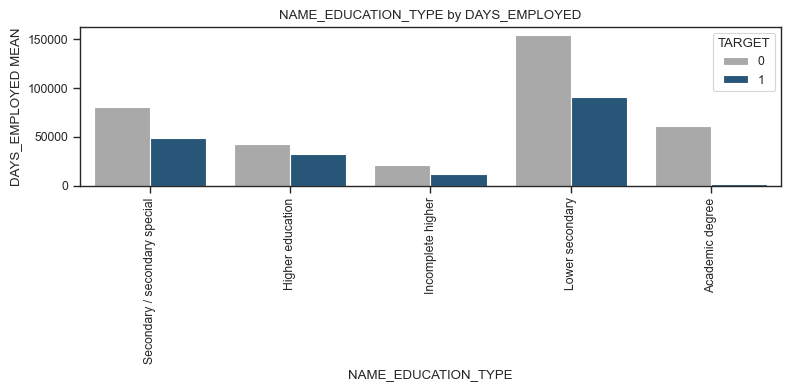

In [104]:
#mean
multi_plot(data=app_data, var1='NAME_EDUCATION_TYPE', var2='DAYS_EMPLOYED', var_type='b', estimator='mean')

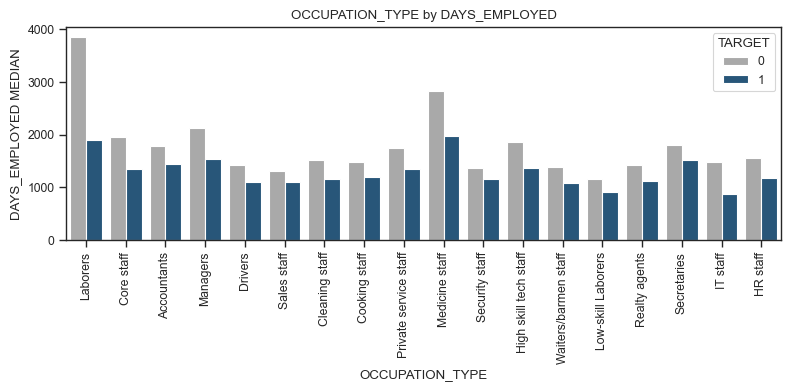

In [105]:
# Vs OCCUPATION_TYPE
multi_plot(data=app_data, var1='OCCUPATION_TYPE', var2='DAYS_EMPLOYED', var_type='b')

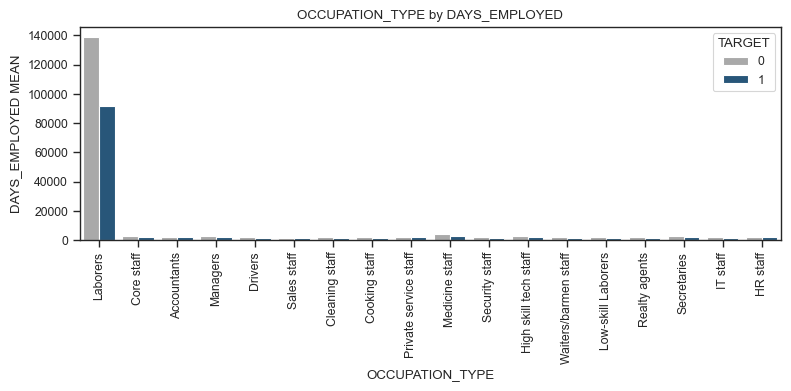

In [106]:
multi_plot(data=app_data, var1='OCCUPATION_TYPE', var2='DAYS_EMPLOYED', var_type='b', estimator='mean')

**Infer from the graph:**
* Defaulters have median of DAYS_EMPLOYED lower than that of repayers

##### INCOME group

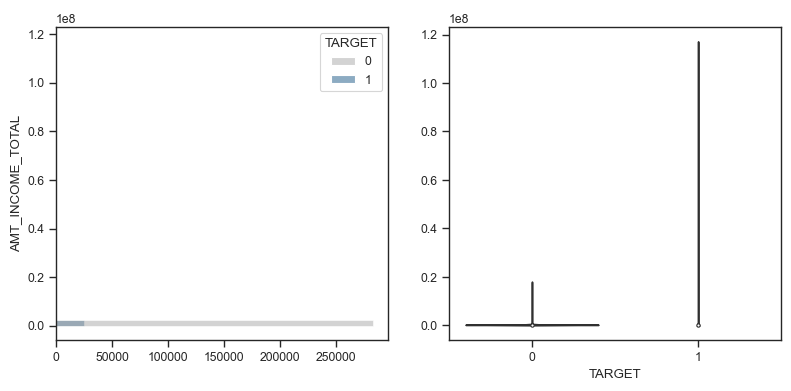

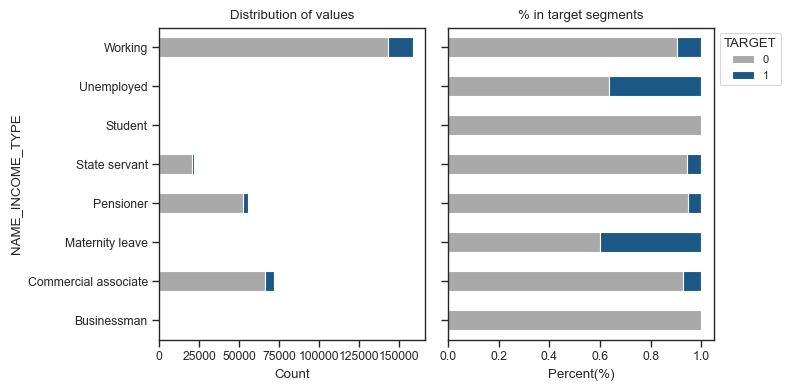

In [107]:
# Bivariate analysis
group = app_data_structure[app_data_structure.GROUP=='INCOME']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

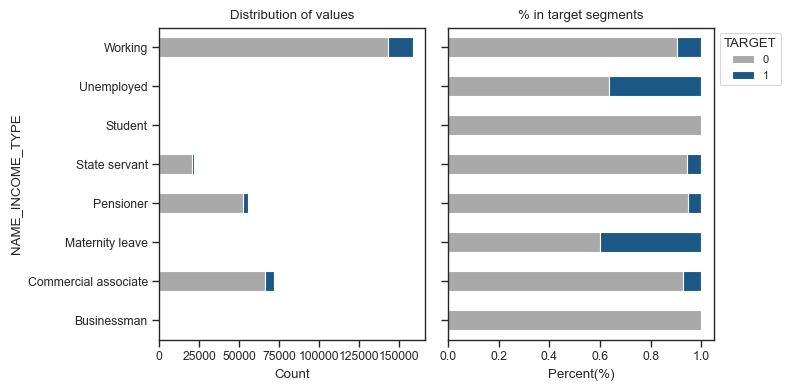

In [108]:
bi_plot(data=app_data, col='NAME_INCOME_TYPE', var_type='c', face_highlight=True)

**Infer from the graph:**
* Proportion of Defaulters in group Unemployed and Maternity leave is much higher than in other groups of NAME_INCOME_TYPE

##### LOAN_DETAIL

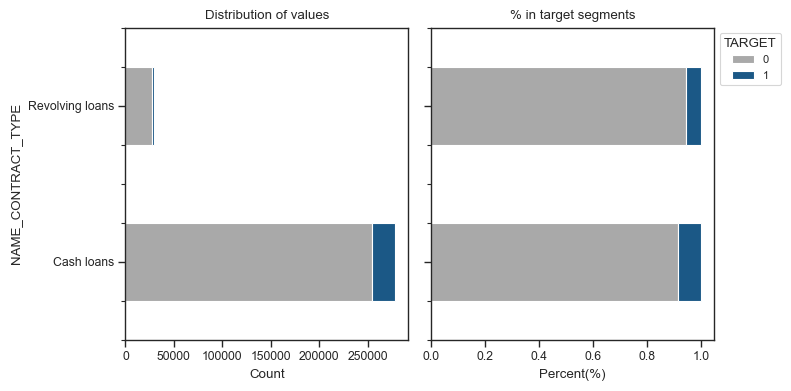

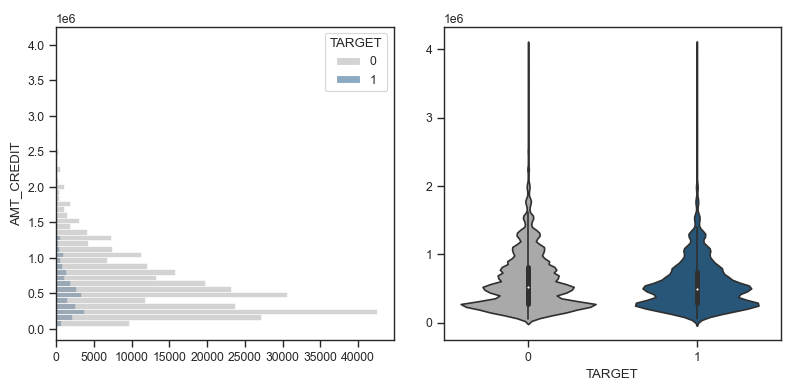

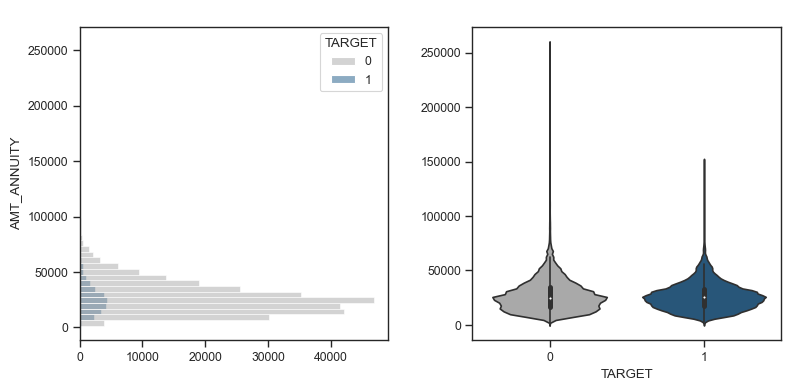

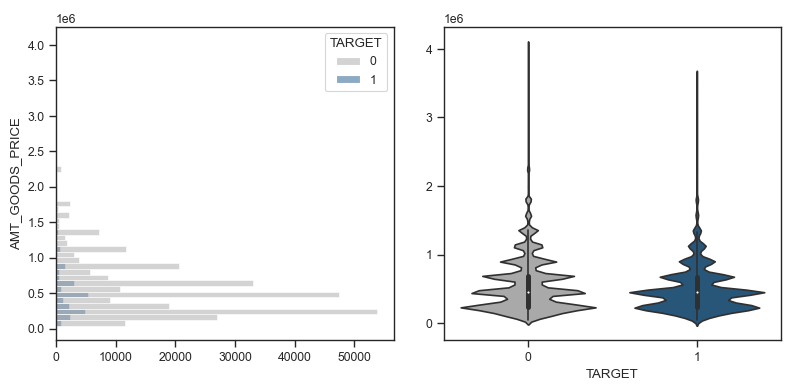

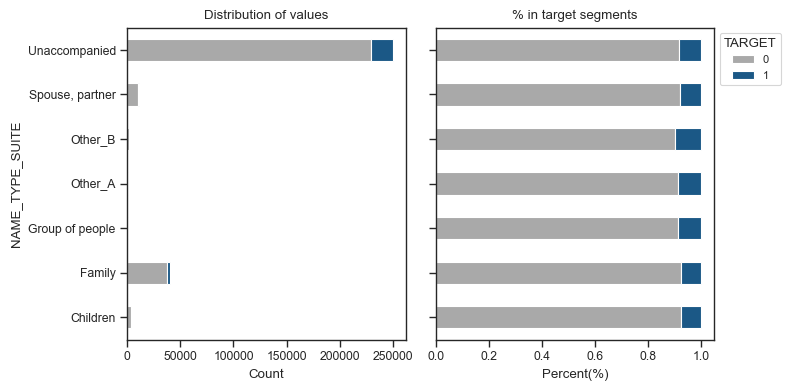

In [109]:
# Bivariate analysis
group = app_data_structure[app_data_structure.GROUP=='LOAN_DETAIL']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

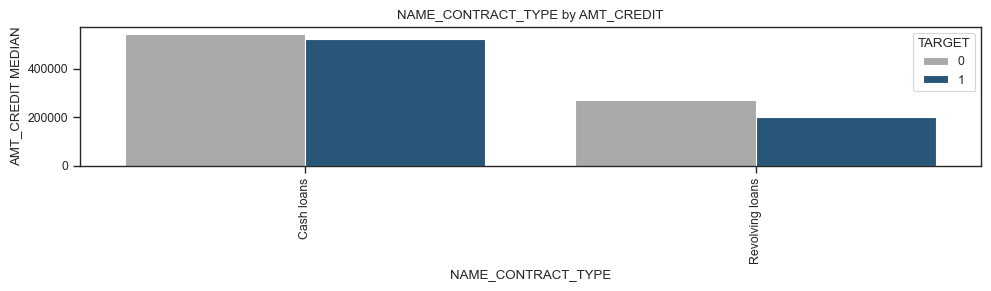

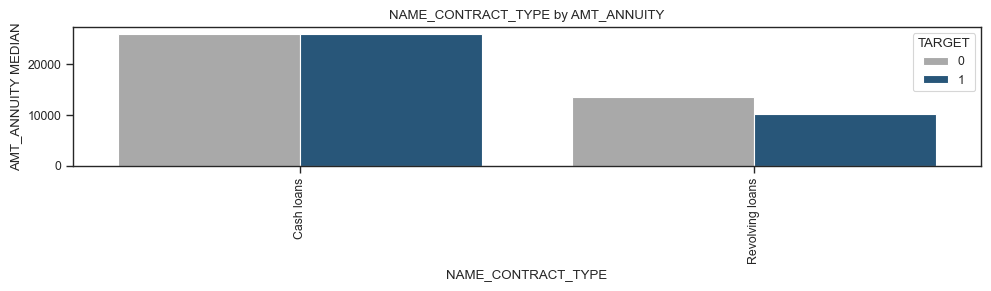

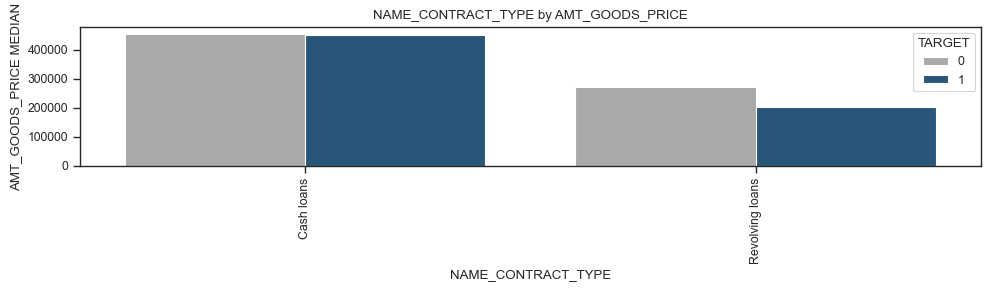

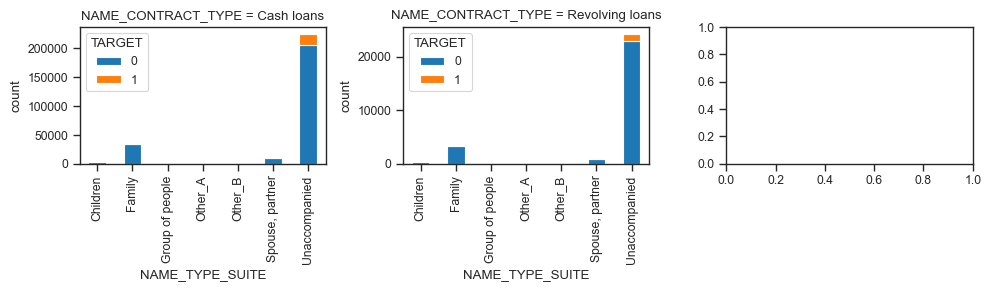

<Figure size 1000x300 with 0 Axes>

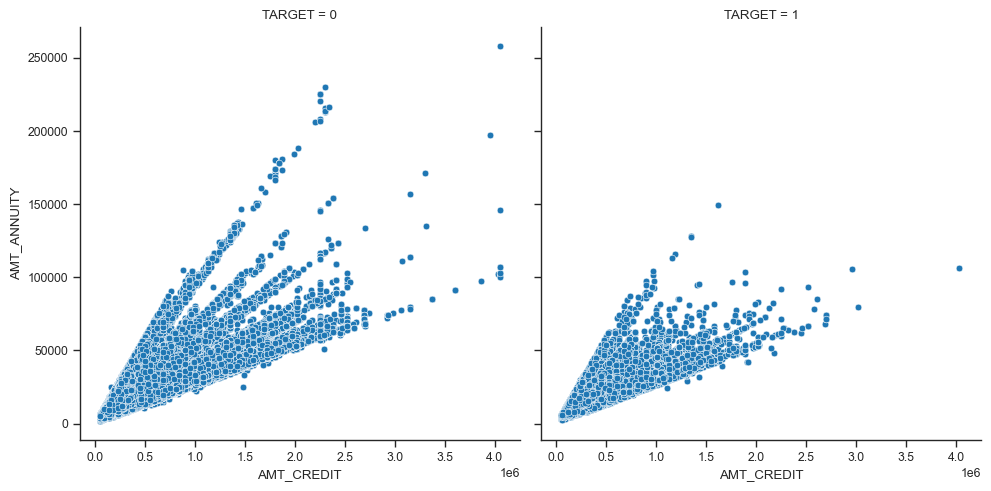

<Figure size 1000x300 with 0 Axes>

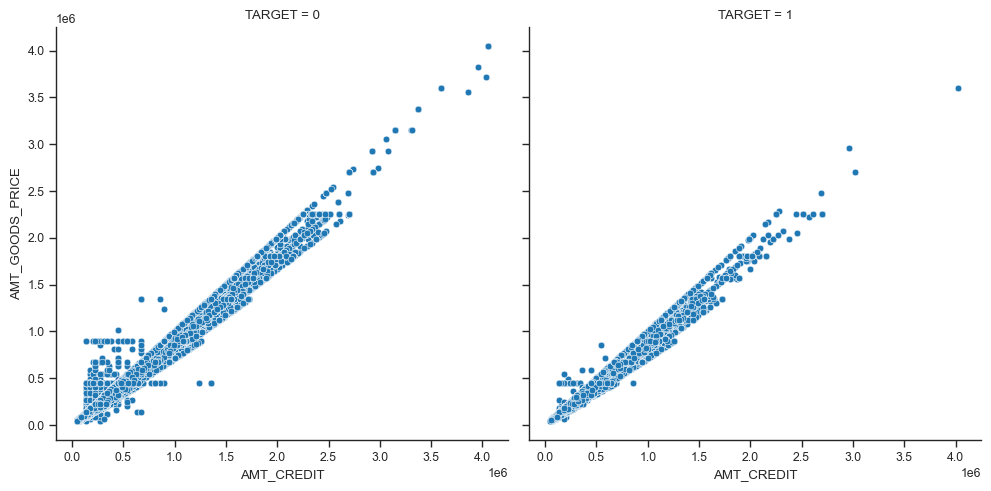

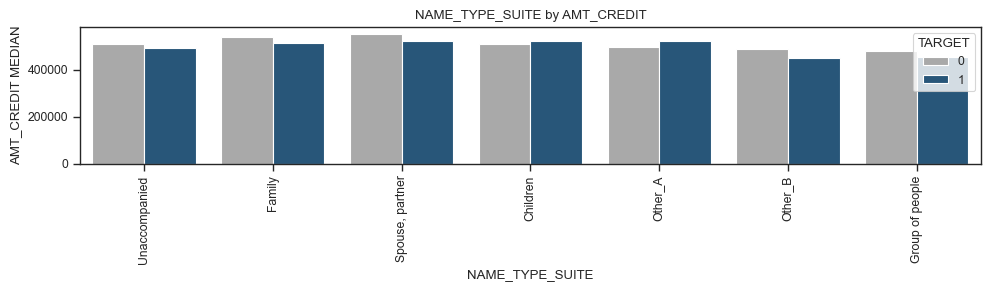

<Figure size 1000x300 with 0 Axes>

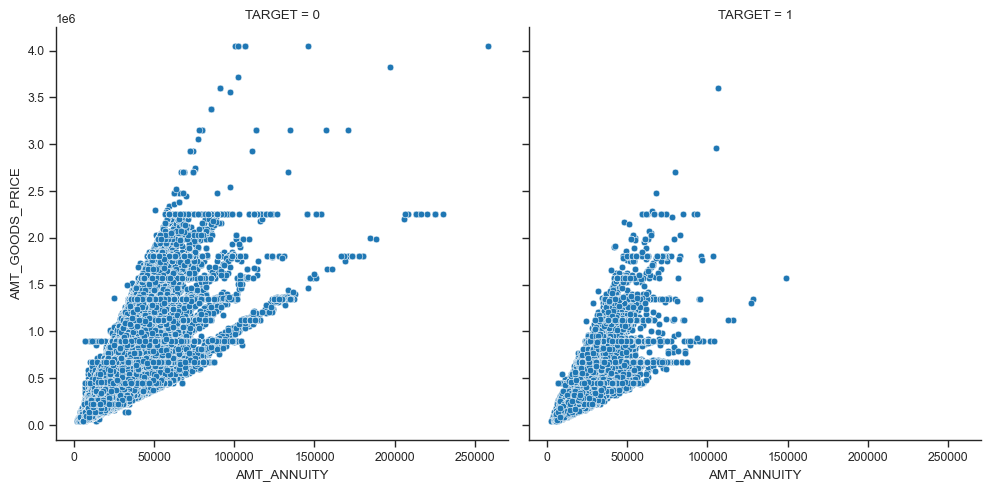

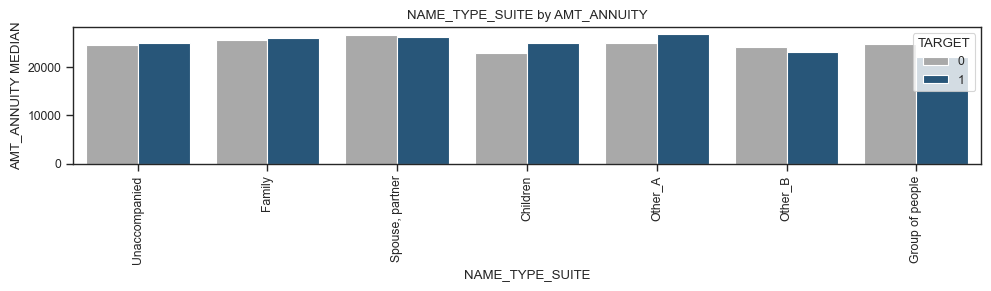

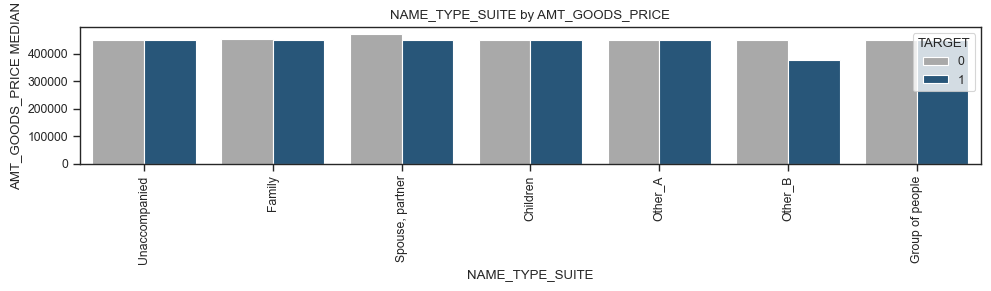

In [97]:
# Multivariate analysis
group = app_data_structure[app_data_structure.GROUP=='LOAN_DETAIL']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='multivariate')

##### GEOGRAPHIC

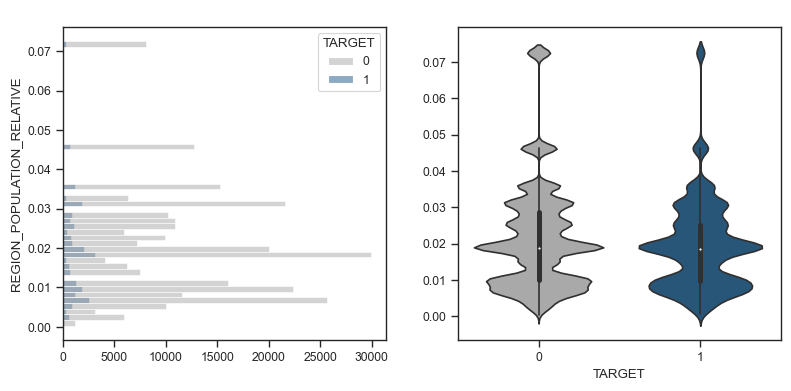

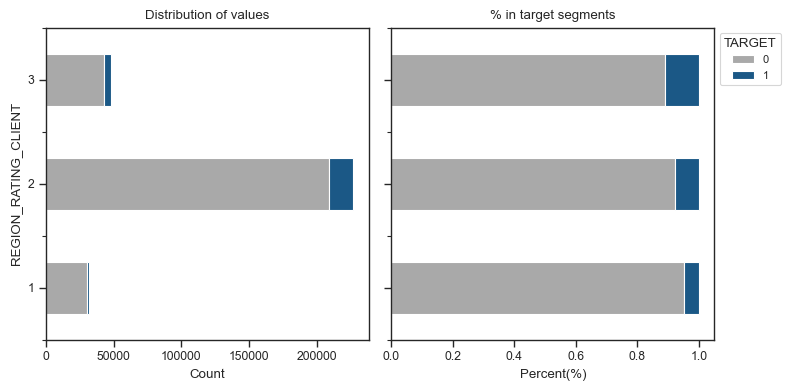

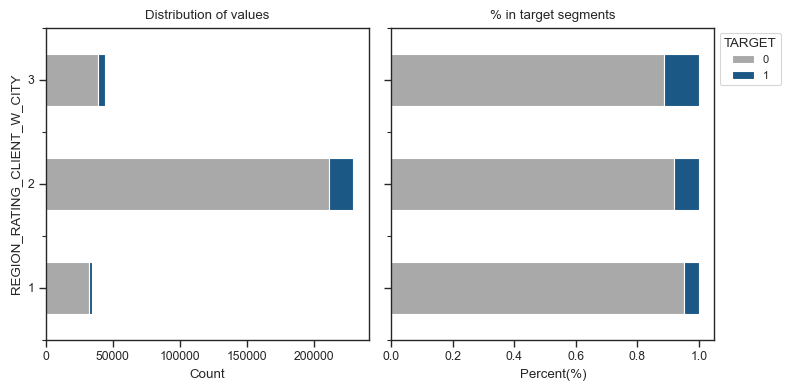

In [98]:
# Bivariate analysis
group = app_data_structure[app_data_structure.GROUP=='GEOGRAPHIC']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

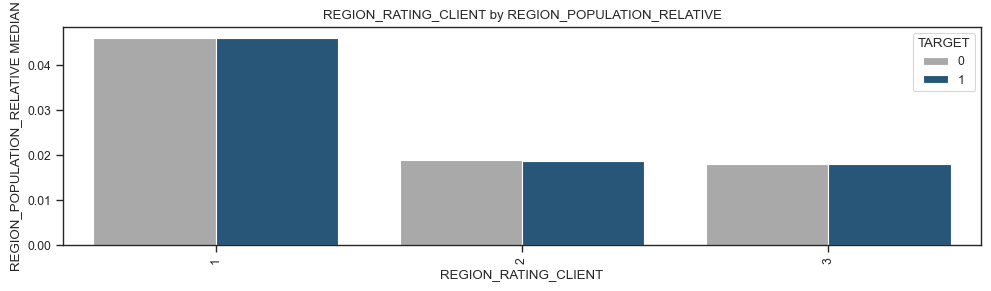

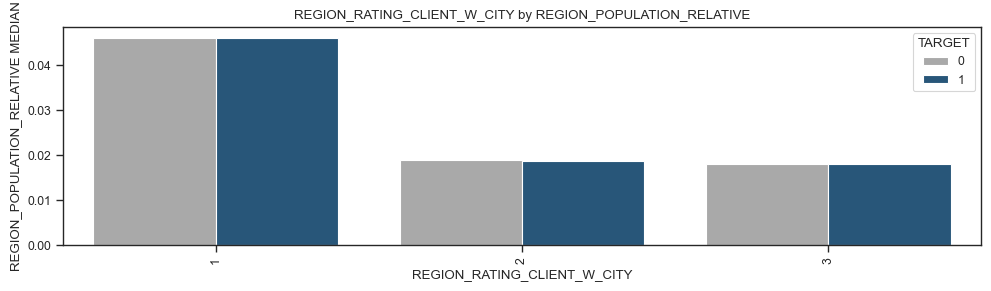

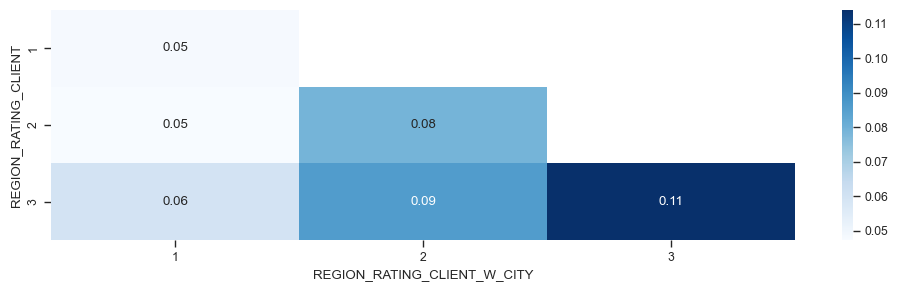

In [112]:
# Multivariate analysis
group = app_data_structure[app_data_structure.GROUP=='GEOGRAPHIC']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME,c_chart='heatmap' ,analysis_type='m')

**Infer from the graph:**
* Applicants in REGIONs with higher rating are more likely to be default

##### LOAN_PROCESS

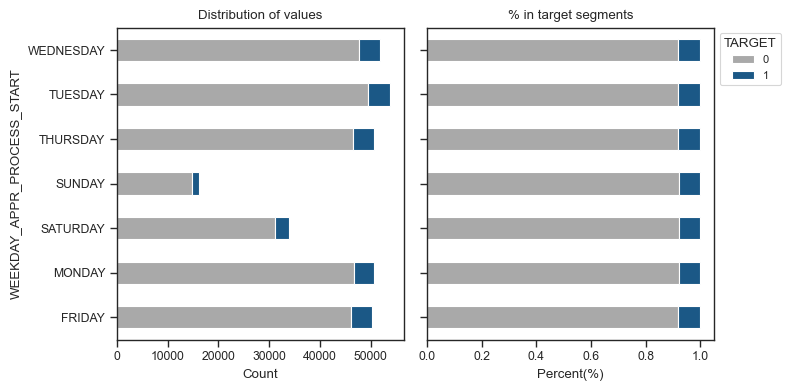

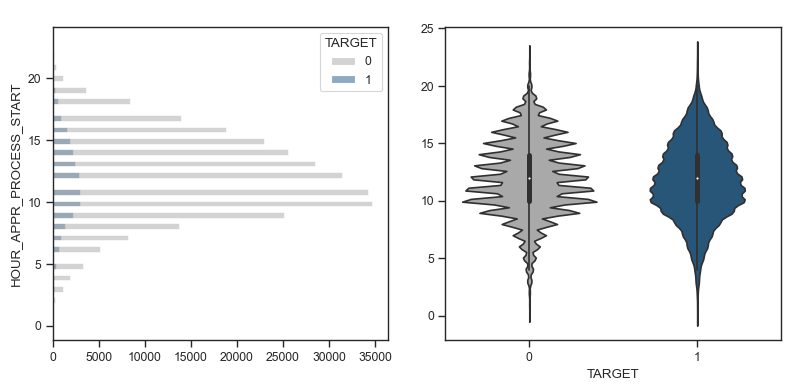

In [113]:
# Bivariate analysis
group = app_data_structure[app_data_structure.GROUP=='LOAN_PROCESS']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

##### OTHER_INFO

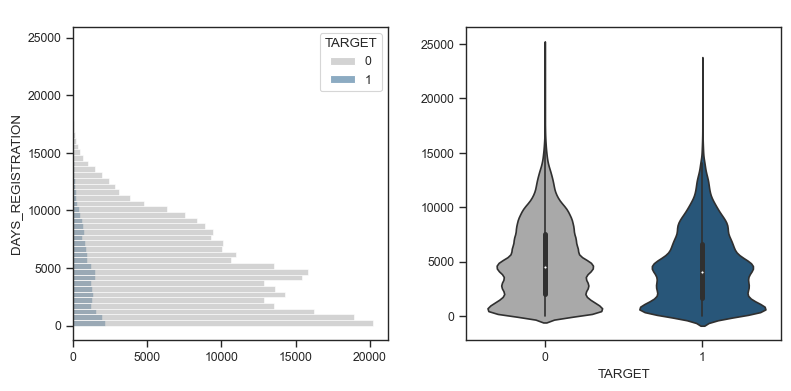

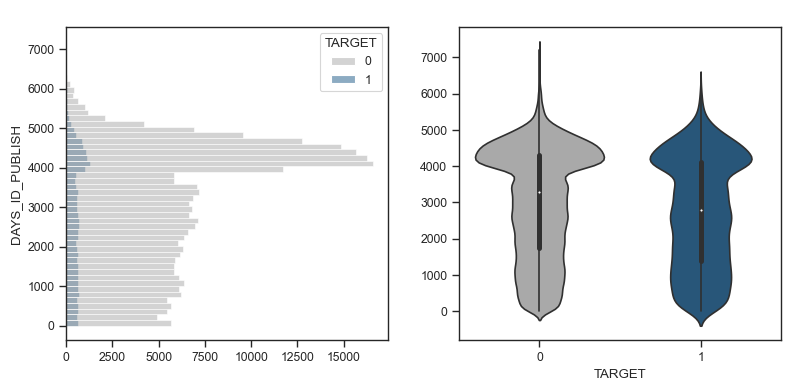

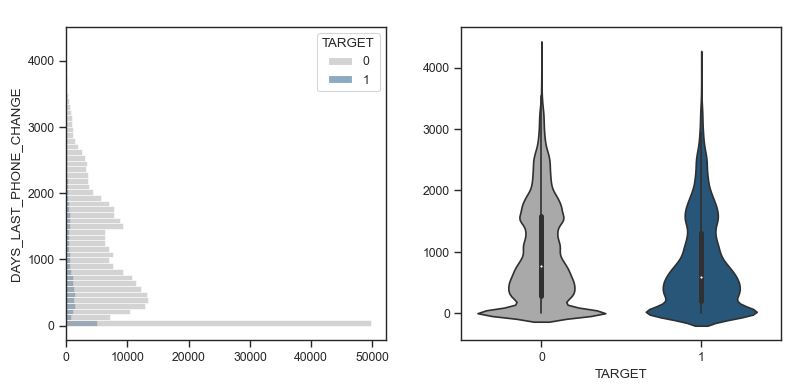

In [114]:
# Bivariate analysis
group = app_data_structure[app_data_structure.GROUP=='OTHER_INFO']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

##### FLAG

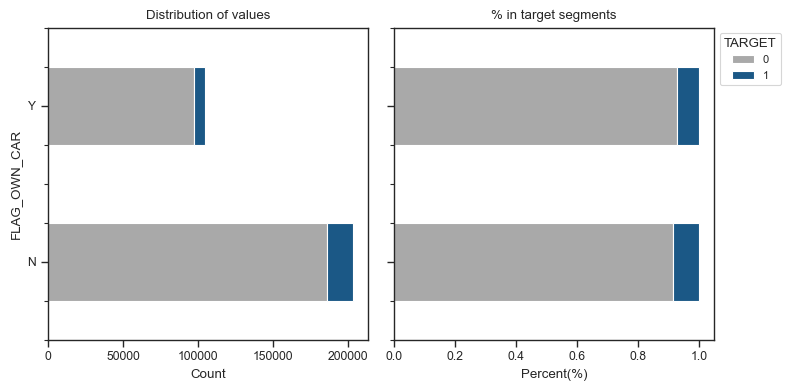

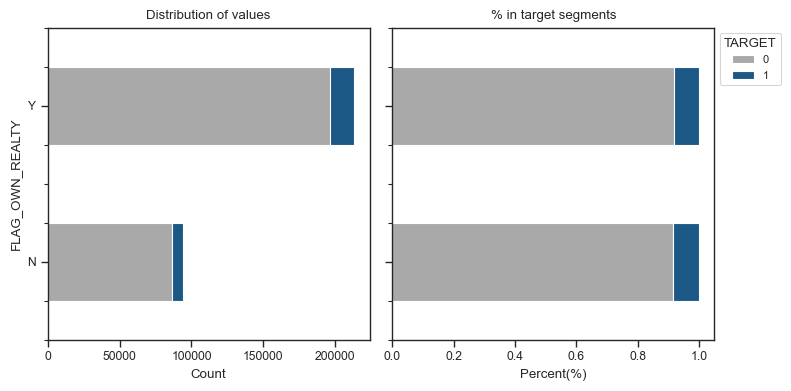

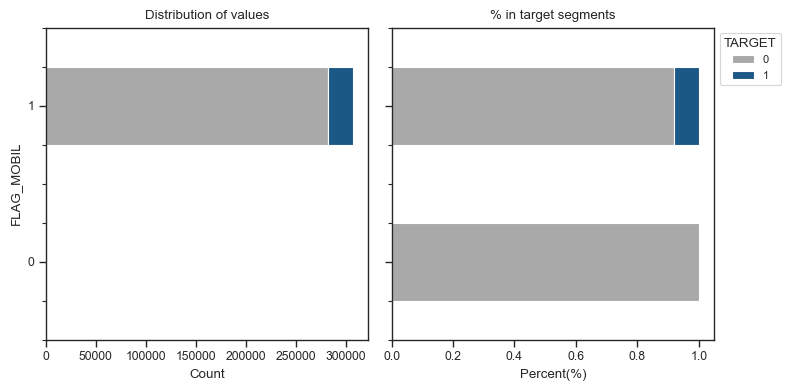

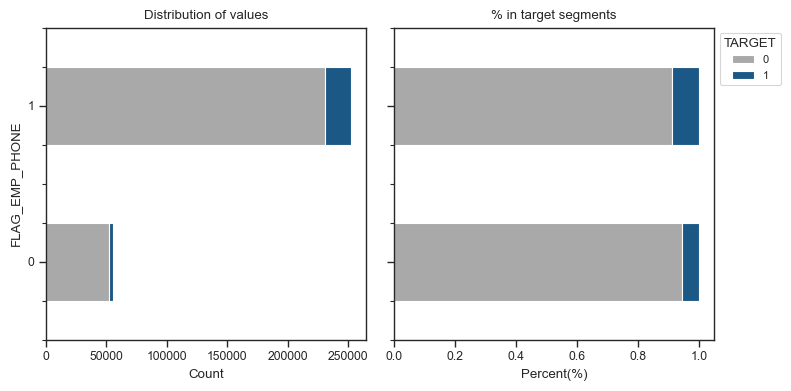

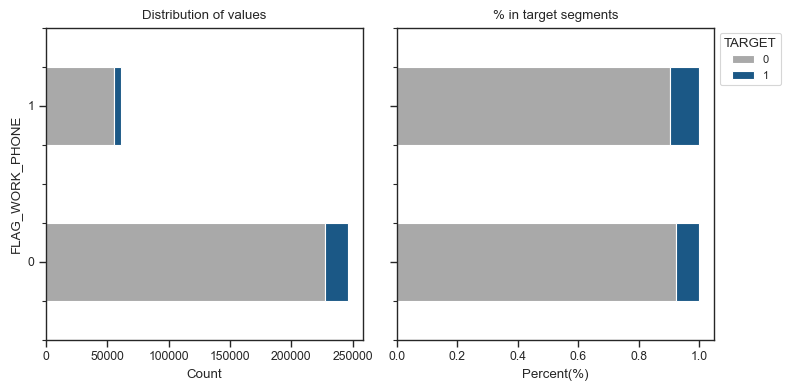

...

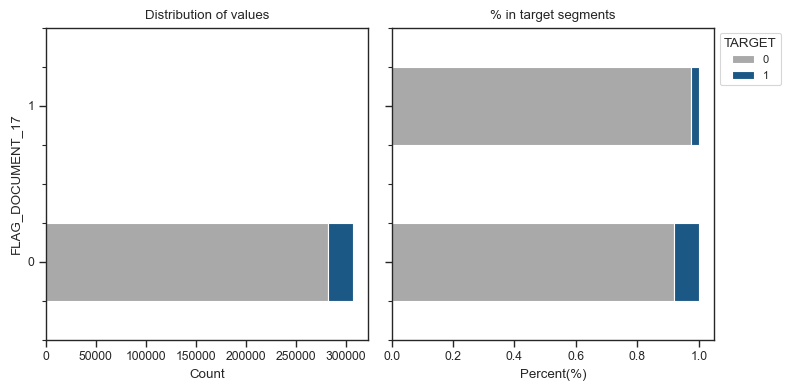

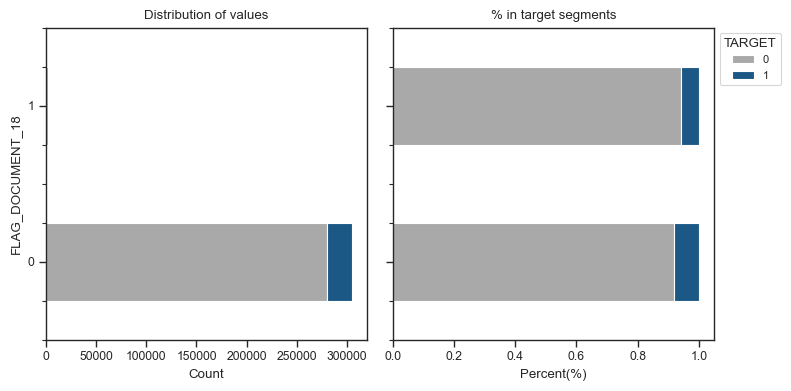

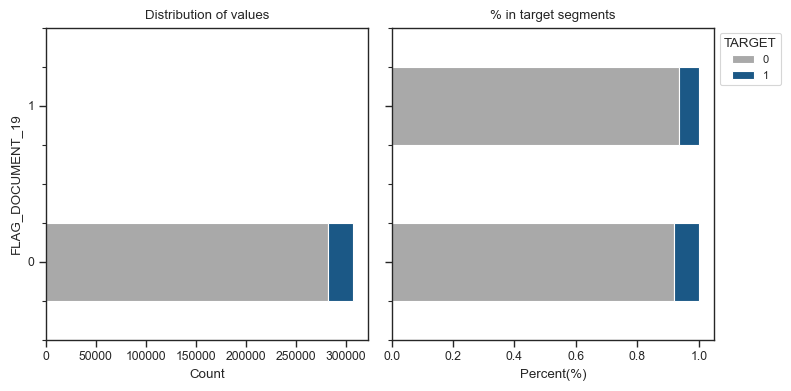

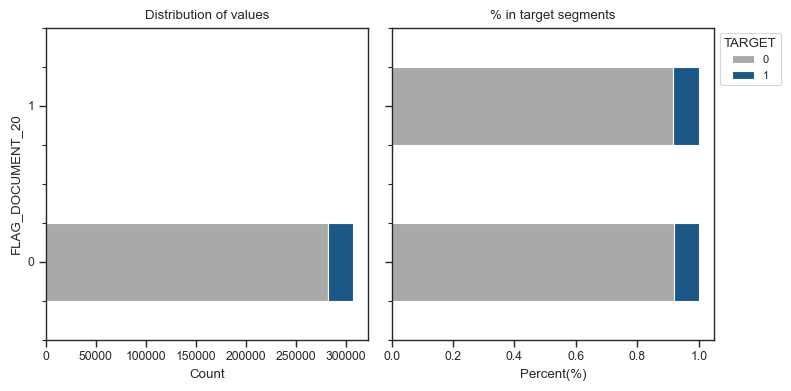

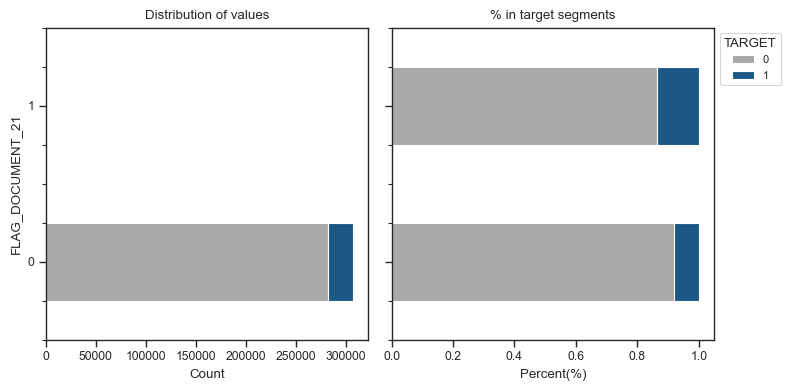

In [103]:
# Bivariate analysis
group = app_data_structure[app_data_structure.GROUP=='FLAG']
group_analysis(data=app_data,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

**Infer from the graph:**
* applicants with FLAG_DOCUMENT_2 = 1 are more likely to be defaulter than whom FLAG_DOCUMENT_2 = 0

### History Data

##### LOAN_DETAIL_HISTORY

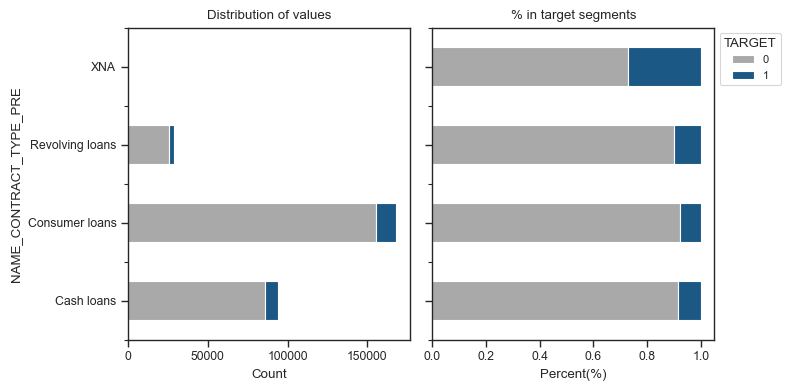

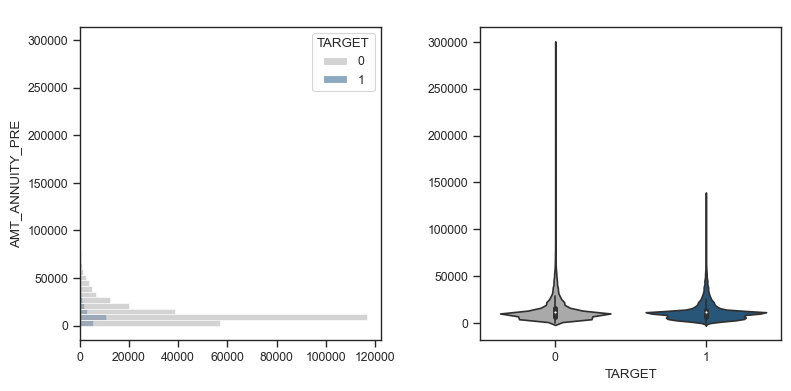

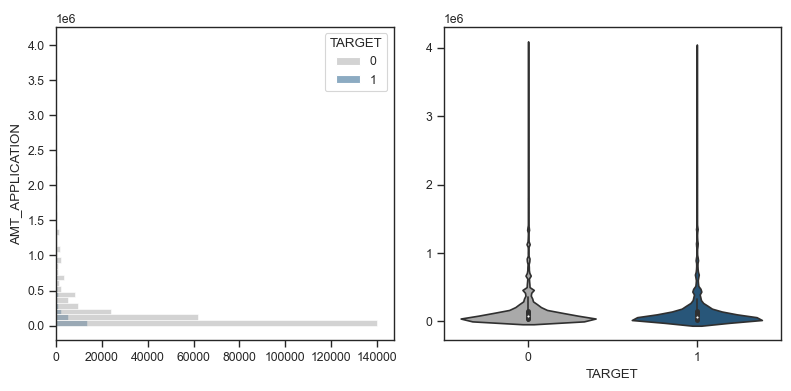

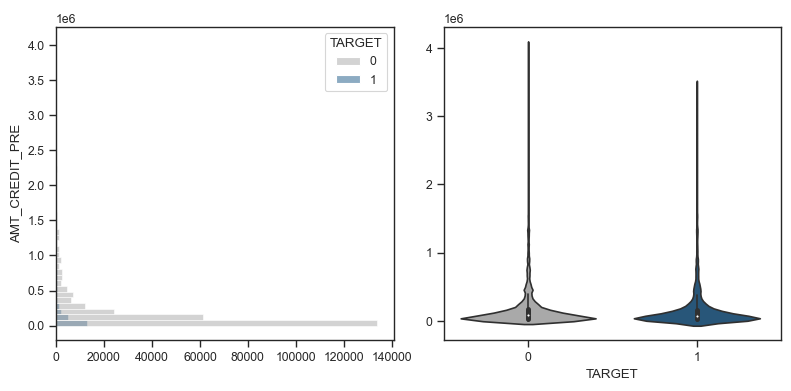

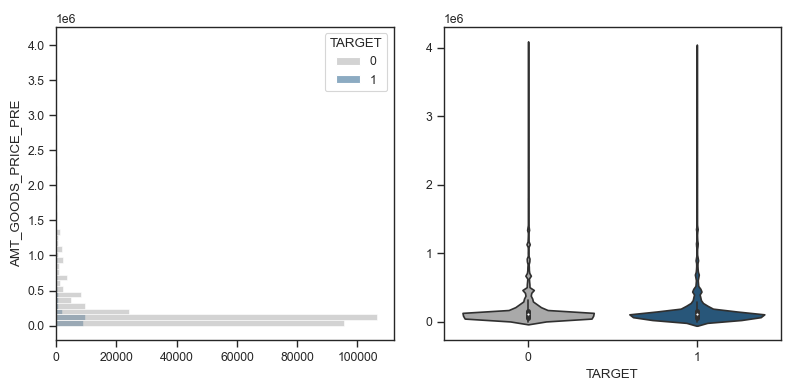

...

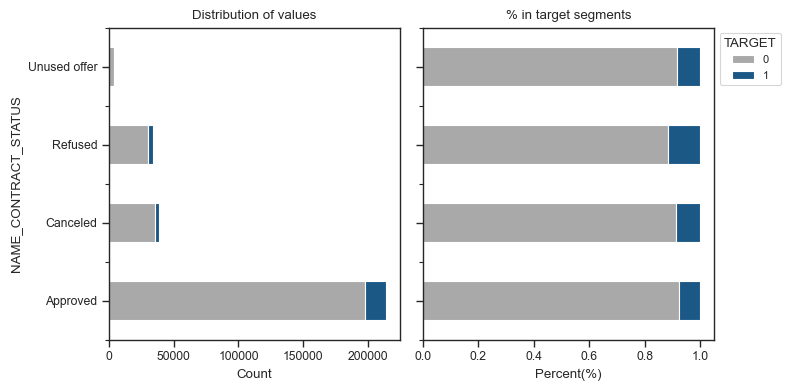

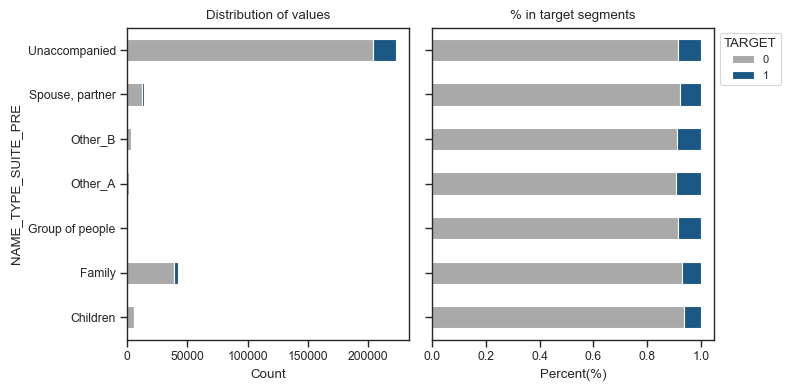

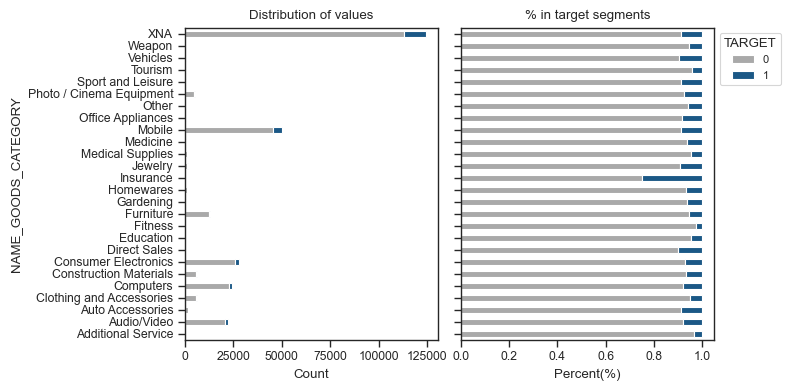

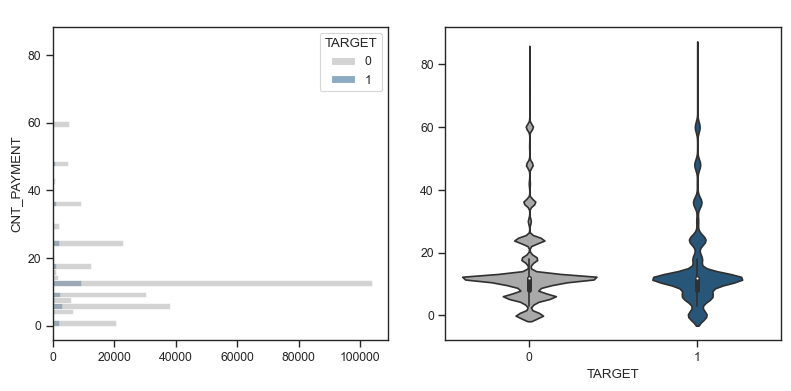

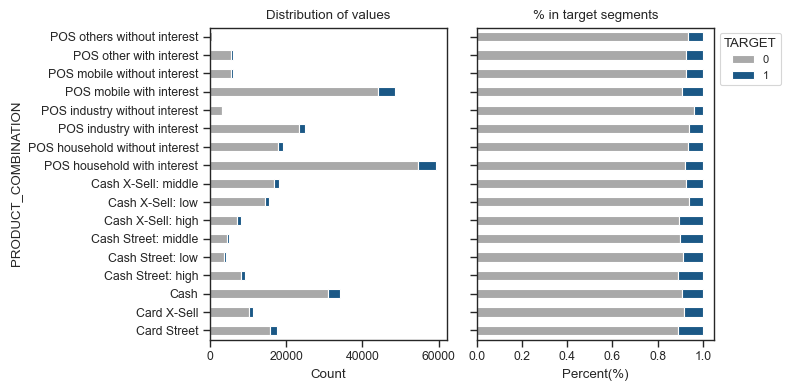

In [115]:
# Bivariate analysis
group = app_pre_structure[app_pre_structure.GROUP=='LOAN_DETAIL_HISTORY']
group_analysis(data=combined_df,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

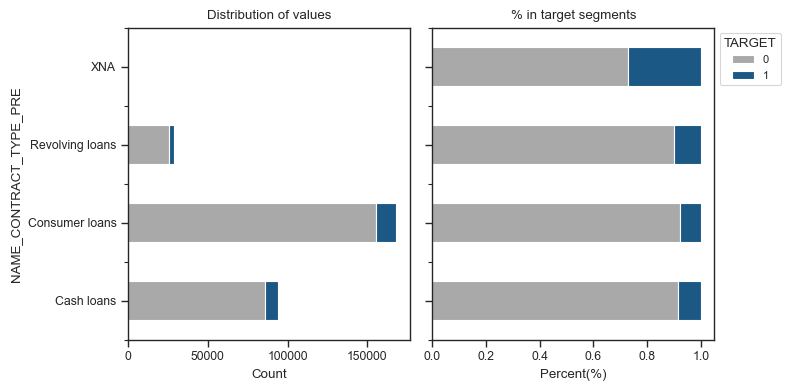

In [116]:
bi_plot(data=combined_df, col='NAME_CONTRACT_TYPE_PRE', var_type='c', face_highlight=True)

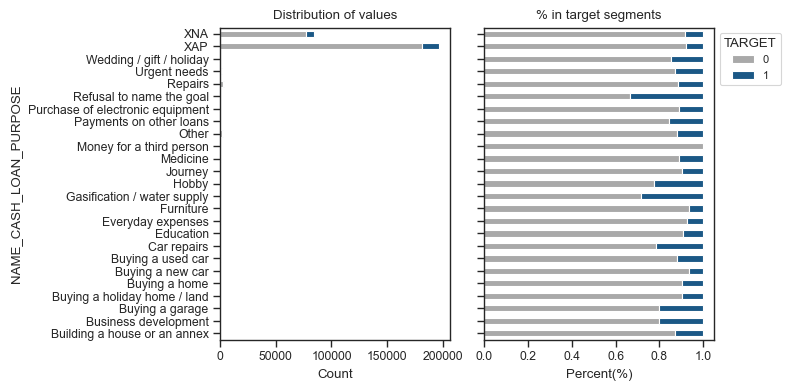

In [117]:
bi_plot(data=combined_df, col='NAME_CASH_LOAN_PURPOSE', var_type='c', face_highlight=True)

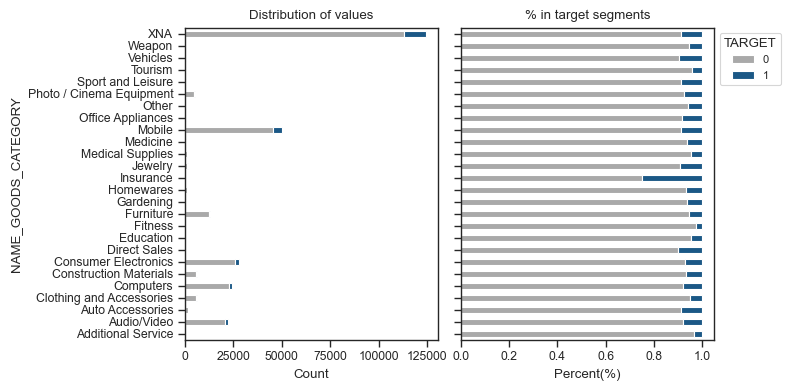

In [118]:
bi_plot(data=combined_df, col='NAME_GOODS_CATEGORY', var_type='c', face_highlight=True)

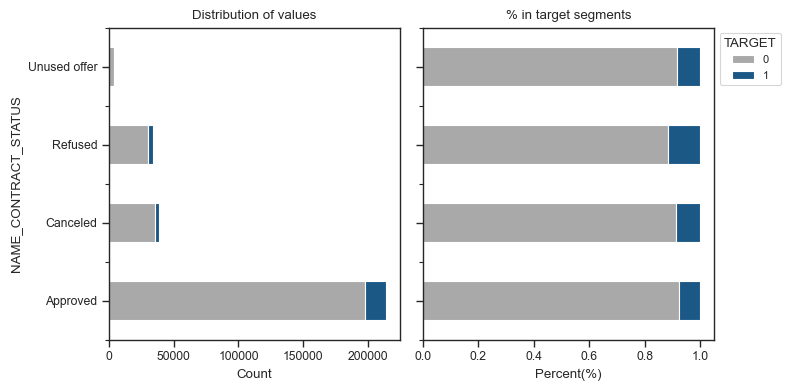

In [119]:
bi_plot(data=combined_df, col='NAME_CONTRACT_STATUS', var_type='c', face_highlight=True)

**Infer from the graph:**
* Applicants  with NAME_CONTRACT_TYPE_PRE=XNA have much more percent of defaulters than other types
* People who refuse to tell the goal are more likely to be defaulters
* People whom previous applications were refused tend to default than other's contract status
* People who borrowed for Insurance in history are more likely to be defaulters

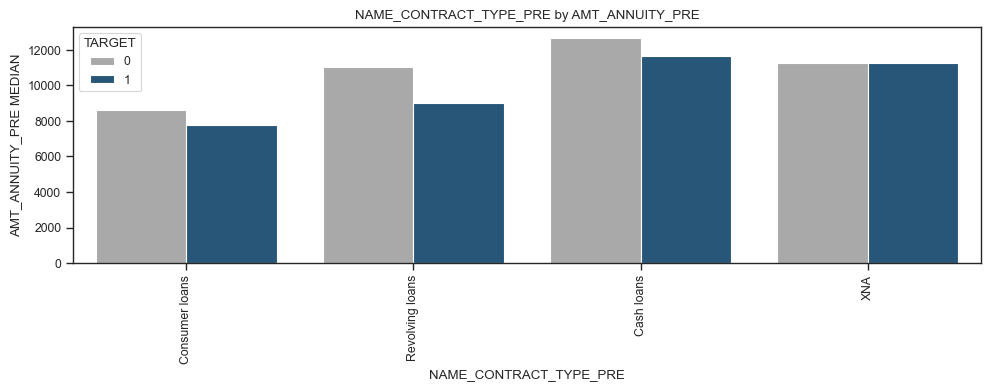

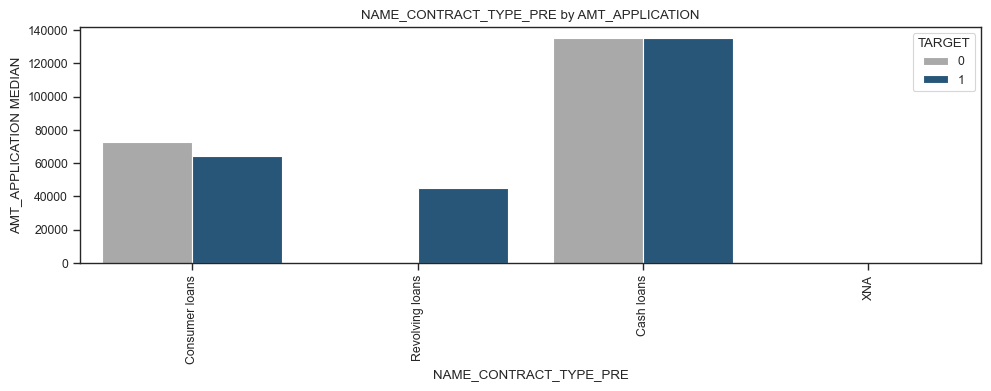

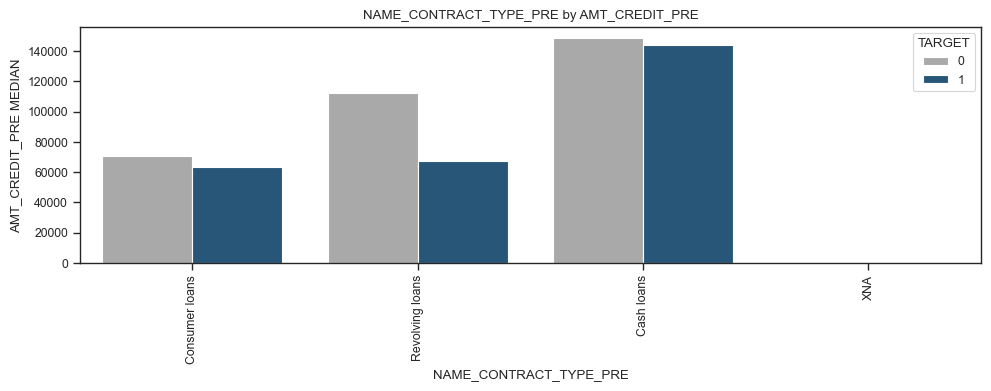

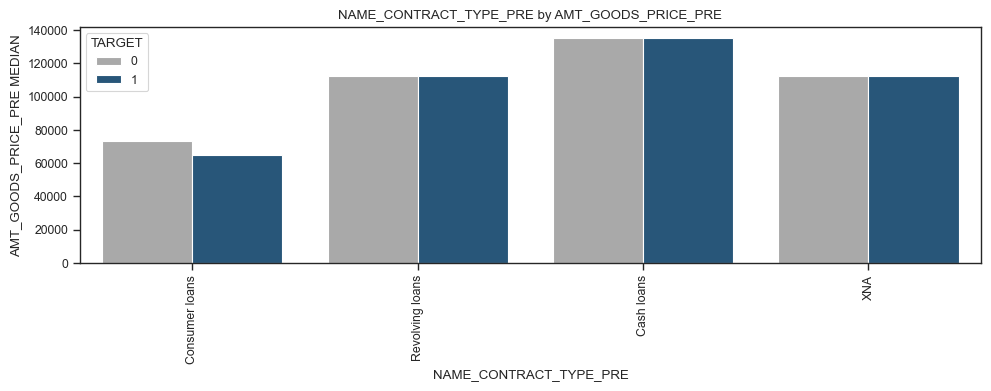

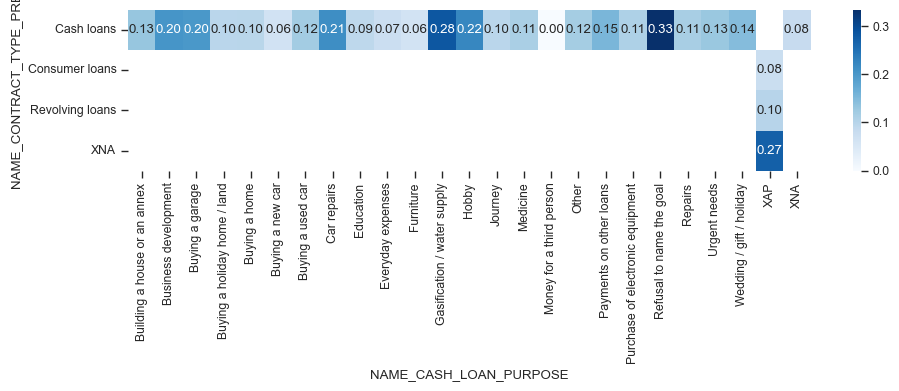

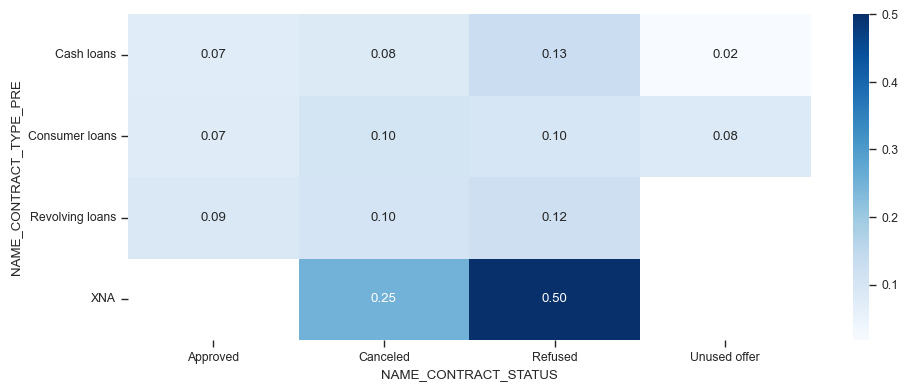

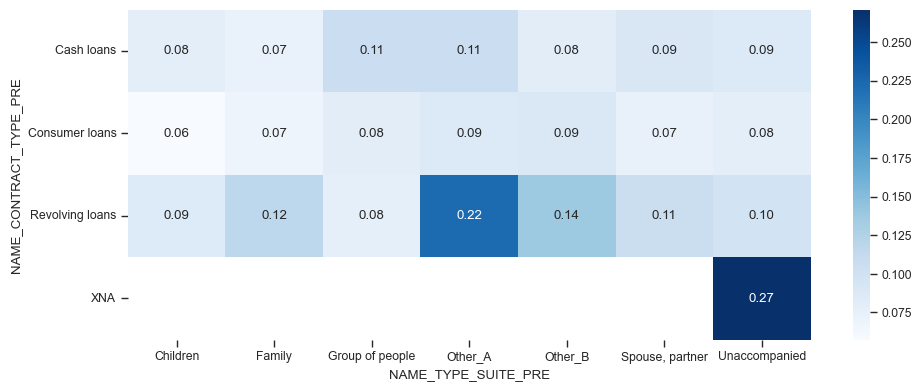

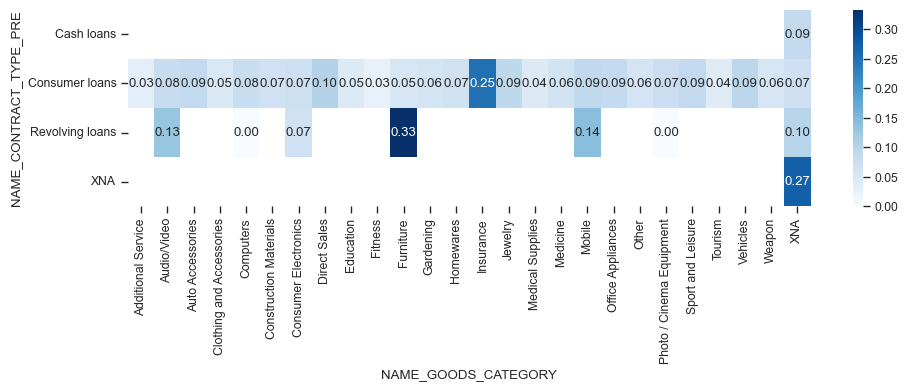

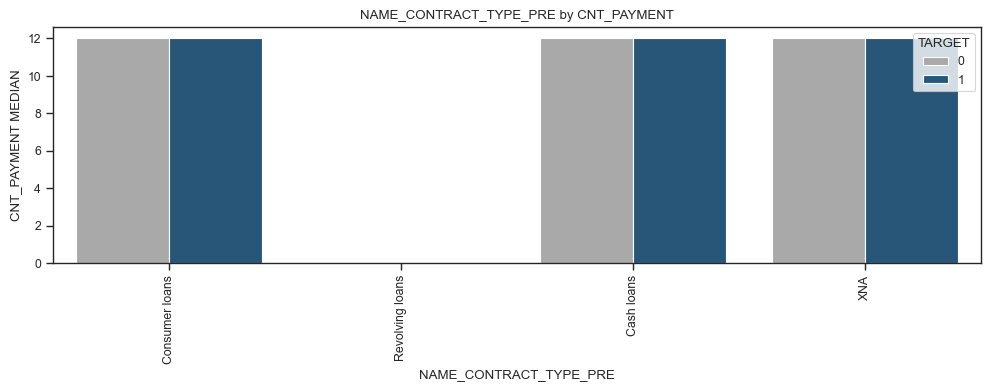

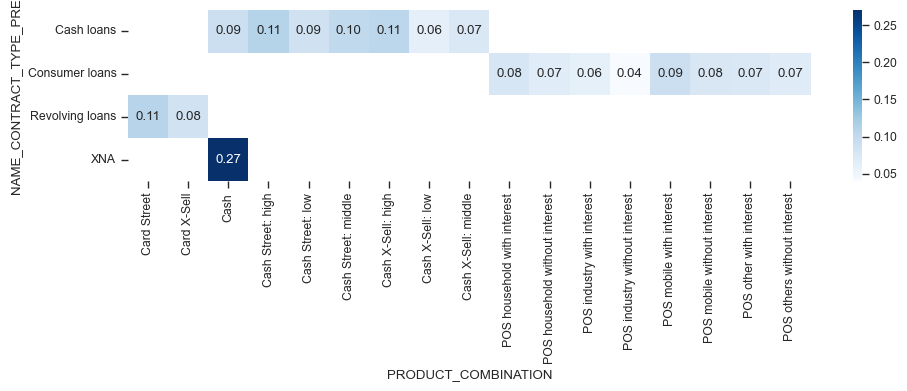

<Figure size 1000x400 with 0 Axes>

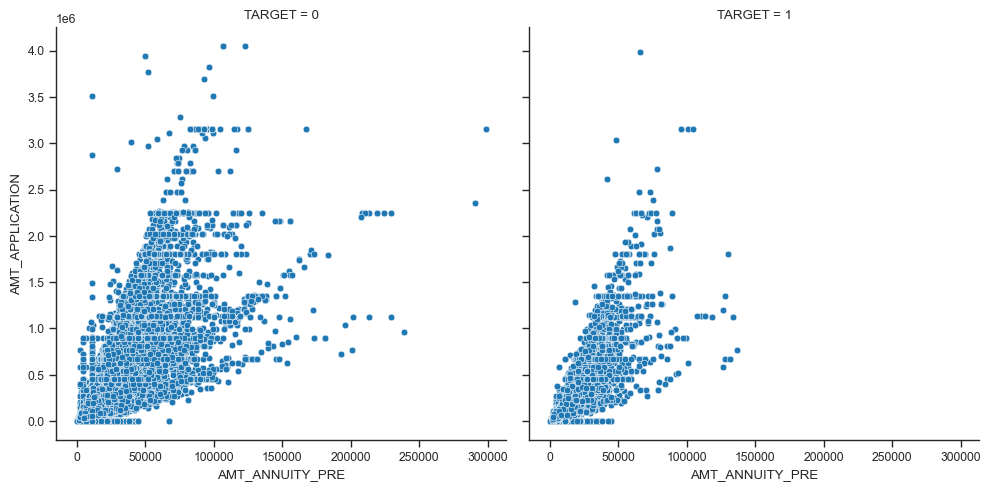

<Figure size 1000x400 with 0 Axes>

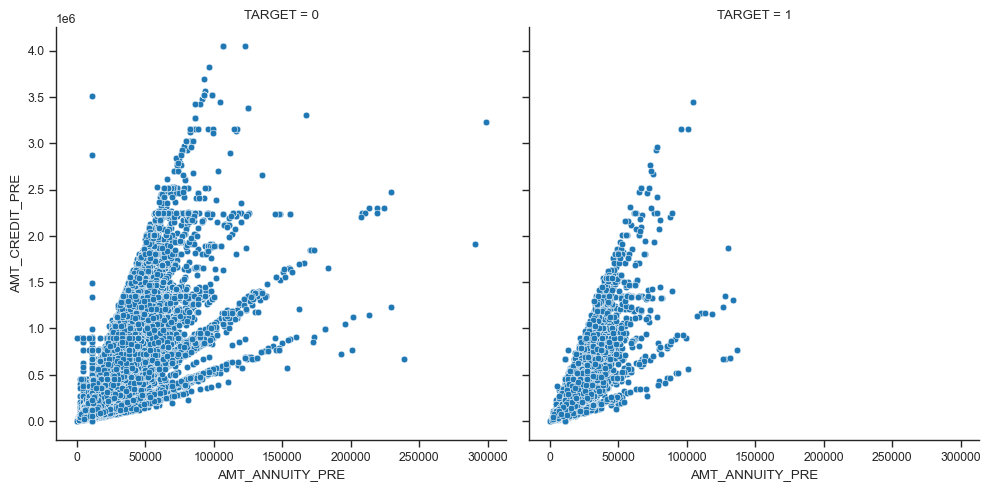

<Figure size 1000x400 with 0 Axes>

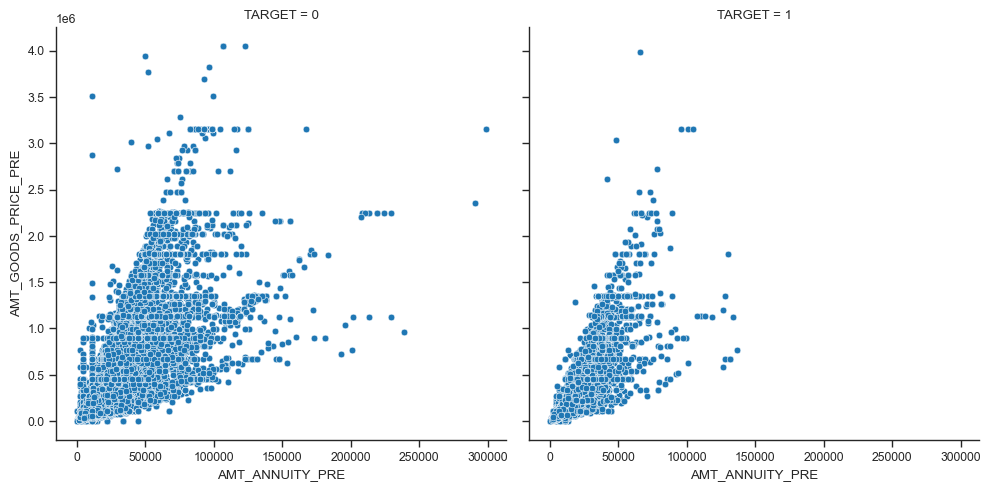

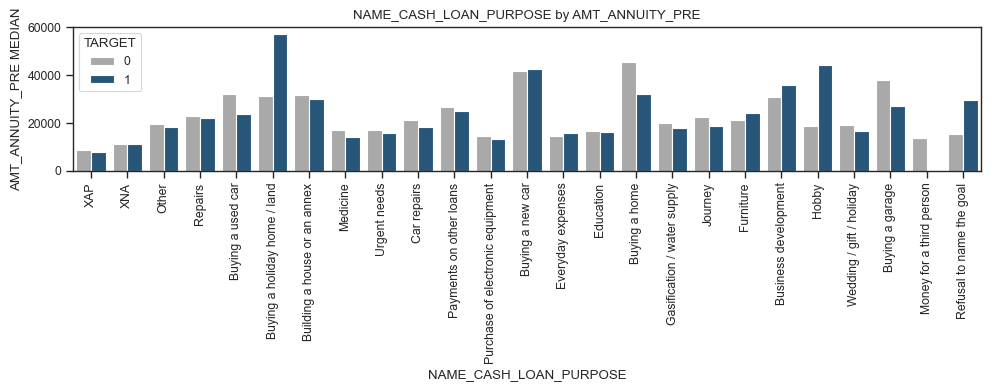

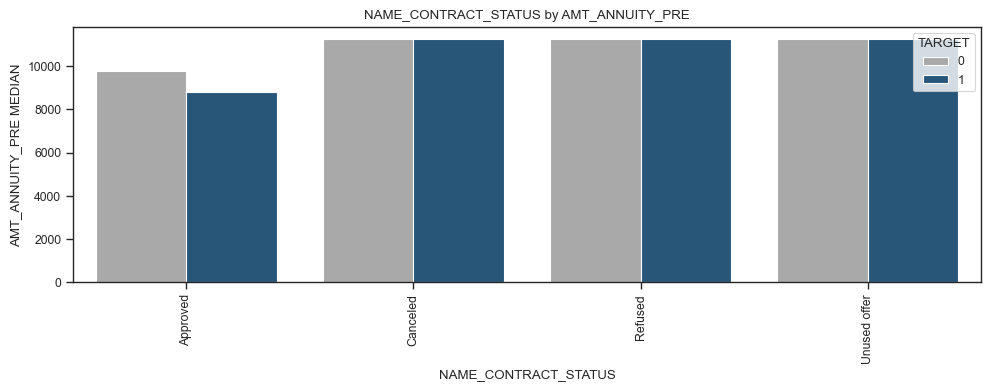

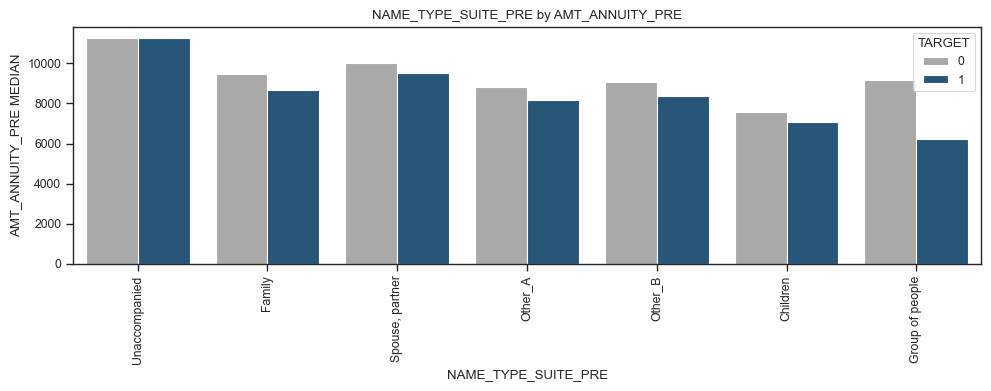

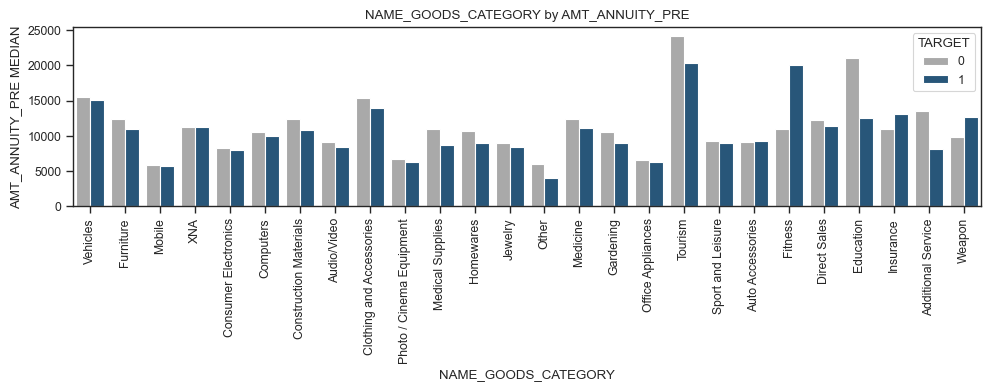

<Figure size 1000x400 with 0 Axes>

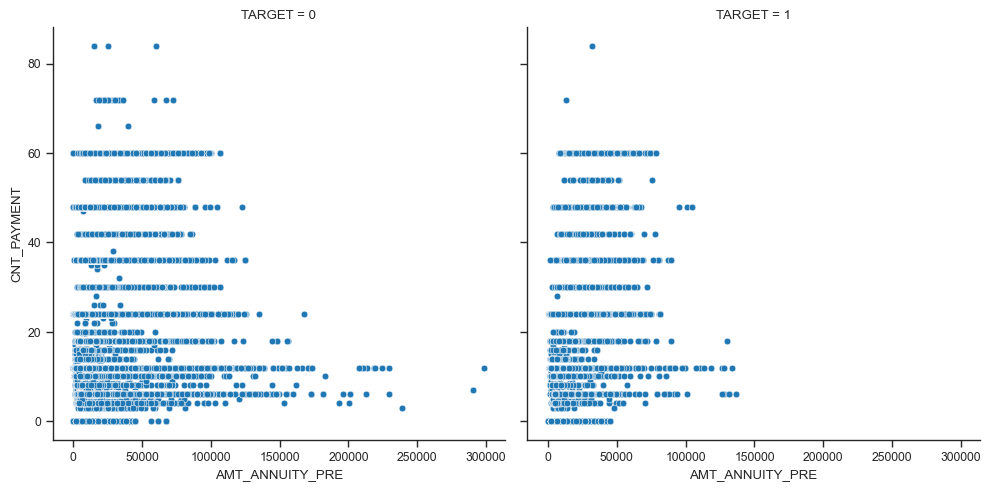

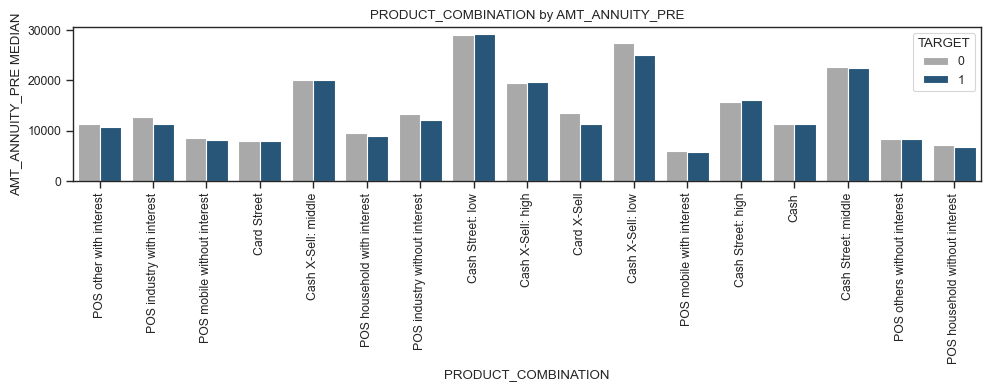

<Figure size 1000x400 with 0 Axes>

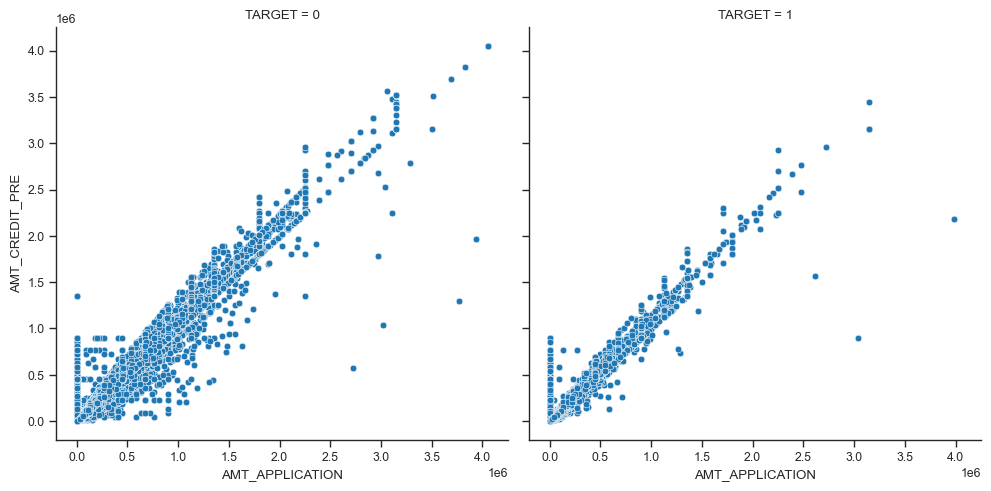

<Figure size 1000x400 with 0 Axes>

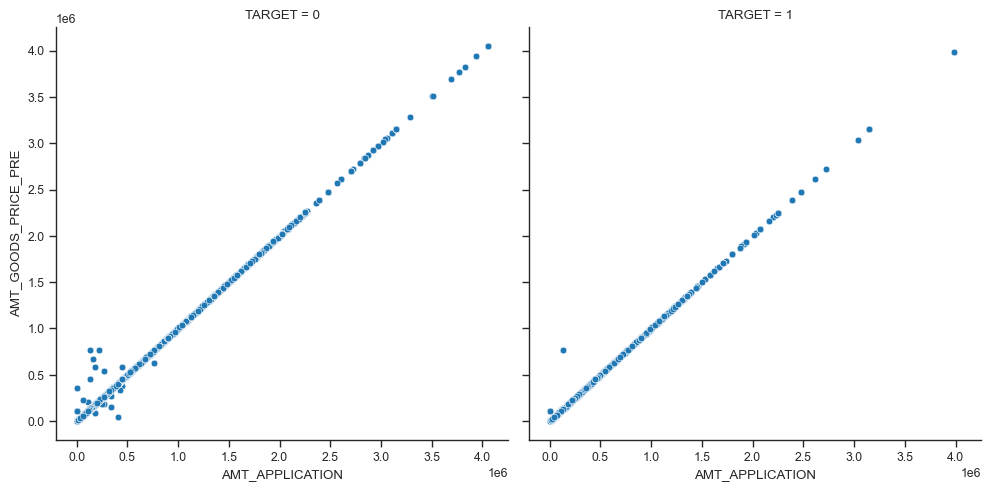

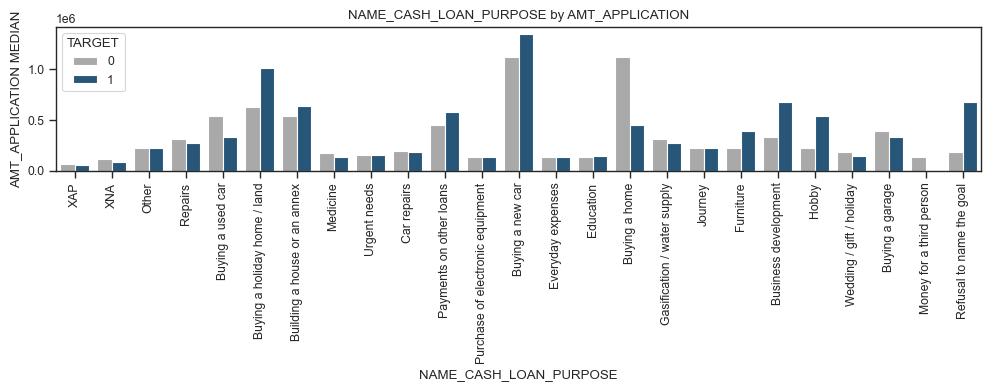

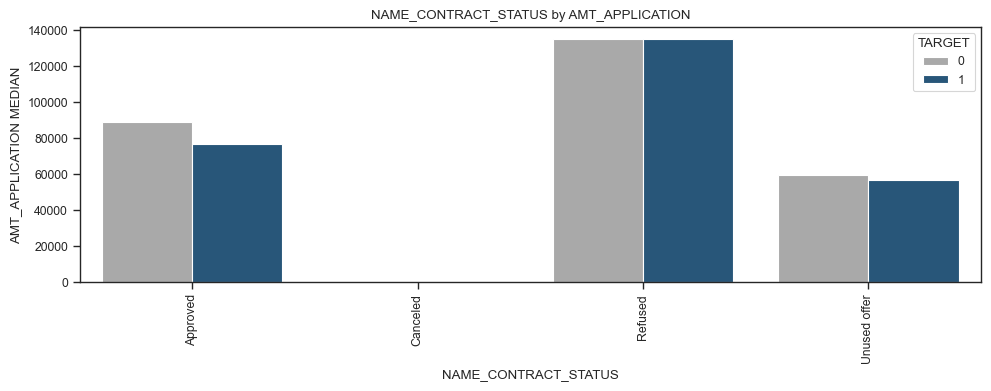

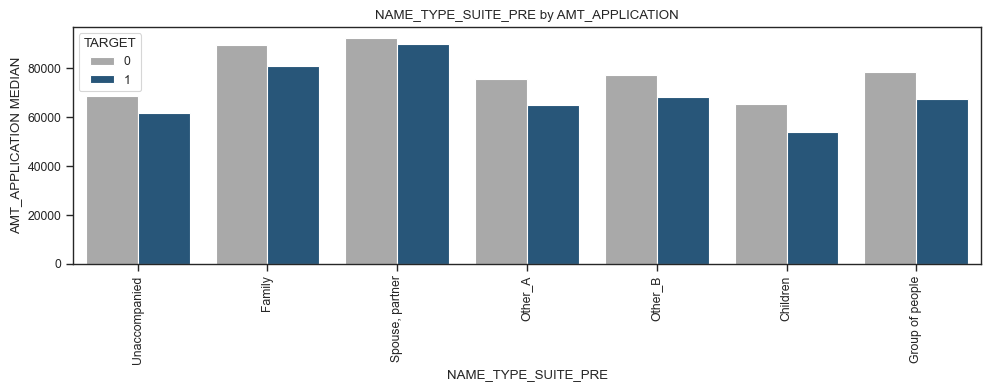

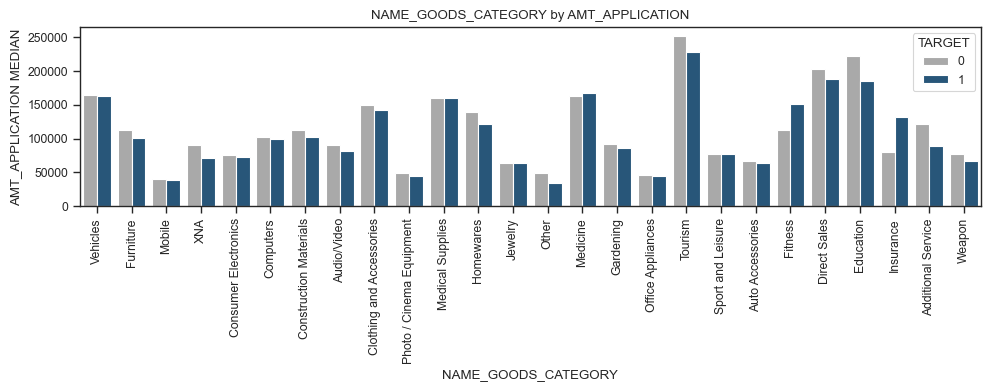

<Figure size 1000x400 with 0 Axes>

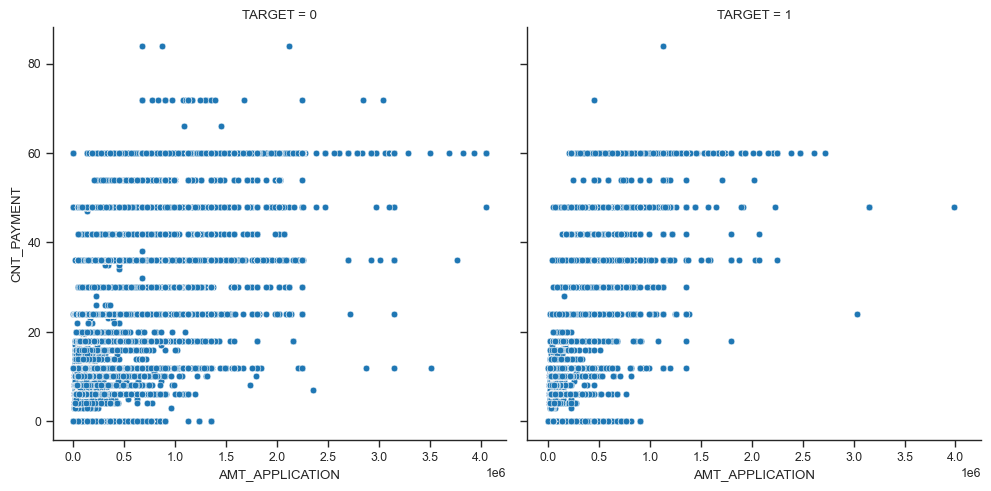

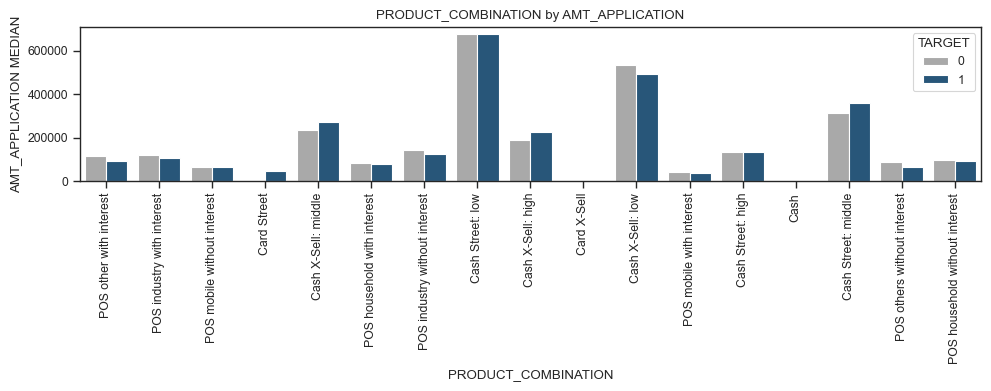

<Figure size 1000x400 with 0 Axes>

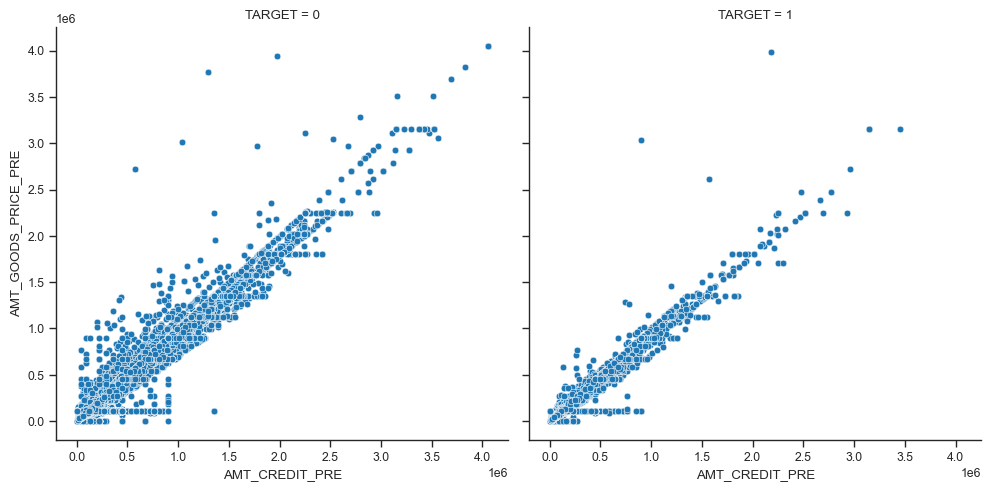

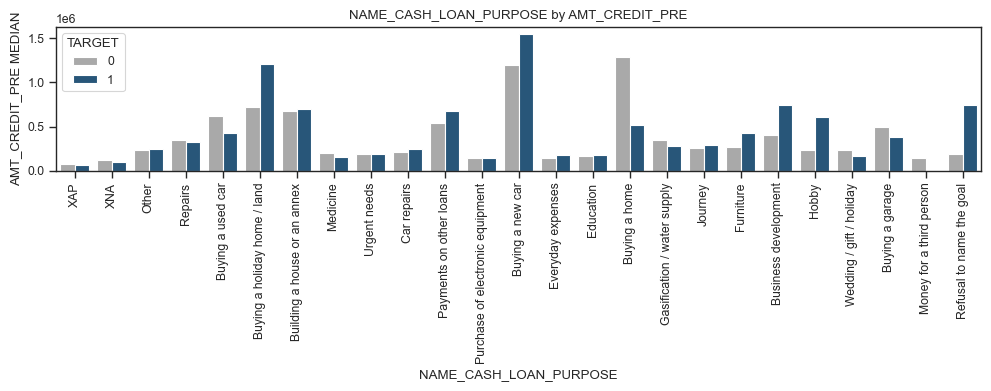

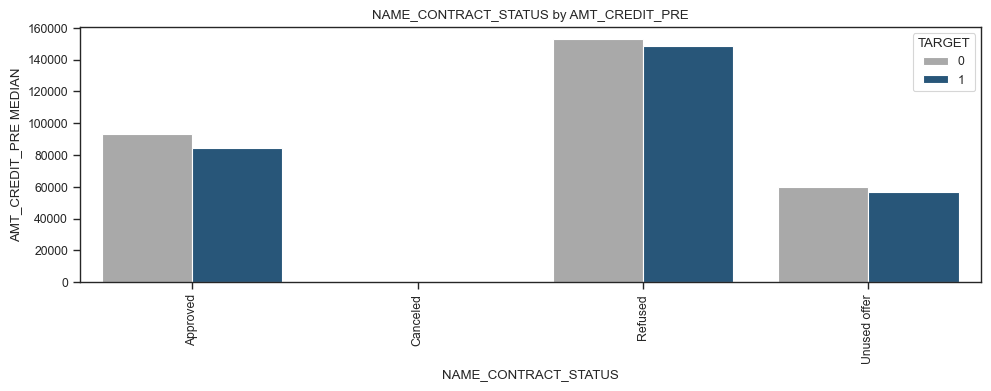

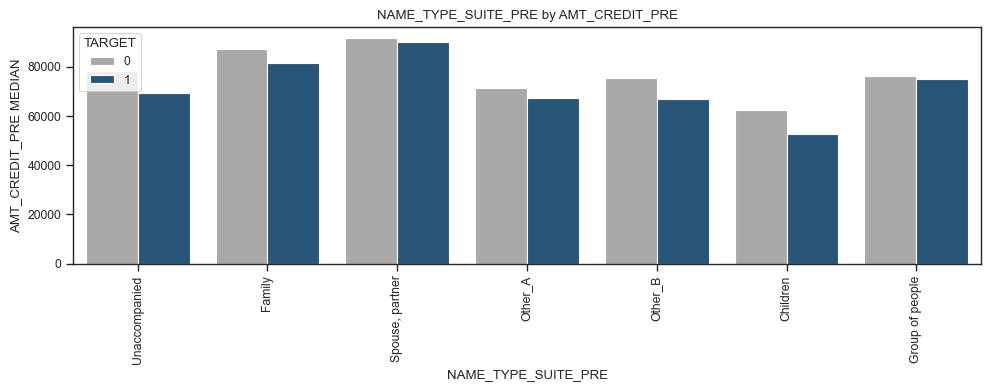

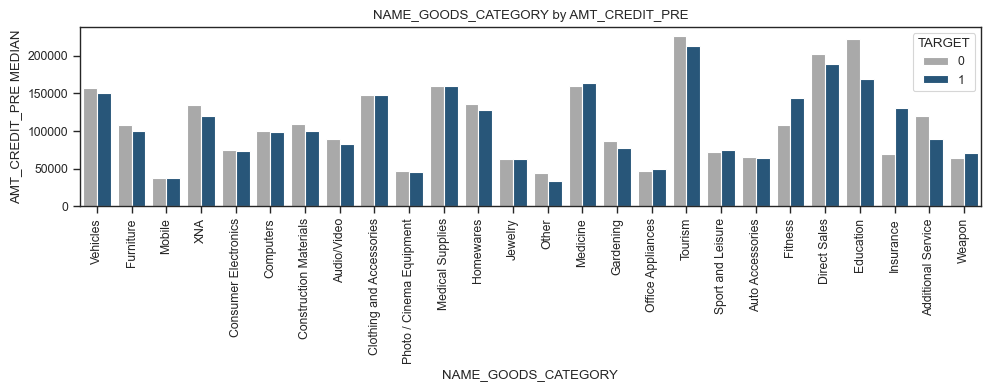

<Figure size 1000x400 with 0 Axes>

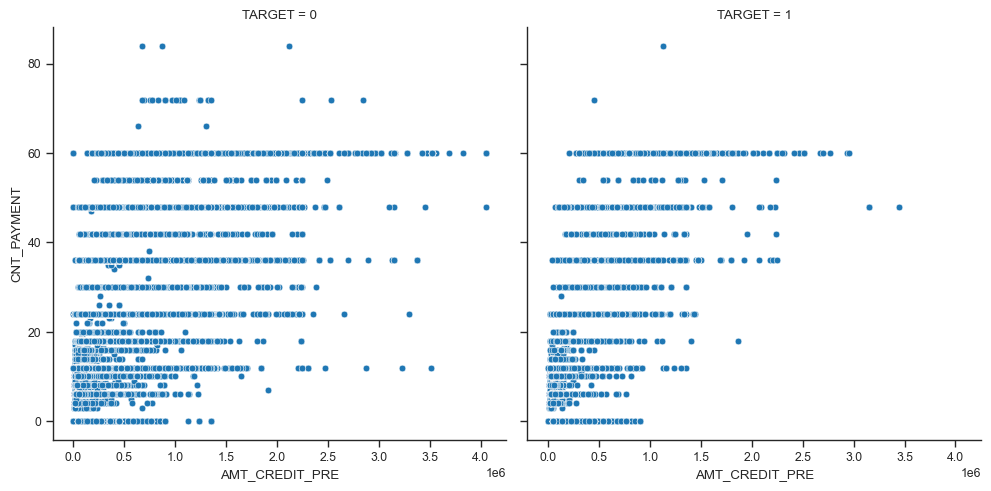

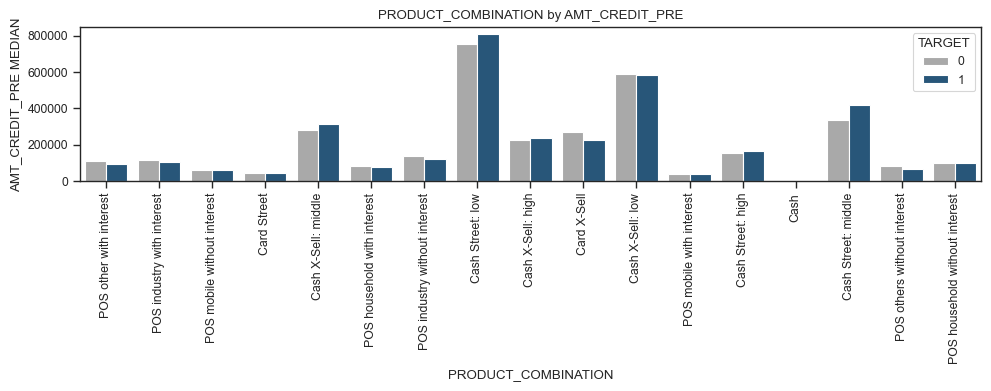

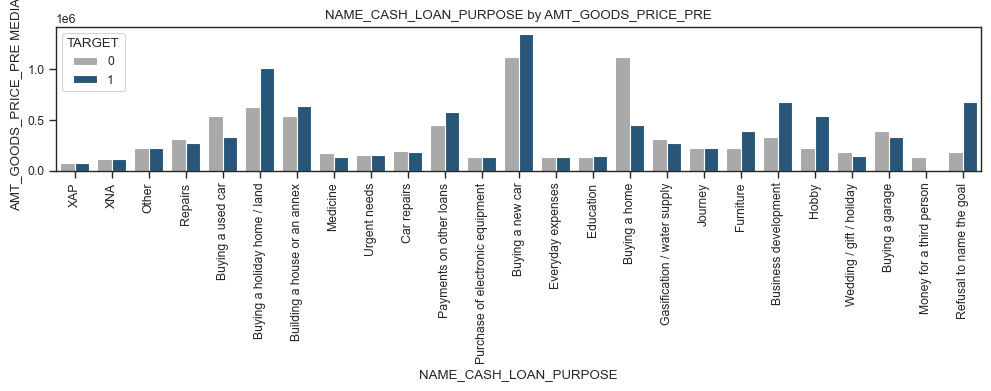

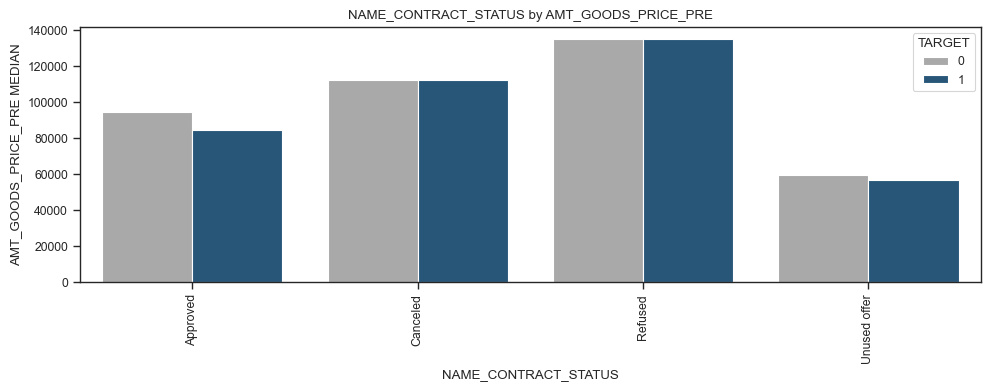

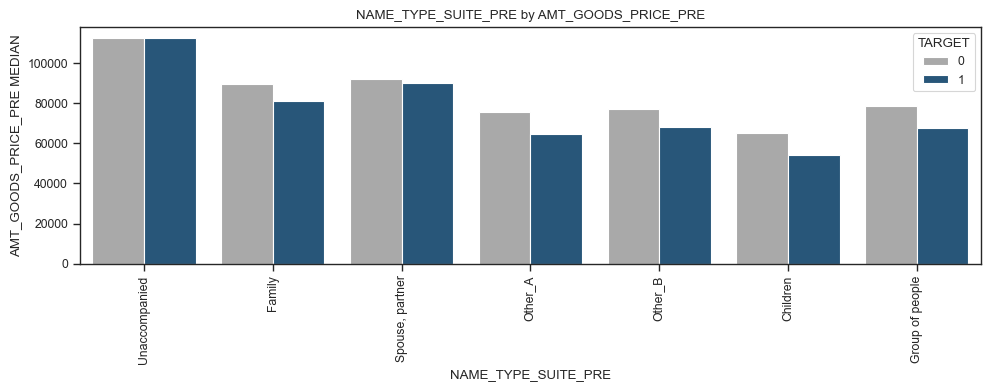

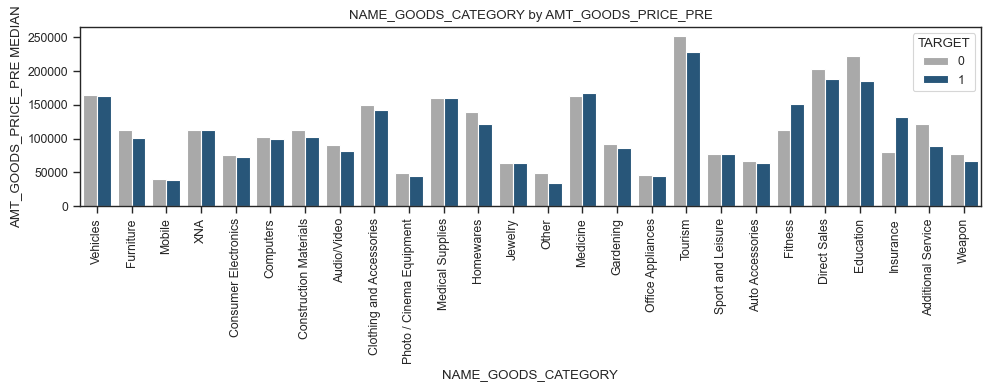

<Figure size 1000x400 with 0 Axes>

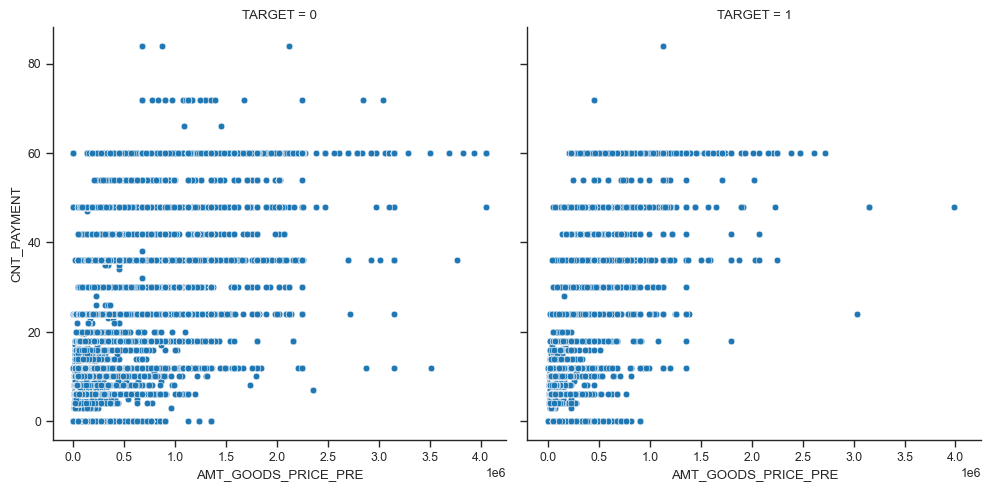

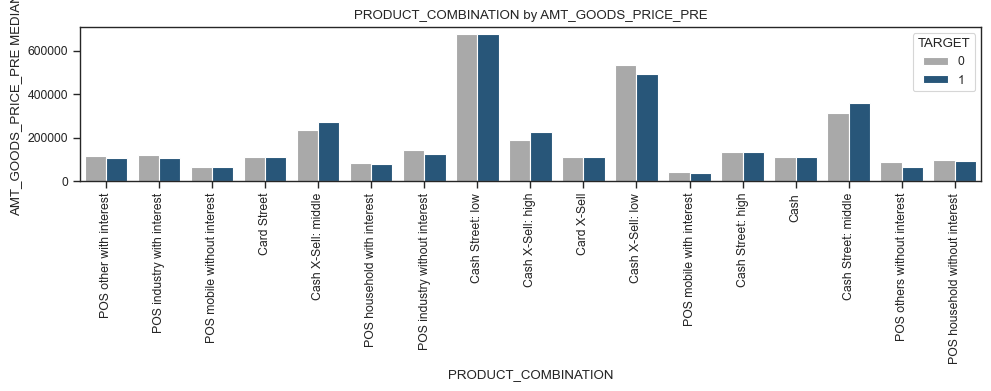

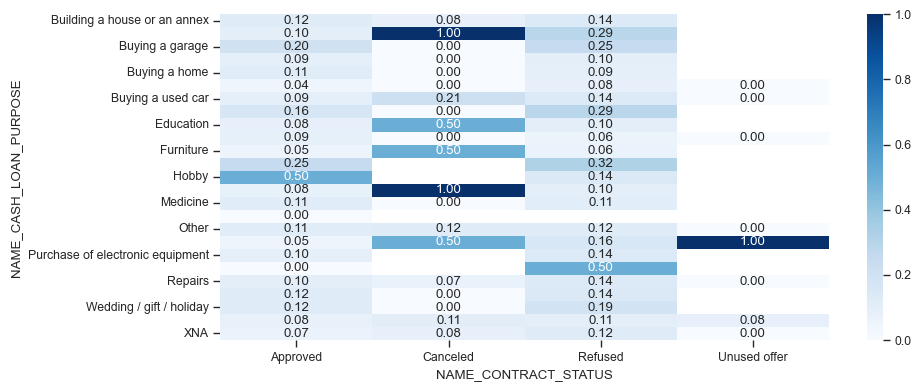

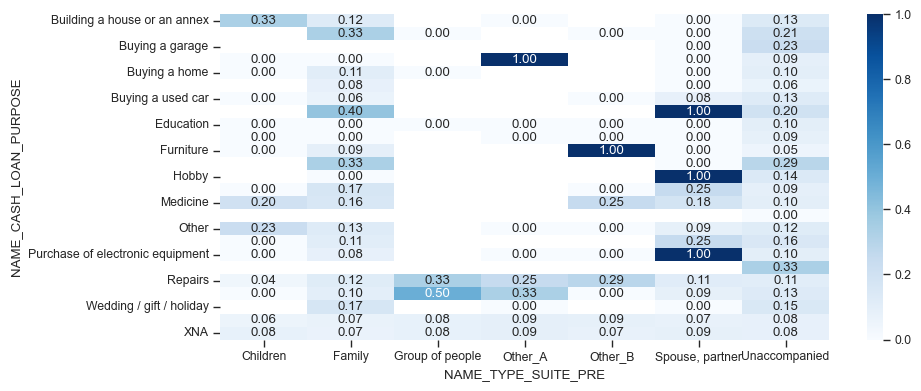

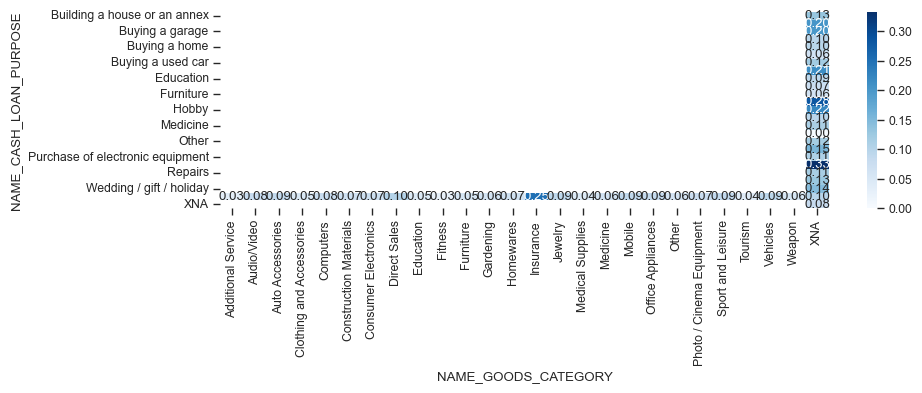

...

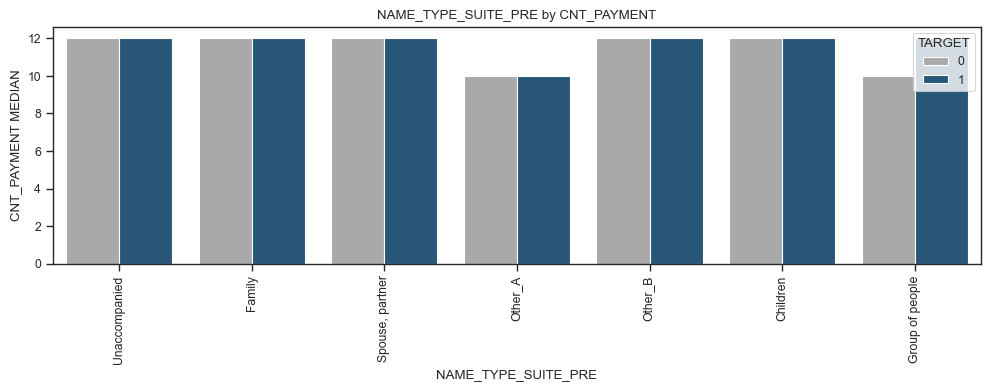

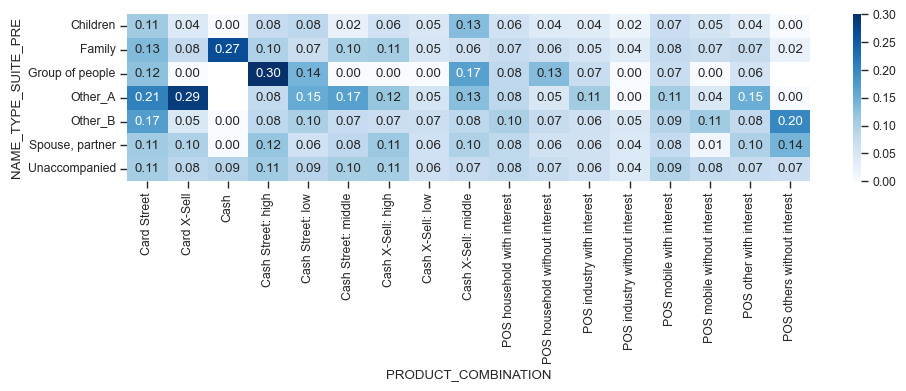

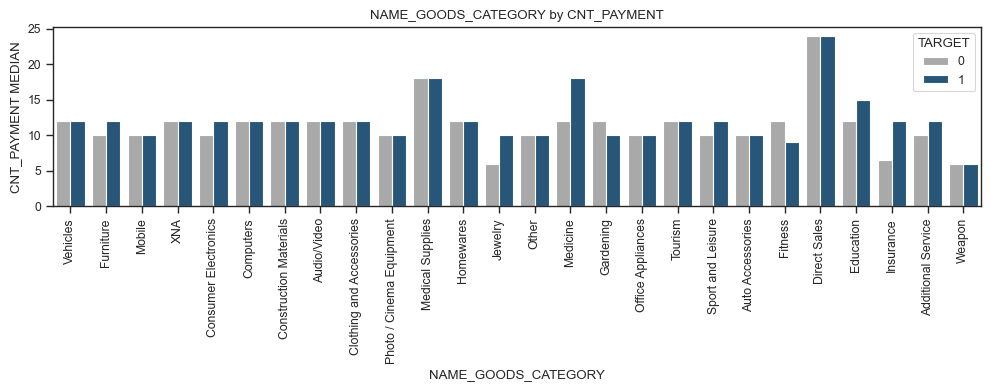

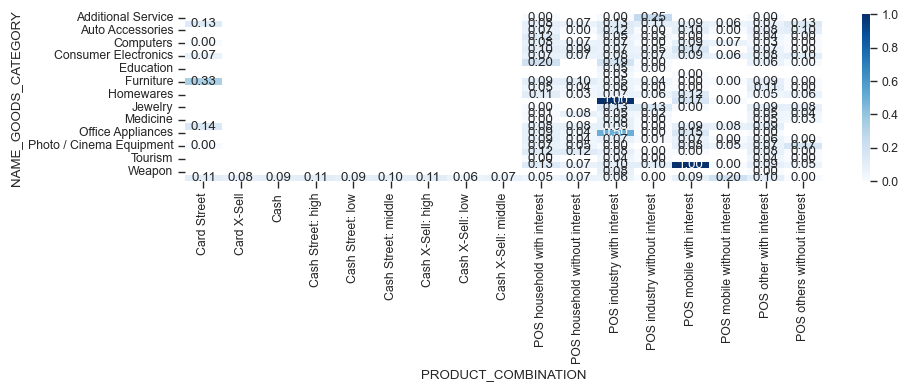

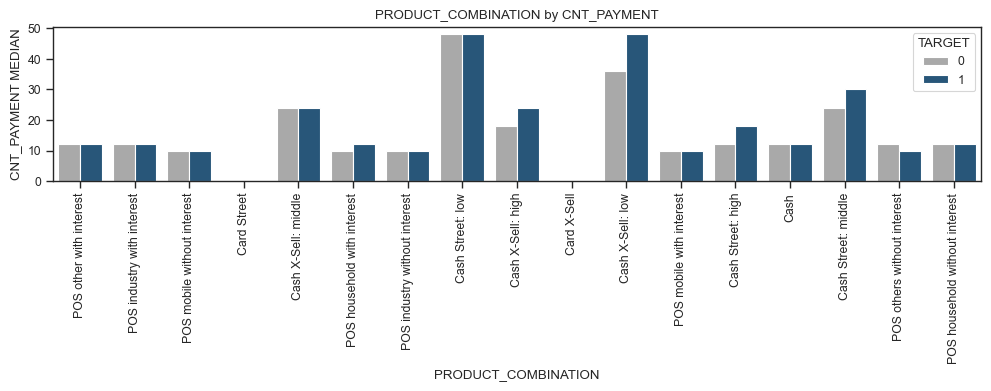

In [120]:
# Multivariate analysis
%run Visual_Lib.ipynb
group = app_pre_structure[app_pre_structure.GROUP=='LOAN_DETAIL_HISTORY']
group_analysis(data=combined_df,data_structure=group, cols=group.COLUMN_NAME, 
               analysis_type='multivariate', c_chart='heatmap', figsize=(10,4))

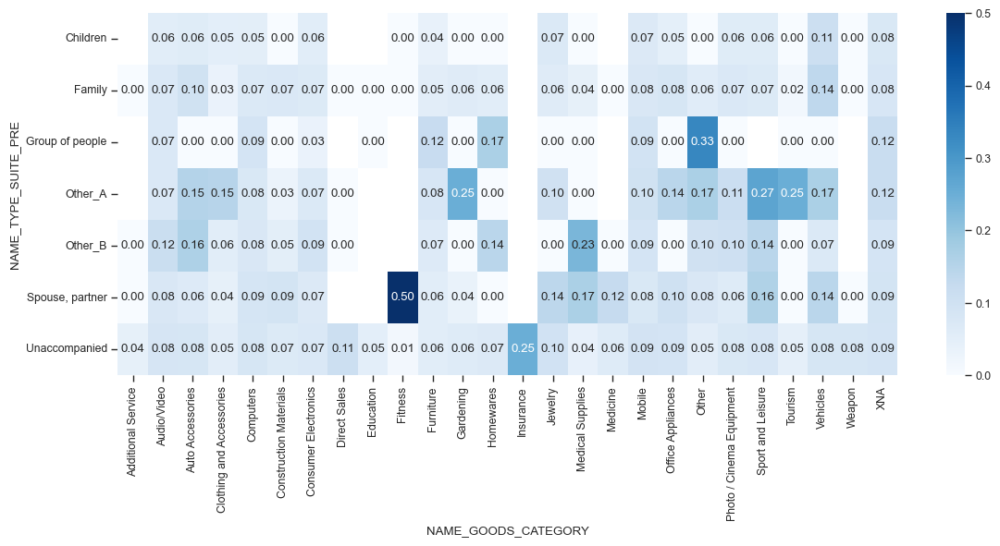

In [121]:
multi_plot(data=combined_df, var1='NAME_TYPE_SUITE_PRE', 
           var2='NAME_GOODS_CATEGORY', target='TARGET', var_type='c', chart='heatmap', figsize=(12,6))

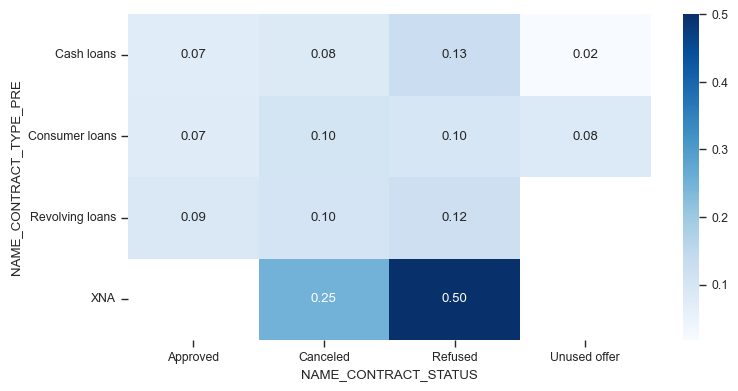

In [122]:
multi_plot(data=combined_df, var1='NAME_CONTRACT_TYPE_PRE', 
           var2='NAME_CONTRACT_STATUS', target='TARGET', var_type='c', chart='heatmap')

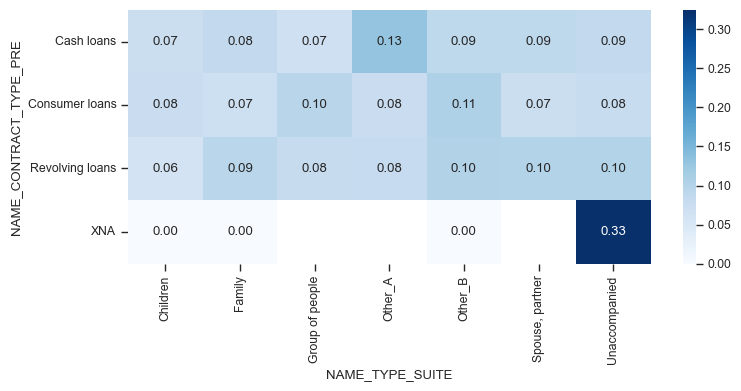

In [123]:
multi_plot(data=combined_df, var1='NAME_CONTRACT_TYPE_PRE', 
           var2='NAME_TYPE_SUITE', target='TARGET', var_type='c', chart='heatmap')

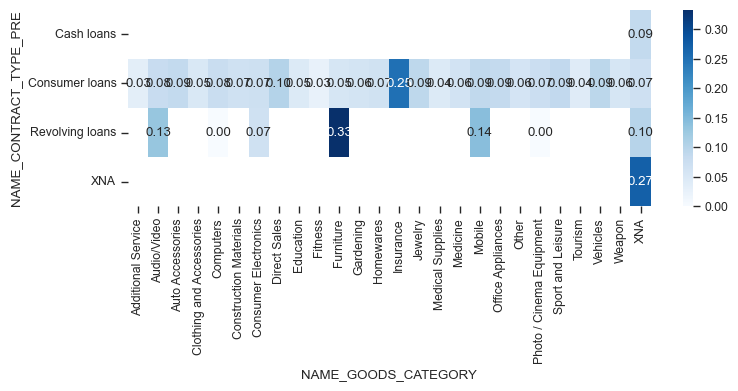

In [124]:
multi_plot(data=combined_df, var1='NAME_CONTRACT_TYPE_PRE', 
           var2='NAME_GOODS_CATEGORY', target='TARGET', var_type='c', chart='heatmap')

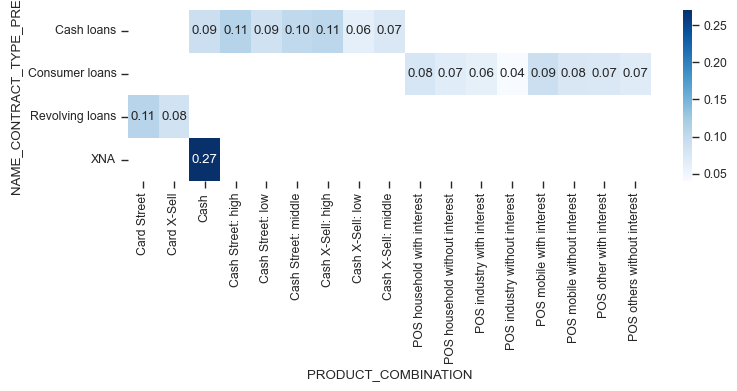

In [125]:
multi_plot(data=combined_df, var1='NAME_CONTRACT_TYPE_PRE', 
           var2='PRODUCT_COMBINATION', target='TARGET', var_type='c', chart='heatmap')

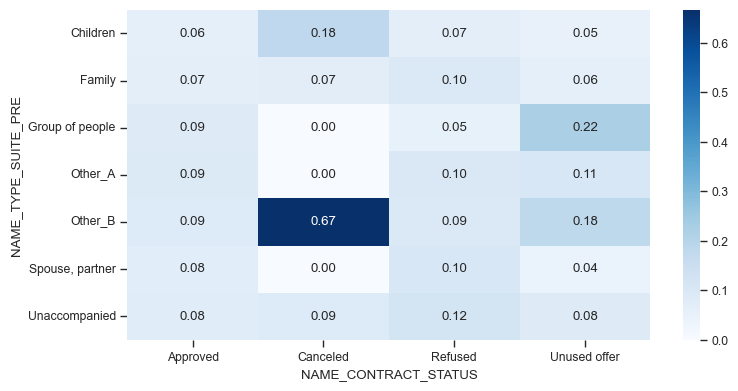

In [126]:
multi_plot(data=combined_df, var1='NAME_TYPE_SUITE_PRE', 
           var2='NAME_CONTRACT_STATUS', target='TARGET', var_type='c', chart='heatmap')

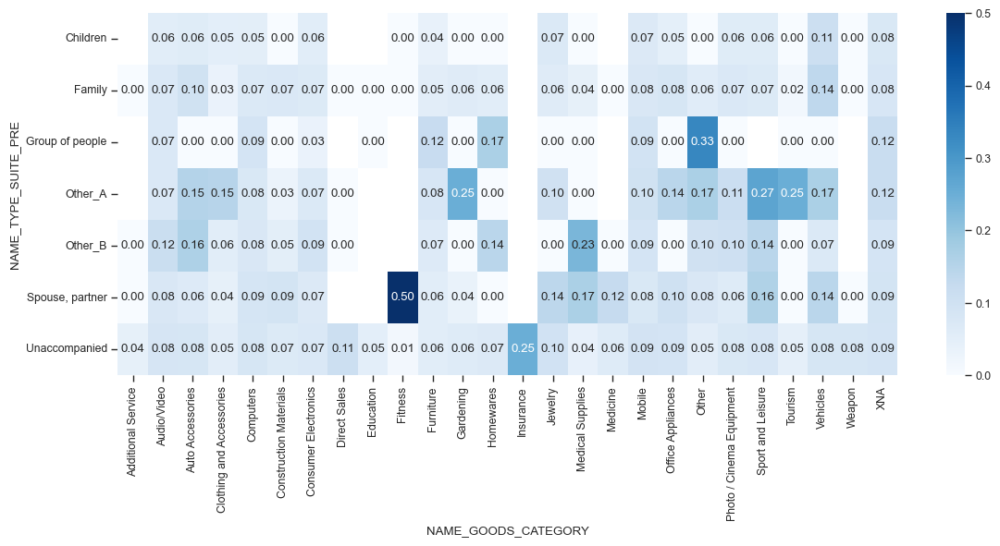

In [128]:
multi_plot(data=combined_df, var1='NAME_TYPE_SUITE_PRE', 
           var2='NAME_GOODS_CATEGORY', target='TARGET', var_type='c', chart='heatmap',  figsize=(12,6))

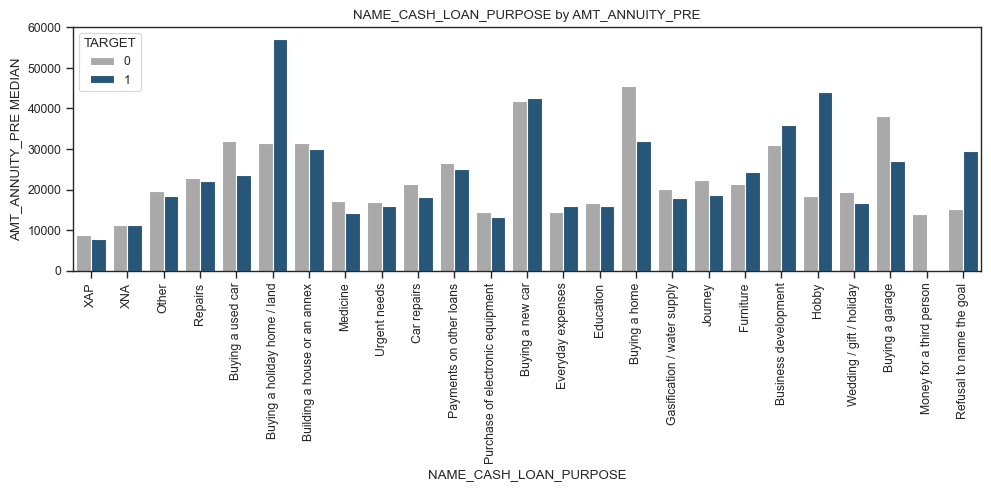

In [129]:
multi_plot(data=combined_df, var1='NAME_CASH_LOAN_PURPOSE', 
           var2='AMT_ANNUITY_PRE', target='TARGET', var_type='b', figsize=(10,5))

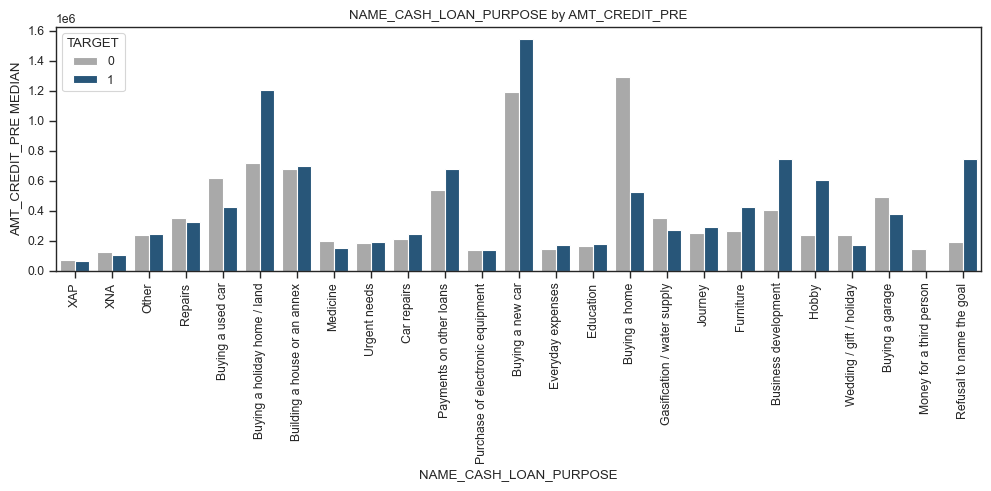

In [130]:
multi_plot(data=combined_df, var1='NAME_CASH_LOAN_PURPOSE', 
           var2='AMT_CREDIT_PRE', target='TARGET', var_type='b',  figsize=(10,5))

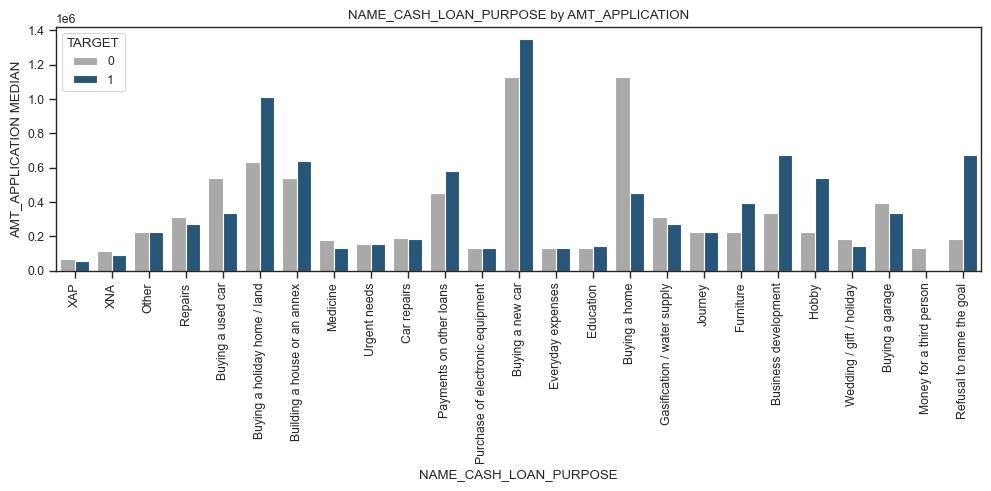

In [131]:
multi_plot(data=combined_df, var1='NAME_CASH_LOAN_PURPOSE', 
           var2='AMT_APPLICATION', target='TARGET', var_type='b',  figsize=(10,5))

**Infer from the graph:**
* with NAME_CONTRACT_TYPE_PRE=Cash loan, NAME_CASH_LOAN_PURPOSE = Refusal to name the goal have more percent of defaulters than other types
* with NAME_CONTRACT_TYPE_PRE=XNA, NAME_CONTRACT_STATUS = Refused have more percent of defaulters than other types
* with NAME_CONTRACT_TYPE_PRE=XNA, NAME_TYPE_SUITE = Uncompanied have more percent of defaulters than other types
* with NAME_CONTRACT_TYPE_PRE= Revolving loans, NAME_GOODS_CATEGORY = Furniture have more percent of defaulters than other types
* 67% applicants with NAME_TYPE_SUITE=Other_B, Contract status = Canceled are defaulter in current application
* 50% applicants with NAME_TYPE_SUITE=Spouse/partner, GOODS_CATEGORY = Fitness are defaulter in current application
* With purpose of Buying Holiday home/land, Hobby, refusal to tell, medians of AMT_ANNUITY, AMT_CREDIT, AMT_APPLICATION of defaulters are significantly higher than repayers's


##### LOAN_PROCESS_HISTORY

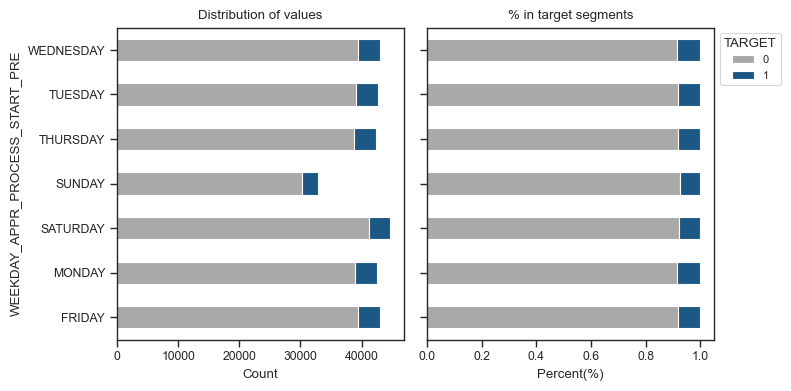

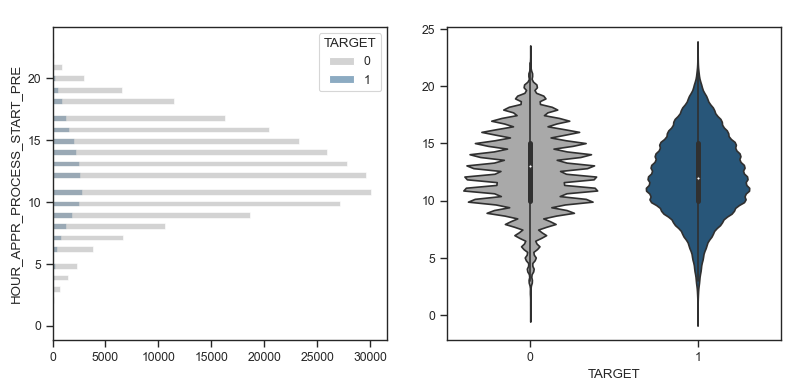

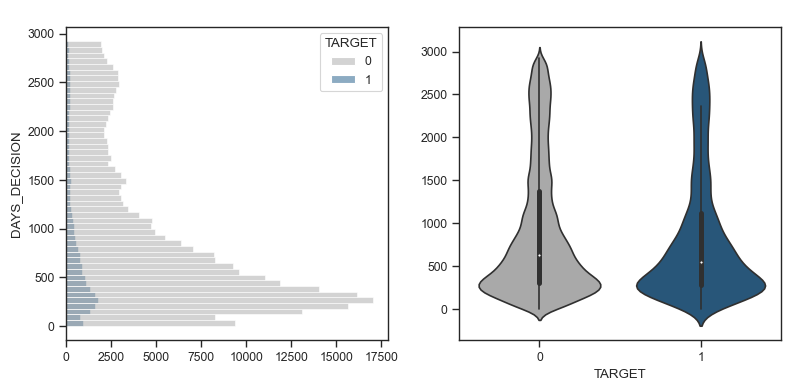

In [132]:
# Bivariate analysis
group = app_pre_structure[app_pre_structure.GROUP=='LOAN_PROCESS_HISTORY']
group_analysis(data=combined_df,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

##### OTHER_INFO

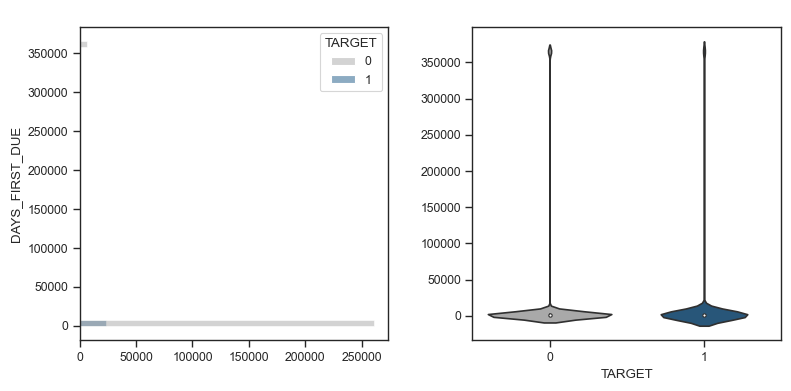

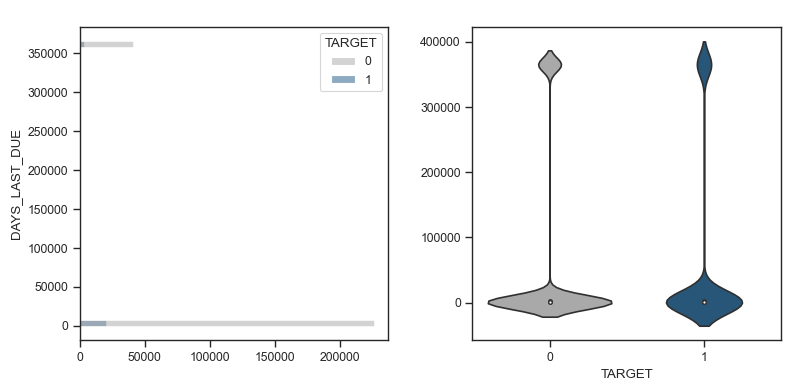

In [133]:
# Bivariate analysis
group = app_pre_structure[app_pre_structure.GROUP=='OTHER_INFO']
group_analysis(data=combined_df,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')

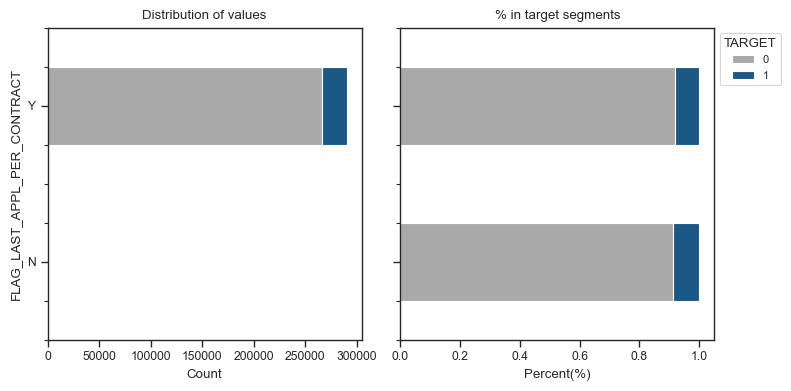

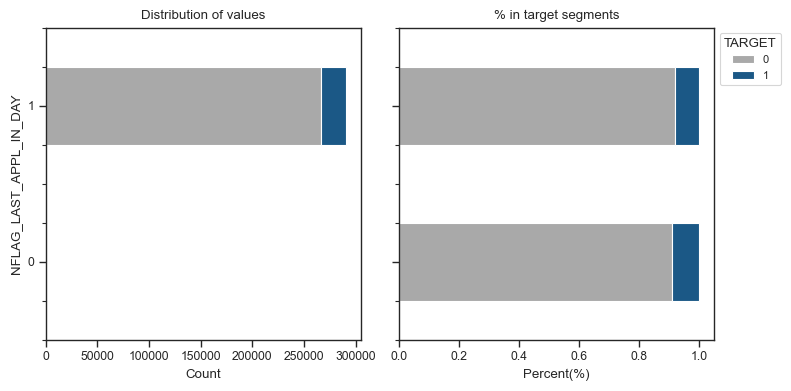

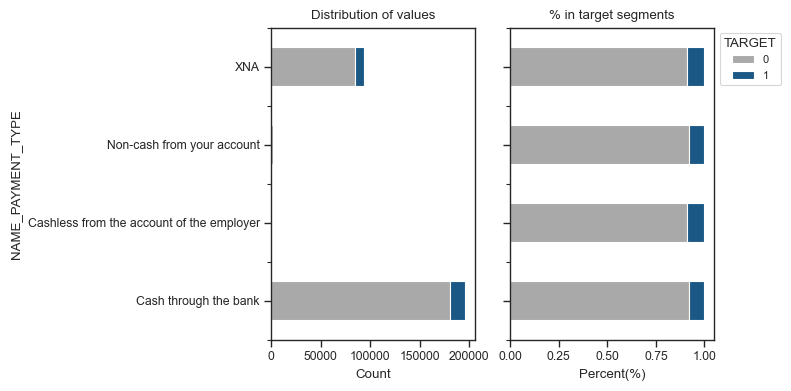

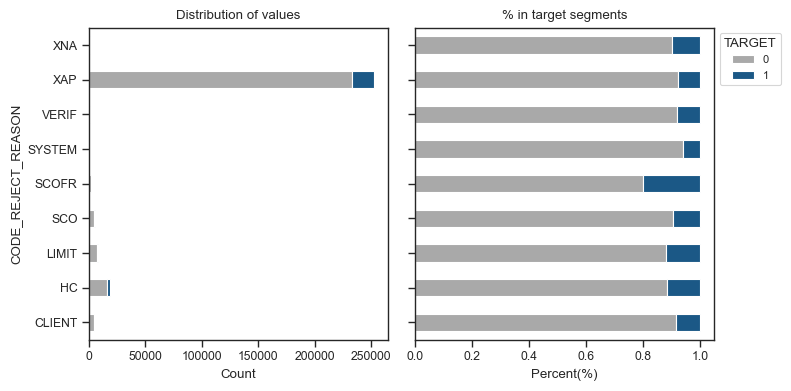

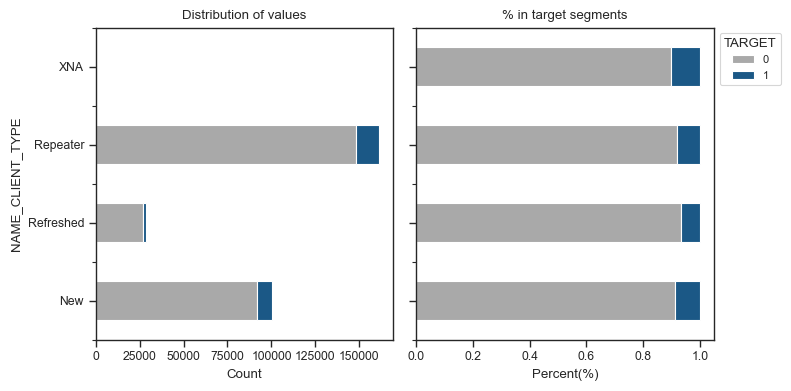

...

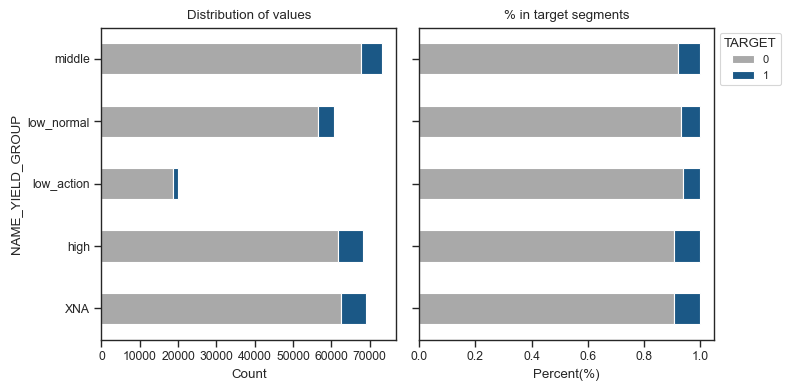

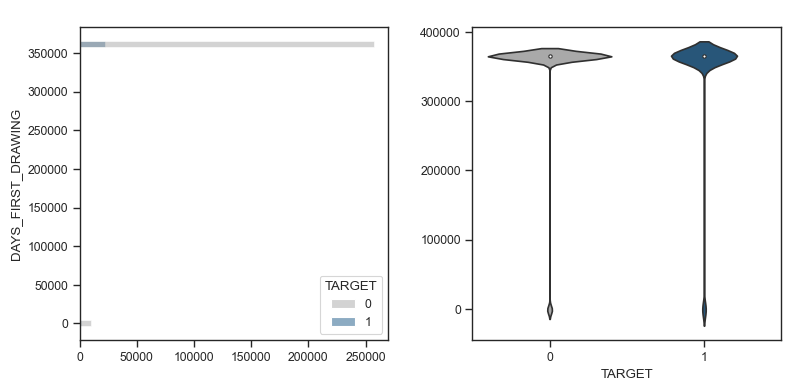

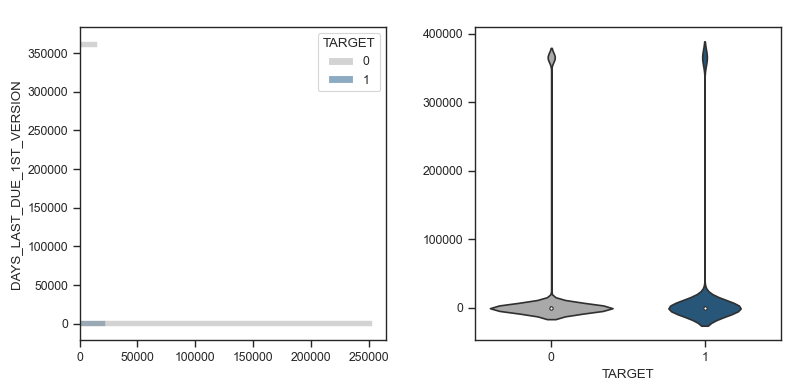

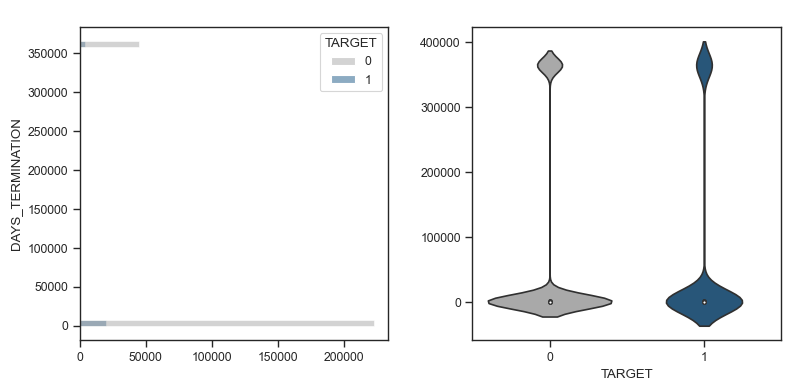

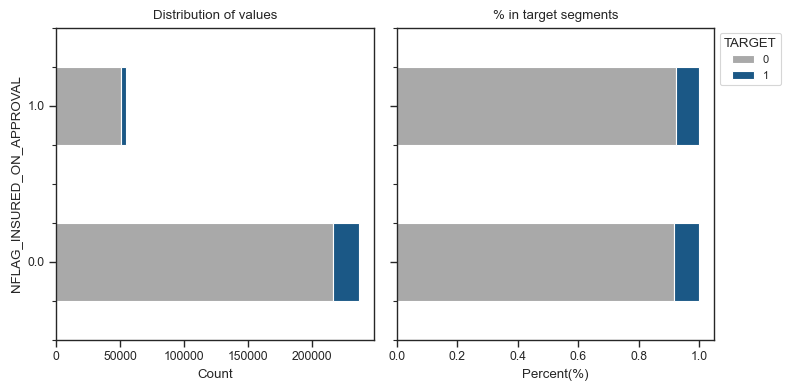

In [134]:
# Bivariate analysis
group = app_pre_structure[(app_pre_structure.GROUP=='NA') & ~(app_pre_structure.COLUMN_NAME.isin(['SK_ID_PREV','SK_ID_CURR_PRE']))]
group_analysis(data=combined_df,data_structure=group, cols=group.COLUMN_NAME, analysis_type='bivariate')